<h1 style='text-align:center;border:10px double;border-color:gray;'>
    <br/>
     PROJET 4<br/>
    <br/>
    <font color = 'Navy'>"Anticipez les besoins en consommation de bâtiments"</font>
    <br/>
    <br/>
    
</h1>
<h4 style='text-align:left;border-color:gray;'>
    <br/>
    <font color = 'Navy'>* notebook de l'analyse exploratoire</font>
    <br/>
</h4>

 Dirigé par :   [Pouria Forouzesh](https://www.linkedin.com/in/pouria-forouzesh/)

## Rappel du contexte :

Vous travaillez pour la **ville de Seattle**. Pour atteindre son objectif de ville neutre en émissions de carbone en 2050, votre équipe s’intéresse de près à la consommation et aux émissions des **bâtiments non destinés à l’habitation**.


![texte alternatif](photo.png)

**Les données**

Des relevés minutieux ont été effectués par les agents de la ville en 2016. Voici [les données et leur source](https://data.seattle.gov/dataset/2016-Building-Energy-Benchmarking/2bpz-gwpy). Cependant, ces relevés sont coûteux à obtenir, et à partir de ceux déjà réalisés, **vous voulez tenter de prédire les émissions de CO2 et la consommation totale d’énergie** de bâtiments **non destinés à l’habitation** pour lesquels elles n’ont pas encore été mesurées.

Vous cherchez également à **évaluer l’intérêt de l’"[ENERGY STAR Score](https://www.energystar.gov/buildings/benchmark/analyze_benchmarking_results)" pour la prédiction d’émissions**, qui est fastidieux à calculer avec l’approche utilisée actuellement par votre équipe. Vous l'intégrerez dans la modélisation et jugerez de son intérêt.

Vous sortez tout juste d’une réunion de brief avec votre équipe. Voici un récapitulatif de votre mission :

`1)` **Réaliser une courte analyse exploratoire.**

`2)` **Tester différents modèles de prédiction afin de répondre au mieux à la problématique.**




Avant de quitter la salle de brief, Douglas, le **project lead**, vous donne quelques pistes et erreurs à éviter :

**Douglas** : L’objectif est de te passer des relevés de consommation annuels futurs (attention à la fuite de données). Nous ferons de toute façon pour tout nouveau bâtiment un premier relevé de référence la première année, donc rien ne t'interdit d’en déduire des variables structurelles aux bâtiments, par exemple la nature et proportions des sources d’énergie utilisées.. 

Fais bien attention au traitement des différentes variables, à la fois pour trouver de nouvelles informations (peut-on déduire des choses intéressantes d’une simple adresse ?) et optimiser les performances en appliquant des transformations simples aux variables (normalisation, passage au log, etc.).

Mets en place une évaluation rigoureuse des performances de la régression, et optimise les hyperparamètres et le choix d’algorithmes de ML à l’aide d’une validation croisée.




### Table de matière

In [1]:
import numpy as np
import pandas as pd
import matplotlib as mpl
%matplotlib inline
import matplotlib.pyplot as plt
import missingno as msno
import plotly
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
import plotly.express as px
import seaborn as sns
import sys
import time 
from IPython.display import HTML
%pylab inline


from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer





# Masquer les avertissements pandas
import warnings
warnings.filterwarnings('ignore', category=pd.errors.PerformanceWarning)
warnings.filterwarnings('ignore', category=pd.errors.DtypeWarning)
warnings.filterwarnings('ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', 100)
pd.pandas.set_option('display.max_columns', None)

# Versions
print('Version des librairies utilisées :')

print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Python                : ' + sys.version)
print('Plotly                : ' + plotly.__version__)
print('Matplotlib            : ' + mpl.__version__)
print('Seaborn               : ' + sns.__version__)
print('sklearn               : ' + sklearn.__version__)

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


C:\Users\pouri\anaconda3\lib\site-packages\IPython\core\magics\pylab.py:162: UserWarning:

pylab import has clobbered these variables: ['re']
`%matplotlib` prevents importing * from pylab and numpy



Version des librairies utilisées :
NumPy                 : 1.23.4
Pandas                : 1.4.2
Python                : 3.8.15 (default, Nov 24 2022, 14:38:14) [MSC v.1916 64 bit (AMD64)]
Plotly                : 5.6.0
Matplotlib            : 3.4.3
Seaborn               : 0.11.2


<IPython.core.display.Javascript object>

sklearn               : 1.1.3


## 1. Description des données

### 1.1 Affichage des données

In [2]:
df = pd.read_csv('2016_Building_Energy_Benchmarking.csv')
print(df.shape)
df.head(3)

(3376, 46)


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.0,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.0,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.0,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19


In [3]:
if False:    
    import folium
    m = folium.Map()
    m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()],
                   zoom_start=11)
    for i in range(0,len(df)):
        folium.Circle([df.iloc[i]['Latitude'],df.iloc[i]['Longitude']], 
                      popup=df.iloc[i]['Address'], radius =100).add_to(m)
    m
#m

### 1.2 Structure des données

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
OSEBuildingID,3376.0,2.120899e+04,1.222376e+04,1.00000,19990.750000,2.311200e+04,2.599425e+04,5.022600e+04
DataYear,3376.0,2.016000e+03,0.000000e+00,2016.00000,2016.000000,2.016000e+03,2.016000e+03,2.016000e+03
ZipCode,3360.0,9.811695e+04,1.861520e+01,98006.00000,98105.000000,9.811500e+04,9.812200e+04,9.827200e+04
CouncilDistrictCode,3376.0,4.439277e+00,2.120625e+00,1.00000,3.000000,4.000000e+00,7.000000e+00,7.000000e+00
Latitude,3376.0,4.762403e+01,4.775842e-02,47.49917,47.599860,4.761867e+01,4.765712e+01,4.773387e+01
Longitude,3376.0,-1.223348e+02,2.720329e-02,-122.41425,-122.350662,-1.223325e+02,-1.223194e+02,-1.222210e+02
YearBuilt,3376.0,1.968573e+03,3.308816e+01,1900.00000,1948.000000,1.975000e+03,1.997000e+03,2.015000e+03
NumberofBuildings,3368.0,1.106888e+00,2.108402e+00,0.00000,1.000000,1.000000e+00,1.000000e+00,1.110000e+02
NumberofFloors,3376.0,4.709123e+00,5.494465e+00,0.00000,2.000000,4.000000e+00,5.000000e+00,9.900000e+01
PropertyGFATotal,3376.0,9.483354e+04,2.188376e+05,11285.00000,28487.000000,4.417500e+04,9.099200e+04,9.320156e+06


In [6]:
df.describe(include='object').T

,count,unique,top,freq
BuildingType,3376,8,NonResidential,1460
PrimaryPropertyType,3376,24,Low-Rise Multifamily,987
PropertyName,3376,3362,Northgate Plaza,3
Address,3376,3354,2600 SW Barton St,4
City,3376,1,Seattle,3376
State,3376,1,WA,3376
TaxParcelIdentificationNumber,3376,3268,1625049001,8
Neighborhood,3376,19,DOWNTOWN,573
ListOfAllPropertyUseTypes,3367,466,Multifamily Housing,866
LargestPropertyUseType,3356,56,Multifamily Housing,1667


- **SiteEnergyUse(kBtu)** = La quantité annuelle d’énergie consommée par la propriété à partir de toutes les sources d’énergie.
- **TotalGHGEmissions** = La quantité totale d’émissions de gaz à effet de serre, y compris le dioxyde de carbone, le méthane et l’oxyde nitreux rejetés dans l’atmosphère en raison de la consommation d’énergie sur la propriété, mesurée en tonnes métriques d’équivalent dioxyde de carbone. Ce calcul utilise un facteur d’émissions de GES du portefeuille de ressources de production de Seattle CIty Light. Cela utilise le facteur d’émissions de Seattle City Light de 2015 de 52,44 lb CO2e / MWh jusqu’à ce que le facteur 2016 soit disponible. Facteur de vapeur Enwave = 170,17 lb CO2e/MMBtu. Facteur de gaz provenant de EPA Portfolio Manager = 53,11 kg d’équivalent CO2/MBtu

## 2. Nettoyage des données

## Feature engineering

### Traitement les valeurs aberrant et atypique

**Correction de SiteEnergyUse(kBtu)**

In [7]:
df[df['SiteEnergyUse(kBtu)'] == 0].T[30:]

,28,31,62,81,85,95,133,139,152,304,614,630,746,760,1361,1549,1894,3166
SiteEUIWN(kBtu/sf),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SourceEUI(kBtu/sf),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SourceEUIWN(kBtu/sf),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SiteEnergyUse(kBtu),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SiteEnergyUseWN(kBtu),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SteamUse(kBtu),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Electricity(kWh),0.0,438691.6875,176088.0938,497706.8125,687906.875,616730.8125,0.0,0.0,0.0,0.0,573642.5,420163.0938,0.0,0.0,0.0,0.0,0.0,0.0
Electricity(kBtu),0.0,1496816.0,600813.0,1698176.0,2347138.0,2104286.0,0.0,0.0,0.0,0.0,1957268.0,1433596.0,0.0,0.0,0.0,0.0,0.0,0.0
NaturalGas(therms),0.0,0.0,0.0,0.0,0.0,0.0,43189.17188,32178.77344,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9455.367188,49936.19531
NaturalGas(kBtu),0.0,0.0,0.0,0.0,0.0,0.0,4318917.0,3217877.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,945537.0,4993620.0


Le calcul de la consommation d'énergie du site prend en compte tous les types d'énergie consommés par un bâtiment, y compris l'électricité, le gaz naturel, le fioul, le propane, le charbon, le bois et d'autres combustibles. Pour calculer la consommation d'énergie du site en kilo-BTU, on peut utiliser la formule suivante :

SiteEnergyUse(kBtu) = Electricité (kWh) * 3,412 + Gaz naturel (thermes) * 100 000 + Mazout (gal) * 138 700 + Propane (gal) * 91 600 + Charbon (tonnes) * 20 000 + Bois (tonnes) * 5 200

In [8]:
#Valeur dispo dans la colonne  Electricité (kWh)

line_list_elec = [31, 62, 81, 85, 95, 614, 630]
for a in line_list_elec:
    df.loc[a, 'SiteEnergyUse(kBtu)'] = df.loc[a, 'Electricity(kWh)'] * 3.412

In [9]:
#Valeur dispo dans la colonne  Gaz naturel (thermes)

line_list_gaz = [133, 139, 1894, 3166]
for a in line_list_gaz:
    df.loc[a, 'SiteEnergyUse(kBtu)'] = df.loc[a, 'NaturalGas(therms)'] * 100000

In [10]:
df[df['SiteEnergyUse(kBtu)'] == 0].T[30:]

,28,152,304,746,760,1361,1549
SiteEUIWN(kBtu/sf),0.0,0.0,0.0,0.0,0.0,0.0,0.0
SourceEUI(kBtu/sf),0.0,0.0,0.0,0.0,0.0,0.0,0.0
SourceEUIWN(kBtu/sf),0.0,0.0,0.0,0.0,0.0,0.0,0.0
SiteEnergyUse(kBtu),0.0,0.0,0.0,0.0,0.0,0.0,0.0
SiteEnergyUseWN(kBtu),0.0,0.0,0.0,0.0,0.0,0.0,0.0
SteamUse(kBtu),0.0,0.0,0.0,0.0,0.0,0.0,0.0
Electricity(kWh),0.0,0.0,0.0,0.0,0.0,0.0,0.0
Electricity(kBtu),0.0,0.0,0.0,0.0,0.0,0.0,0.0
NaturalGas(therms),0.0,0.0,0.0,0.0,0.0,0.0,0.0
NaturalGas(kBtu),0.0,0.0,0.0,0.0,0.0,0.0,0.0


**Correction du nombre de bâtiment**

In [11]:
df.NumberofBuildings.unique()

array([  1.,   3.,   0.,   2.,   4.,  27.,   6.,  11.,  14.,   9.,   5.,
        nan,   7.,   8.,  16.,  23.,  10., 111.])

In [12]:
df.NumberofBuildings.value_counts(ascending= False)

1.0      3175
0.0        92
2.0        37
3.0        22
4.0        12
5.0        10
6.0         5
8.0         3
10.0        2
14.0        2
9.0         2
7.0         1
11.0        1
16.0        1
23.0        1
27.0        1
111.0       1
Name: NumberofBuildings, dtype: int64

In [13]:
df[df.NumberofBuildings == 0.0].index

Int64Index([  63,   76,  160,  201,  241,  264,  278,  280,  291,  358,  365,
             417,  429,  433,  477,  481,  488,  494,  544,  608,  672,  729,
             769,  809,  840,  901,  952,  979,  985, 1002, 1025, 1029, 1050,
            1177, 1206, 1218, 1222, 1244, 1256, 1317, 1374, 1377, 1439, 1571,
            1606, 1942, 1987, 2054, 2115, 2130, 2166, 2180, 2188, 2214, 2251,
            2260, 2262, 2288, 2319, 2360, 2382, 2405, 2407, 2441, 2455, 2482,
            2501, 2511, 2534, 2564, 2631, 2635, 2708, 2715, 2747, 2782, 2858,
            2940, 2963, 2986, 3049, 3054, 3106, 3108, 3121, 3143, 3155, 3184,
            3202, 3205, 3232, 3259],
           dtype='int64')

Les batiments avec un nombre de batiments à 0 sont impossible. On replacera donc 0 par 1.

In [14]:
df.loc[df.NumberofBuildings == 0.0,"NumberofBuildings"] = 1 

In [15]:
df[df.NumberofBuildings == 0.0].index

Int64Index([], dtype='int64')

**Correction de SourceEUIWN(kBtu/sf)**

In [16]:
df[df['SourceEUIWN(kBtu/sf)']<0]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
3206,49784,2016,NonResidential,Small- and Mid-Sized Office,Bullitt Center,1501 E. Madison St.,Seattle,WA,98122.0,7234600195,3,CENTRAL,47.61432,-122.31257,2013,1.0,6,52000,0,52000,Office,Office,48159.0,NaN,NaN,NaN,NaN,NaN,100.0,7.1,5.0,2.0,-2.1,342726.0938,240132.0938,0.0,-33826.80078,-115417.0,0.0,0.0,False,NaN,Compliant,NaN,-0.8,-0.02


In [17]:
df['SourceEUIWN(kBtu/sf)'].median()

101.0999985

In [18]:
df['SourceEUIWN(kBtu/sf)'].value_counts()

0.000000      36
73.599998      9
87.300003      9
75.500000      8
104.599998     8
              ..
131.800003     1
229.800003     1
53.099998      1
44.400002      1
767.799988     1
Name: SourceEUIWN(kBtu/sf), Length: 1694, dtype: int64

In [19]:
df.loc[df['SourceEUIWN(kBtu/sf)'] < 0.0, 'SourceEUIWN(kBtu/sf)'] = df['SourceEUIWN(kBtu/sf)'].median()

In [20]:
df[df['SourceEUIWN(kBtu/sf)']<0]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity


**Correction de Electricity(kWh)**

In [21]:
df['Electricity(kWh)'].sort_values()

3206   -33826.80078
1549        0.00000
152         0.00000
513         0.00000
1361        0.00000
           ...     
2321            NaN
2474            NaN
2480            NaN
2670            NaN
3348            NaN
Name: Electricity(kWh), Length: 3376, dtype: float64

In [22]:
df['Electricity(kWh)'] < 0
df[df['Electricity(kWh)'] < 0]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
3206,49784,2016,NonResidential,Small- and Mid-Sized Office,Bullitt Center,1501 E. Madison St.,Seattle,WA,98122.0,7234600195,3,CENTRAL,47.61432,-122.31257,2013,1.0,6,52000,0,52000,Office,Office,48159.0,NaN,NaN,NaN,NaN,NaN,100.0,7.1,5.0,2.0,101.099998,342726.0938,240132.0938,0.0,-33826.80078,-115417.0,0.0,0.0,False,NaN,Compliant,NaN,-0.8,-0.02


SiteEnergyUse(kBtu) = Electricité (kWh) * 3,412 + Gaz naturel (thermes) * 100 000 + .....

In [23]:
df_elec_offic = df[df['PrimaryPropertyType'] == 'Small- and Mid-Sized Office'][['PrimaryPropertyType','Electricity(kWh)','Electricity(kBtu)']]
df_elec_offic

,PrimaryPropertyType,Electricity(kWh),Electricity(kBtu)
32,Small- and Mid-Sized Office,3.964957e+05,1352843.0
39,Small- and Mid-Sized Office,1.257792e+06,4291585.0
40,Small- and Mid-Sized Office,4.629980e+05,1579749.0
46,Small- and Mid-Sized Office,1.486510e+06,5071973.0
58,Small- and Mid-Sized Office,5.797860e+05,1978230.0
...,...,...,...
3206,Small- and Mid-Sized Office,-3.382680e+04,-115417.0
3218,Small- and Mid-Sized Office,7.164709e+05,2444599.0
3259,Small- and Mid-Sized Office,5.805297e+05,1980767.0
3312,Small- and Mid-Sized Office,3.787091e+05,1292155.0


In [24]:
# Remplacer les valeurs négatives de ces colonnes par la médiane de son groupe (Small- and Mid-Sized Office)
df.loc[3206, 'Electricity(kWh)'] = df_elec_offic['Electricity(kWh)'].median()

df.loc[3206, 'Electricity(kBtu)'] = df_elec_offic['Electricity(kBtu)'].median()

df.loc[3206, :][['Electricity(kWh)','Electricity(kBtu)']]

Electricity(kWh)     430331.6563
Electricity(kBtu)      1468291.5
Name: 3206, dtype: object

**Correction de NumberofFloors**

In [25]:
df.NumberofFloors.sort_values(ascending=True).unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 36, 37, 38, 39, 40, 41, 42, 46, 47, 49, 55, 56, 63, 76, 99],
      dtype=int64)

In [26]:
#Observons le type de batiment qui a la valeur 99. 
df[df.NumberofFloors == df.NumberofFloors.max()]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
1359,21611,2016,NonResidential,Worship Facility,Seattle Chinese Baptist Church,5801 Beacon Avenue South,Seattle,WA,98108.0,2124049098,2,GREATER DUWAMISH,47.55072,-122.30265,1977,1.0,99,21948,0,21948,Worship Facility,Worship Facility,21948.0,NaN,NaN,NaN,NaN,NaN,80.0,14.9,14.9,46.599998,46.599998,326001.1875,326001.1875,0.0,95545.5,326001.0,0.0,0.0,False,NaN,Compliant,NaN,2.27,0.1


Après vérification sur internet il se trouve que cette église a un étage, c'est donc une erreur

In [27]:
df.NumberofFloors.replace(99,1, inplace = True)


**Analyse des quartiers, districts et codes postaux**

In [28]:
neighborhoods = (df['Neighborhood'].unique())
district_codes = df['CouncilDistrictCode'].unique()
display(sorted(neighborhoods))
display(len(neighborhoods))
display(sorted(district_codes))
display(len(district_codes))

['BALLARD',
 'Ballard',
 'CENTRAL',
 'Central',
 'DELRIDGE',
 'DELRIDGE NEIGHBORHOODS',
 'DOWNTOWN',
 'Delridge',
 'EAST',
 'GREATER DUWAMISH',
 'LAKE UNION',
 'MAGNOLIA / QUEEN ANNE',
 'NORTH',
 'NORTHEAST',
 'NORTHWEST',
 'North',
 'Northwest',
 'SOUTHEAST',
 'SOUTHWEST']

19

[1, 2, 3, 4, 5, 6, 7]

7

In [29]:
# Mettons les quariers en majuscule
df['Neighborhood'] = df['Neighborhood'].apply(lambda x : x.upper())
neighborhoods = (df['Neighborhood'].unique())
display(sorted(neighborhoods))
display(len(neighborhoods))

['BALLARD',
 'CENTRAL',
 'DELRIDGE',
 'DELRIDGE NEIGHBORHOODS',
 'DOWNTOWN',
 'EAST',
 'GREATER DUWAMISH',
 'LAKE UNION',
 'MAGNOLIA / QUEEN ANNE',
 'NORTH',
 'NORTHEAST',
 'NORTHWEST',
 'SOUTHEAST',
 'SOUTHWEST']

14

In [30]:
zones_infos = {}
for district_code in district_codes:
    temp = df[df['CouncilDistrictCode']==district_code]['Neighborhood'].unique()
    zones_infos[district_code]=temp.tolist()

display(HTML('<br />'))

i=0
for group,subgroups in zones_infos.items():
    text = "<strong>" + str(group) + ": </strong>"
    for subgroup in subgroups:
        text += str(subgroup) + ", "
        i = i +1
    display(HTML(text+'<br />'))
    
display(HTML('<br />'))

print('Il y a {} groupe/sous-catégories et {} catégories uniques'.format(i,len(neighborhoods))) 

Il y a 29 groupe/sous-catégories et 14 catégories uniques


Les codes postaux sont indépendants. Les quartiers devraient étre attribués par district selon le site officiel de la ville de seattle:
https://www.seattle.gov/neighborhoods/neighborhoods-and-districts mais ce n'est pas du tout le cas dans nos données actuelles, ont peut se demander s'il y a eu un remaniement des quartier depuis ou pas ou si les odnnées sont incohérentes

Les anomalies sont DOWTOWN (7 et 3), EAST(7, 2, 3), NORTHWEST (5, 6), NORTHEAST(4, 3, 5) , GREATER DUWAMISH (1, 2, 3), LAKE UNION (3, 4, 6, 7), SOUTHEAST (2 et 3), NORTH (5 et 4)

Traitons le cas de downtown:

![texte alternatif](photo2.png)



In [31]:
test1 = df[(df['CouncilDistrictCode']==7) & (df['Neighborhood']=='DOWNTOWN')]
display(test1)
test2 = df[(df['CouncilDistrictCode']==2) & (df['Neighborhood']=='DOWNTOWN')]
display(test2)
test3 = df[(df['CouncilDistrictCode']==3) & (df['Neighborhood']=='DOWNTOWN')]
display(test3)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.00,1.156514e+06,3946027.0,12764.529300,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.00,9.504252e+05,3242851.0,51450.816410,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.00,1.451544e+07,49526664.0,14938.000000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6794584.0,6946800.5,2214446.25,8.115253e+05,2768924.0,18112.130860,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.00,1.573449e+06,5368607.0,88039.984380,8803998.0,False,NaN,Compliant,NaN,505.01,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3302,50014,2016,Multifamily HR (10+),High-Rise Multifamily,Premiere on Pine,1525 9th ave,Seattle,WA,98101.0,0660000915,7,DOWNTOWN,47.61324,-122.33223,2014,1.0,41,499477,0,499477,"Multifamily Housing, Parking, Restaurant",Multifamily Housing,307810.0,Parking,100000.0,NaN,NaN,NaN,40.0,67.099998,0.000000,140.100006,0.000000,20657852.0,0.0,0.00,3.004149e+06,10250156.0,103704.351600,10370435.0,False,NaN,Compliant,NaN,622.23,1.25
3315,50029,2016,Multifamily HR (10+),High-Rise Multifamily,Walton Lofts,75 Vine St,Seattle,WA,98121.0,0653000195,7,DOWNTOWN,47.61428,-122.35056,2014,1.0,12,123686,0,123686,"Multifamily Housing, Parking",Multifamily Housing,152301.0,Parking,0.0,NaN,NaN,NaN,77.0,29.700001,30.000000,76.800003,77.800003,4524791.0,4573978.0,0.00,9.739330e+05,3323059.0,12017.311520,1201731.0,False,NaN,Compliant,NaN,86.99,0.70
3319,50035,2016,NonResidential,Hotel,Hilton Garden Inn Seattle,1821 Boren Ave,Seattle,WA,98101.0,3374400010,7,DOWNTOWN,47.61665,-122.33261,2015,1.0,14,144614,0,144614,Hotel,Hotel,159500.0,NaN,NaN,NaN,NaN,NaN,89.0,34.599998,34.799999,105.400002,105.599998,5525072.5,5547964.5,0.00,1.544316e+06,5269208.0,2558

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
100,163,2016,Nonresidential COS,Other,Fire Station 10/FAC/EOC,105 5th Ave S,Seattle,WA,98104.0,5247801465,2,DOWNTOWN,47.60112,-122.32785,2006,1.0,4,61156,0,61156,"Office, Other",Other,42755.0,Office,29219.0,NaN,NaN,NaN,NaN,130.100006,132.699997,338.299988,337.100006,9.363374e+06,9.550716e+06,0.0,2.036128e+06,6.947270e+06,24161.041020,2.416104e+06,False,NaN,Compliant,NaN,176.75,2.89
101,167,2016,NonResidential,Other,Wing Luke Museum,719 South King Street,Seattle,WA,98104.0,5247802715,2,DOWNTOWN,47.59809,-122.32283,1910,1.0,4,72820,13820,59000,Museum,Museum,58000.0,NaN,NaN,NaN,NaN,NaN,NaN,34.700001,36.099998,83.699997,85.199997,2.010455e+06,2.095175e+06,0.0,3.844283e+05,1.311669e+06,6987.850098,6.987850e+05,False,NaN,Compliant,NaN,46.26,0.64
171,278,2016,NonResidential,Senior Care Community,ID Village Square 1,802 S. Dearborn St.,Seattle,WA,98104.0,8592900105,2,DOWNTOWN,47.59626,-122.32180,1999,1.0,5,102796,12611,90185,"K-12 School, Medical Office, Office, Restauran...",Senior Care Community,55259.0,Medical Office,40091.0,K-12 School,3231.0,NaN,NaN,98.300003,100.000000,254.300003,256.100006,1.010538e+07,1.028140e+07,0.0,2.177262e+06,7.428816e+06,26765.611330,2.676561e+06,False,NaN,Compliant,NaN,193.94,1.89
383,538,2016,NonResidential,Large Office,Fifth and Jackson,315 Fifth Avenue,Seattle,WA,98104.0,5247801292,2,DOWNTOWN,47.59963,-122.32796,2002,1.0,10,181694,38186,143508,"Office, Other, Parking",Office,150840.0,Parking,26946.0,Other,2155.0,NaN,88.0,49.900002,50.900002,156.800003,159.699997,7.637986e+06,7.783714e+06,0.0,2.238566e+06,7.637985e+06,0.000000,0.000000e+00,False,NaN,Compliant,NaN,53.25,0.29
448,608,2016,NonResidential,Large Office,411 1ST AVE S (ID608),411 1ST AVE S,Seattle,WA,98104.0,5247800200,2,DOWNTOWN,47.59878,-122.33458,1913,5.0,7,154159,0,154159,Office,Office,193154.0,NaN,NaN,NaN,NaN,NaN,100.0,58.000000,58.799999,28.000000,28.700001,1.119592e+07,1.134876e+07,0.0,4.715030e+05,1.608768e+06,3430.500488,3.430500e+05,False,NaN,Non-Compliant,Low outlier,29.43,0.19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3151,43867,2016,Multifamily MR (5-9),Mid-Rise Multifamily,Hong Kong Building,507 Maynard Ave S,Seattle,WA,98104.0,5247801915,2,DOWNTOWN,47.59801,-122.32544,1927,1.0,5,39493,8500,30993,"Multifamily Housing, Parking, Restaurant",Multifamily Housing,24015.0,Restaurant,8700.0,Parking,8500.0,NaN,NaN,126.400002,126.400002,221.399994,221.399994,4.133811e+06,4.133811e+06,0.0,4.070240e+05,1.388766e+06,27450.449220,2.745045e+06,False,NaN,Compliant,NaN,155.47,3.94
3286,49992,2016,Multifamily HR (10+),High-Rise Multifamily,Stadium Place,201 S King St.,Seattle,WA,98104.0,7953000000,2,DOWNTOWN,47.59785,-122.33235,2014,1.0,26,619416,0,619416,"Multifamily Housing, Parking, Retail Store",Multifamily Housing,430927.0,Parking,128823.0,Retail Store,16103.0,NaN,89.0,53.400002,55.200001,114.300003,116.400002,2.385356e+07,2.465542e+07,0.0,3.654376e+06,1.246873e+07,113848.265600,1.138483e+07,False,NaN,Compliant,NaN,691.57,1.12
3327,50049,2016,Multifamily LR (1-4),Low-Rise Multifamily,PACIFIC CENTER CONDOM

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
21,27,2016,NonResidential,Other,King County Correctional Facility,500 5TH AVE,Seattle,WA,98104.0,0942001010,3,DOWNTOWN,47.60378,-122.32842,1985,1.0,19,385274,0,385274,Other,Other,385274.0,NaN,NaN,NaN,NaN,NaN,NaN,124.199997,128.600006,229.500000,232.899994,4.785981e+07,4.953921e+07,0.0,5.351014e+06,18257661.0,296021.500000,29602150.0,False,NaN,Compliant,NaN,1699.45,4.41
233,357,2016,Nonresidential COS,Large Office,Seattle Municipal Tower (2030),700 Fifth Avenue,Seattle,WA,98104.0,0942000720,3,DOWNTOWN,47.60501,-122.32988,1990,1.0,63,1354987,159600,1195387,"Office, Parking",Office,1191115.0,Parking,159599.0,Other,18656.0,2014201320112010200920082007,89.0,50.400002,50.400002,158.100006,158.100006,6.157618e+07,6.157618e+07,0.0,1.804695e+07,61576180.0,0.000000,0.0,False,NaN,Compliant,NaN,429.27,0.32
234,358,2016,Nonresidential COS,Large Office,Justice Center,610 5th Ave,Seattle,WA,98104.0,0942000750,3,DOWNTOWN,47.60421,-122.32919,2001,1.0,14,310490,0,310490,"Data Center, Office, Other",Office,269284.0,Other,28394.0,Data Center,600.0,NaN,NaN,71.000000,73.599998,187.500000,189.500000,2.116950e+07,2.196082e+07,0.0,4.725684e+06,16124036.0,50454.648440,5045465.0,False,NaN,Compliant,NaN,380.37,1.23
577,772,2016,NonResidential,Large Office,800 Fifth Avenue,800 5th Ave,Seattle,WA,98104.0,0942000470,3,DOWNTOWN,47.60573,-122.33028,1981,1.0,42,1249055,201121,1047934,"Data Center, Medical Office, Office, Parking, ...",Office,983697.0,Parking,296815.0,Medical Office,12941.0,2016201520142013201220112010200920082007200620...,95.0,38.000000,39.599998,119.500000,124.300003,3.798071e+07,3.951836e+07,0.0,1.113151e+07,37980705.0,0.000000,0.0,False,NaN,Compliant,NaN,264.78,0.21
611,815,2016,NonResidential,Large Office,Fifth and Yesler,300 - 5th Avenue,Seattle,WA,98104.0,0942001155,3,DOWNTOWN,47.60214,-122.32726,2009,1.0,17,413264,138098,275166,"Office, Parking",Office,295494.0,Parking,94781.0,NaN,NaN,20172016,91.0,46.099998,46.099998,144.800003,144.800003,1.363114e+07,1.363114e+07,0.0,3.995058e+06,13631140.0,0.000000,0.0,False,NaN,Compliant,NaN,95.03,0.23
715,19696,2016,NonResidential,Retail Store,Lane St. Goodwill,1400 South Lane St,Seattle,WA,98144.0,0524049003,3,DOWNTOWN,47.59692,-122.31543,1917,1.0,2,147545,0,147545,Retail Store,Retail Store,147545.0,NaN,NaN,NaN,NaN,NaN,69.0,46.000000,49.700001,106.900002,110.800003,6.787070e+06,7.339108e+06,0.0,1.211463e+06,4133510.0,26535.591800,2653559.0,False,NaN,Compliant,NaN,169.75,1.15
1698,23158,2016,NonResidential,Warehouse,KOF Associates,1239 S. King St.,Seattle,WA,98144.0,8170100350,3,DOWNTOWN,47.59783,-122.31554,1956,1.0,2,25840,0,25840,Non-Refrigerated Warehouse,Non-Refrigerated Warehouse,25840.0,NaN,NaN,NaN,NaN,NaN,92.0,12.100000,12.000000,38.099998,37.700001,3.135281e+05,3.106023e+05,0.0,9.188980e+04,313528.0,0.000000,0.0,False,NaN,Compliant,NaN,2.19,0.08
1701,23164,2016,NonResidential,Small- and Mid-Sized Office,The Weller Building,1225 S Weller Street,Seattle,WA,98144.0,8170100455,3,DOWNTOWN,47.59728,-122.31587,2001,1.0,5,70332,22095,48237,"Office, Parking",Office,44417.0,Parking,25915.0,NaN,NaN,NaN,89.0,44.599998,45.000000,134.600006,135.100006,1.981115e+06,2.000777e+06,0.0,5.469238e+05,1866104.0,1150.1099

Au vue du nombre de valuer observée, le quartier downton semble appartenir au district 7 ce qui est bien cohérent avec les information officielles données par la ville de seattle (https://www.seattle.gov/neighborhoods/neighborhoods-and-districts). En regardant sur une map le quartier et le district pour 2 adresses de la liste erronnée je me suis aperçu que les 2 valeurs étaient fausses je pourrais supprimer les lignes en erreur.

Néanmoins pour les autres quartiers, certains n'existe même pas, Duwamish est un chef indien? Finalement je décide de stopper ici mon analyse sur les quartiers qui devient trop complexe.

In [32]:
print(df.shape)
df.drop(df[(df['CouncilDistrictCode']==3) & (df['Neighborhood']=='DOWNTOWN')].index , inplace=True)
print(df.shape)

display(sorted(neighborhoods))
display(len(neighborhoods))
display(district_codes)
display(len(district_codes))


(3376, 46)
(3366, 46)


['BALLARD',
 'CENTRAL',
 'DELRIDGE',
 'DELRIDGE NEIGHBORHOODS',
 'DOWNTOWN',
 'EAST',
 'GREATER DUWAMISH',
 'LAKE UNION',
 'MAGNOLIA / QUEEN ANNE',
 'NORTH',
 'NORTHEAST',
 'NORTHWEST',
 'SOUTHEAST',
 'SOUTHWEST']

14

array([7, 3, 2, 4, 5, 6, 1], dtype=int64)

7

In [33]:
zones_infos = {}
for district_code in district_codes:
    temp = df[df['CouncilDistrictCode']==district_code]['Neighborhood'].unique()
    zones_infos[district_code]=temp.tolist()

display(HTML('<br />'))

i=0
for group,subgroups in zones_infos.items():
    text = "<strong>" + str(group) + ": </strong>"
    for subgroup in subgroups:
        text += str(subgroup) + ", "
        i = i +1
    display(HTML(text+'<br />'))
    
display(HTML('<br />'))

print('Il y a {} groupe/sous-catégories et {} catégories uniques'.format(i,len(neighborhoods))) 

Il y a 28 groupe/sous-catégories et 14 catégories uniques


### Traitement les valeurs manquantes

<AxesSubplot:>

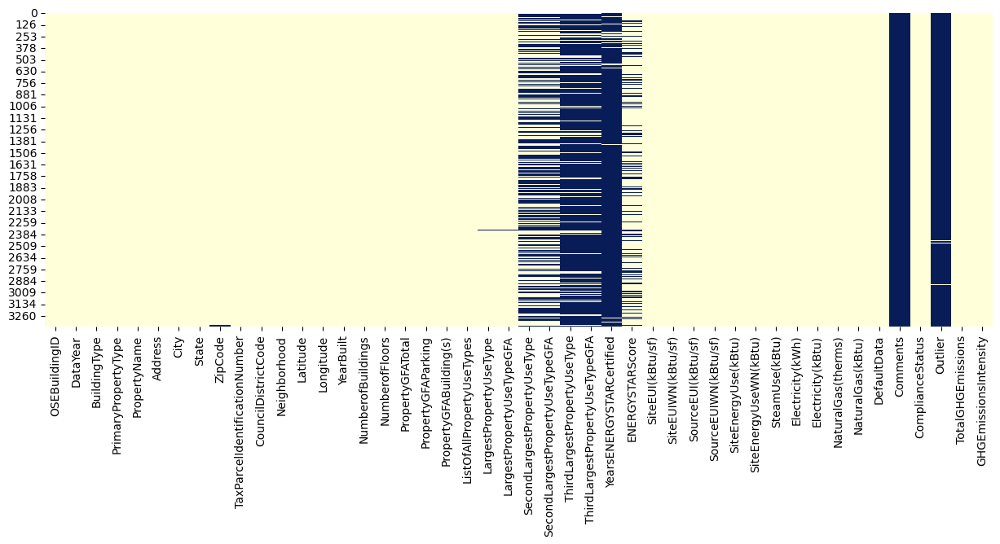

In [34]:
fig = plt.figure(figsize=(15,5))
sns.heatmap(df.isnull(), cbar=False, cmap='YlGnBu')

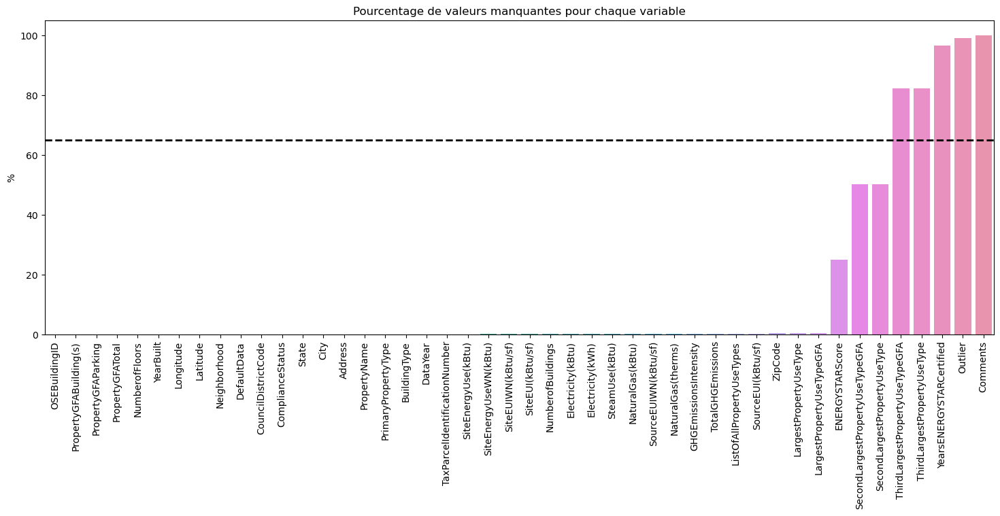

In [35]:
#On calcule la proportion de données manquantes pour chaque colonne et on plot !
fig = plt.figure(figsize=(18, 6))

# null_prop = df.isnull().sum(axis=0).sum()/len(df)/len(df.columns)*100
# plt.axhline(y=null_prop, color='k', linestyle='--', lw=2)
# plt.legend(['{:.2f}% global de données manquantes'.format(null_prop)], fontsize=13)
plt.axhline(y=65, color='k', linestyle='--', lw=2)

null = df.isnull().sum(axis=0).sort_values()/len(df)*100
sns.barplot(null.index, null.values)
plt.ylabel("%")
plt.title("Pourcentage de valeurs manquantes pour chaque variable")
plt.xticks(rotation=90)
plt.show()

In [36]:
def get_numbers_missing(df):
    nb_nan_tot = df.isna().sum().sum()
    nb_donnees_tot = np.product(df.shape)
    percent_nan_tot = round((nb_nan_tot / nb_donnees_tot) * 100, 2)
    print(f'Il y a {nb_nan_tot} de valeurs manquantes (NaN) pour un total de {nb_donnees_tot} données soit ({percent_nan_tot} %)')


def table_numbers_missing(df):
    values = df.isnull().sum()
    percentage = round(100 * (values / len(df)),2)
    
    table = pd.concat([values, percentage.round(2)], axis=1)
    table.columns = ['Nombres_de_valeurs_manquantes','Proportion_de_valeurs_manquantes_%']
    display(table[table['Nombres_de_valeurs_manquantes'] != 0]
                .sort_values('Proportion_de_valeurs_manquantes_%', ascending=False))


In [37]:
get_numbers_missing(df)

Il y a 19900 de valeurs manquantes (NaN) pour un total de 154836 données soit (12.85 %)


In [38]:
table_numbers_missing(df)

,Nombres_de_valeurs_manquantes,Proportion_de_valeurs_manquantes_%
Comments,3366,100.00
Outlier,3334,99.05
YearsENERGYSTARCertified,3250,96.55
ThirdLargestPropertyUseTypeGFA,2773,82.38
ThirdLargestPropertyUseType,2773,82.38
SecondLargestPropertyUseType,1693,50.30
SecondLargestPropertyUseTypeGFA,1693,50.30
ENERGYSTARScore,840,24.96
LargestPropertyUseType,20,0.59
LargestPropertyUseTypeGFA,20,0.59


In [39]:
features_nan_categ = [feature for feature in df.columns if df[feature].isna().sum()>0.5 and df[feature].dtype == 'O' ]

for feature in features_nan_categ:
    print('{}: {:.2f}% valeurs manquantes'.format(feature, ((df[feature].isnull().sum() / len(df)) * 100)))

ListOfAllPropertyUseTypes: 0.27% valeurs manquantes
LargestPropertyUseType: 0.59% valeurs manquantes
SecondLargestPropertyUseType: 50.30% valeurs manquantes
ThirdLargestPropertyUseType: 82.38% valeurs manquantes
YearsENERGYSTARCertified: 96.55% valeurs manquantes
Outlier: 99.05% valeurs manquantes


In [40]:
features_nan_num = [feature for feature in df.columns if df[feature].isnull().sum() > 0.5 and df[feature].dtype != 'O' ]

for feature in features_nan_num:
    print('{}: {:.2f}% valeurs manquantes'.format(feature, ((df[feature].isnull().sum() / len(df)) * 100)))


ZipCode: 0.48% valeurs manquantes
NumberofBuildings: 0.24% valeurs manquantes
LargestPropertyUseTypeGFA: 0.59% valeurs manquantes
SecondLargestPropertyUseTypeGFA: 50.30% valeurs manquantes
ThirdLargestPropertyUseTypeGFA: 82.38% valeurs manquantes
ENERGYSTARScore: 24.96% valeurs manquantes
SiteEUI(kBtu/sf): 0.21% valeurs manquantes
SiteEUIWN(kBtu/sf): 0.18% valeurs manquantes
SourceEUI(kBtu/sf): 0.27% valeurs manquantes
SourceEUIWN(kBtu/sf): 0.27% valeurs manquantes
SiteEnergyUse(kBtu): 0.15% valeurs manquantes
SiteEnergyUseWN(kBtu): 0.18% valeurs manquantes
SteamUse(kBtu): 0.27% valeurs manquantes
Electricity(kWh): 0.27% valeurs manquantes
Electricity(kBtu): 0.27% valeurs manquantes
NaturalGas(therms): 0.27% valeurs manquantes
NaturalGas(kBtu): 0.27% valeurs manquantes
Comments: 100.00% valeurs manquantes
TotalGHGEmissions: 0.27% valeurs manquantes
GHGEmissionsIntensity: 0.27% valeurs manquantes


**Traitement les colonnes ListOfAllPropertyUseTypes et  SecondLargestPropertyUseType et ThirdLargestPropertyUseType**

On considère qu'un Nan pour le second type d'usage et le troisième veut dire pas de d'usage. On met donc aussi la surface à 0

<AxesSubplot:>

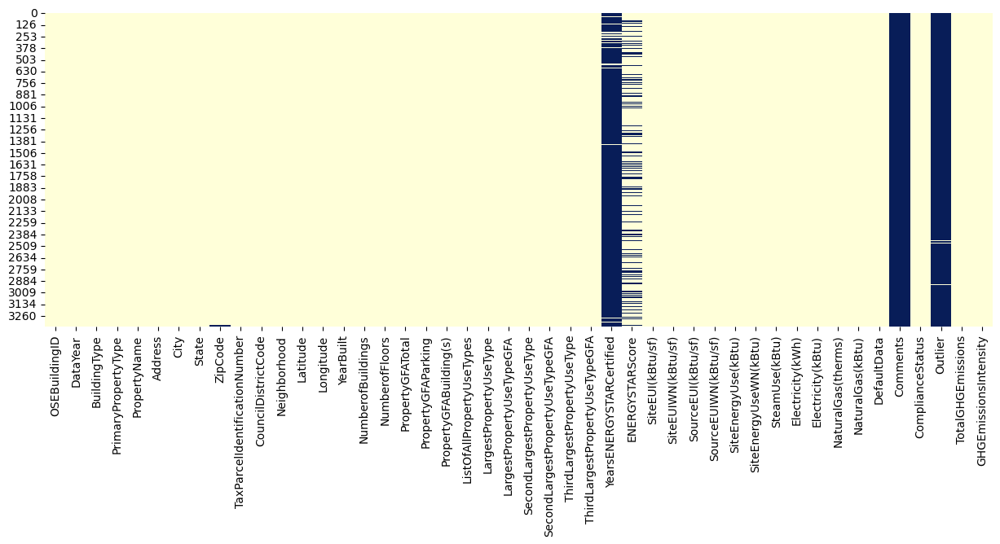

In [41]:
df.ListOfAllPropertyUseTypes = df.ListOfAllPropertyUseTypes.fillna(df.PrimaryPropertyType)


df.SecondLargestPropertyUseType = df.SecondLargestPropertyUseType.fillna("no use")
df.SecondLargestPropertyUseTypeGFA.fillna(value = 0, inplace =True)


df.ThirdLargestPropertyUseType = df.ThirdLargestPropertyUseType.fillna("no use")
df["ThirdLargestPropertyUseTypeGFA"].fillna(value = 0, inplace = True)

#Le plus grand usage et la liste des usages sont imputés par le premier type de propriété
df.LargestPropertyUseType = df.LargestPropertyUseType.fillna(df.PrimaryPropertyType)
df.LargestPropertyUseTypeGFA = df.LargestPropertyUseTypeGFA.fillna(0)

fig = plt.figure(figsize=(15,5))
sns.heatmap(df.isnull(), cbar=False, cmap='YlGnBu')

## Feature selection

**Suppression des variables à faible cardinalité et /ou inutiles**

In [42]:
df.ComplianceStatus.value_counts(normalize=True)

Compliant                       0.950980
Error - Correct Default Data    0.033571
Non-Compliant                   0.010992
Missing Data                    0.004456
Name: ComplianceStatus, dtype: float64

In [43]:
df.DefaultData.value_counts(normalize=True)

False    0.966429
True     0.033571
Name: DefaultData, dtype: float64

- **complianceStatus** : Si une propriété a satisfait aux exigences d'analyse comparative énergétique pour l'année de déclaration en cours. 92% des données correspondent, il n'y pas d'intérêt à conserver cette variable. 
    - On ne sais pas à quoi correspond **Error - Correct Default Data**.
- **DefaultData** : si un batiment à au moins une valeur par défault dans ses relevés. Il y a 94% de produits qui n'ont pas de valeurs par défault. La quasi totalité des données donc nous pouvons supprimer la variable. 
- L'étude se fait sur une ville et donc un seul Etat. Les variables **State** et **City** sont donc inutiles.
- Afin de localiser les bâtiments la **Longitude** et la **Latitude** seront les données utilisées. On supprime donc l'**adresse** et le **ZipCode**.
- **CouncilDistrictCode** district du bâtiment.La consommation en énergie d'un bâtiment ne peux pas dépendre de son district. 

In [44]:
df.drop(columns = ["DefaultData","State", "City", "ComplianceStatus",
                     "ZipCode","Address"], inplace = True)                     #"CouncilDistrictCode", "DataYear",

Nous avons différentes unités répertoriées : 
- **kWh** : kilowattheure
- **Therm** :  correspond approximativement à l'énergie libérée par la combustion de 2 kg (approx. 3 l) d'essence.
- **kBtu** :  British thermal unit
Nous choississons de travailler avec le **kBtu**. 

-----------------------
Le suffixe **WN** identifie les valeurs normalisées selon la météo. C'est la consommation d'énergie du site que la propriété aurait consommée dans des conditions météorologiques moyennes sur 30 ans. C'est donc déjà une prédiction. 

In [45]:
df.drop(columns = ['OSEBuildingID','Electricity(kWh)', 'NaturalGas(therms)',
                   'TaxParcelIdentificationNumber',
                   'SourceEUIWN(kBtu/sf)','SiteEUIWN(kBtu/sf)',
                   'SiteEnergyUseWN(kBtu)', 'GHGEmissionsIntensity'], inplace = True )

**Conservation des variables avec moins de 90% de valeurs manquantes**


In [46]:
df_supcol = df[df.columns[df.isna().sum()/df.shape[0] > 0.9]]
print('Colonnes enlevées:',list(df_supcol.columns))

Colonnes enlevées: ['YearsENERGYSTARCertified', 'Comments', 'Outlier']


In [47]:
df = df[df.columns[df.isna().sum()/df.shape[0] < 0.9]]

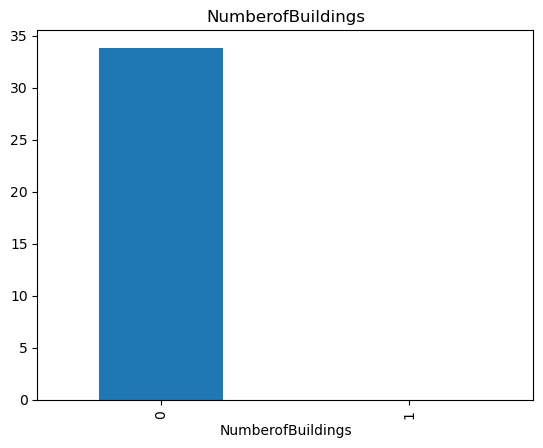

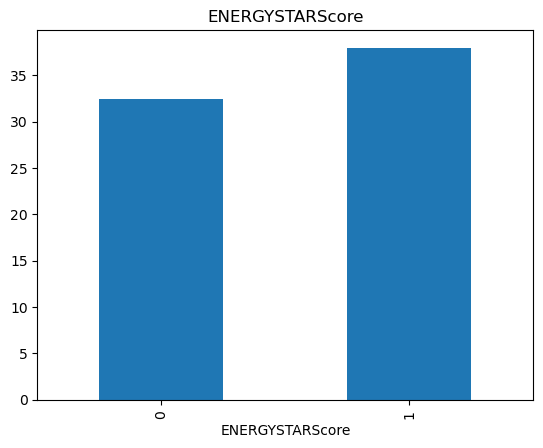

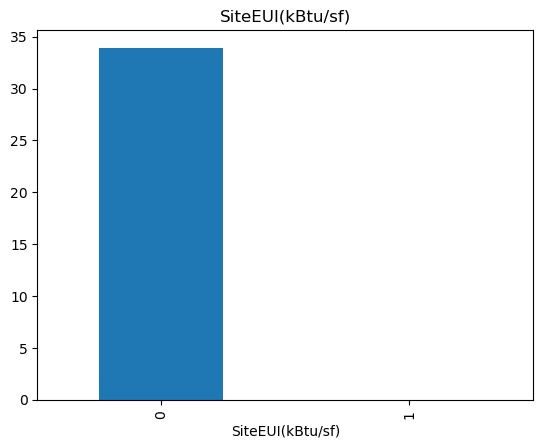

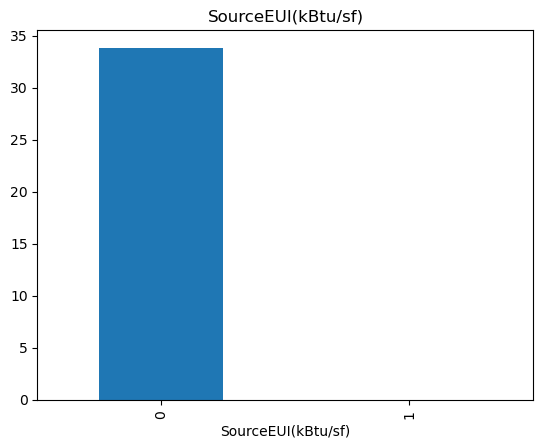

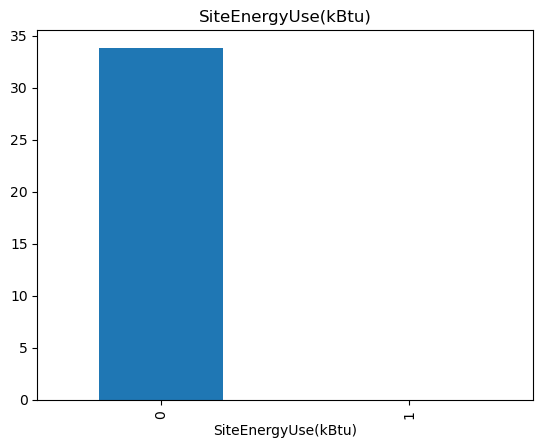

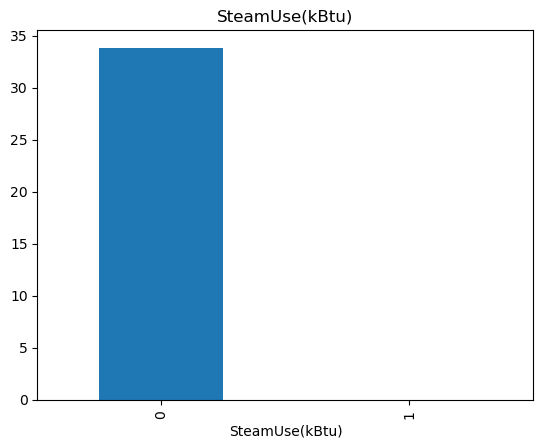

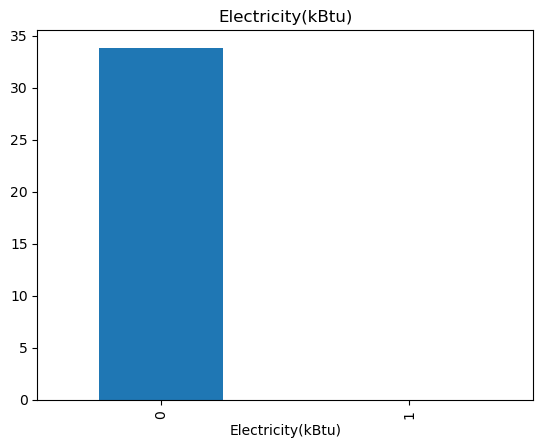

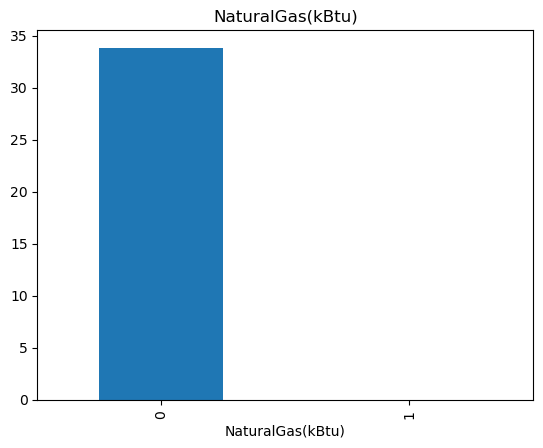

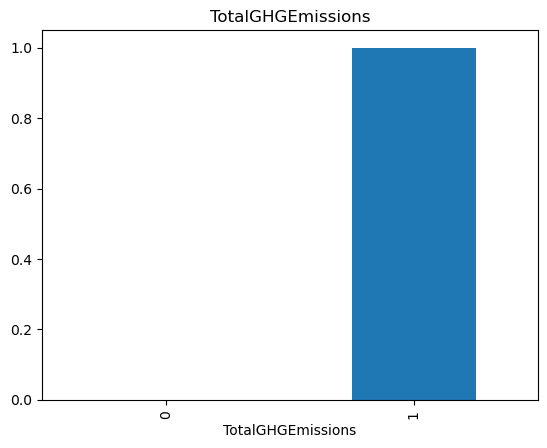

In [48]:
features_with_na=[features for features in df.columns if df[features].isna().sum()>1]

for feature in features_with_na:
    data = df.copy()
    
    # Créons une variable qui indique 1 si l'observation était manquante ou zéro sinon.
    data[feature] = np.where(data[feature].isnull(), 1, 0)
    
    # Calculons la median de TotalGHGEmissions là où l'information est manquante ou présente.
    data.groupby(feature)['TotalGHGEmissions'].median().plot.bar()
    plt.title(feature)
    plt.show()

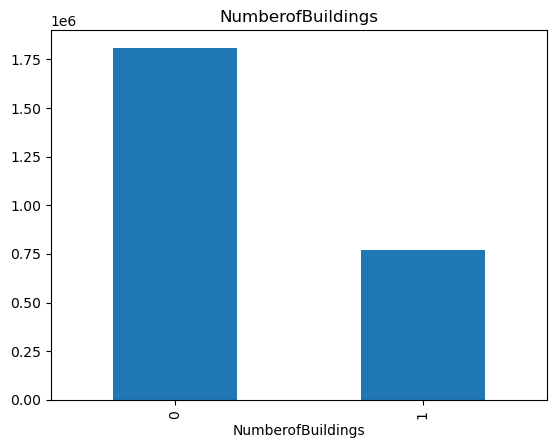

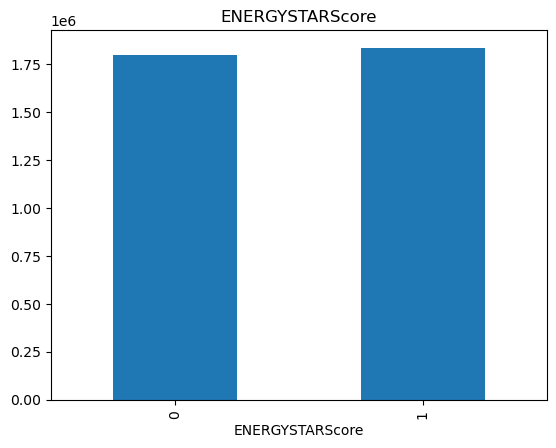

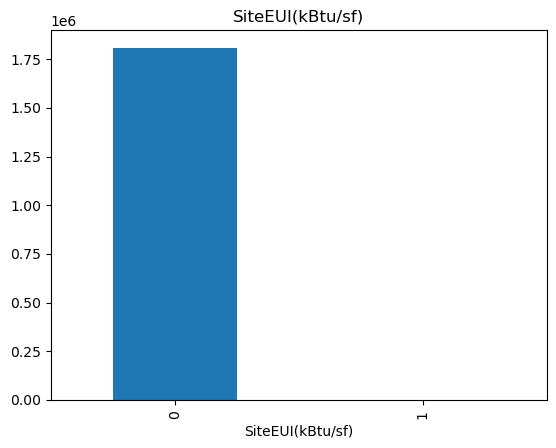

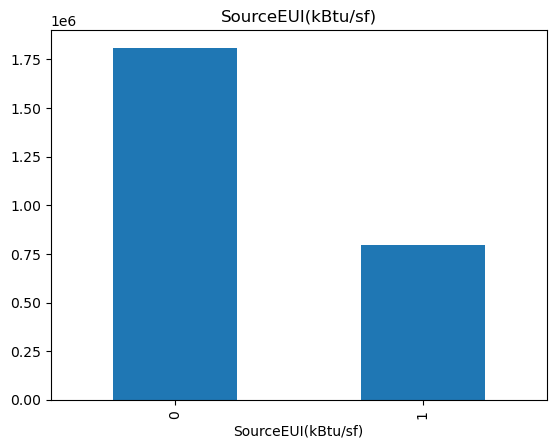

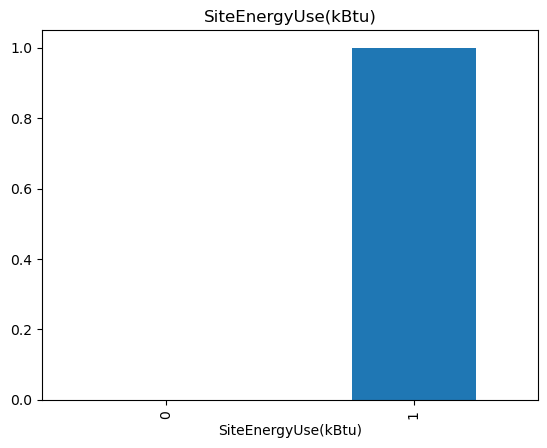

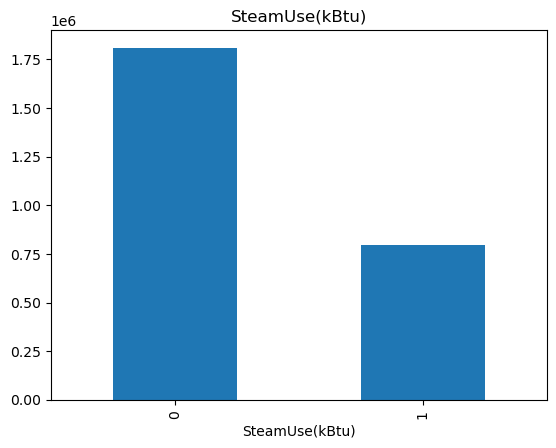

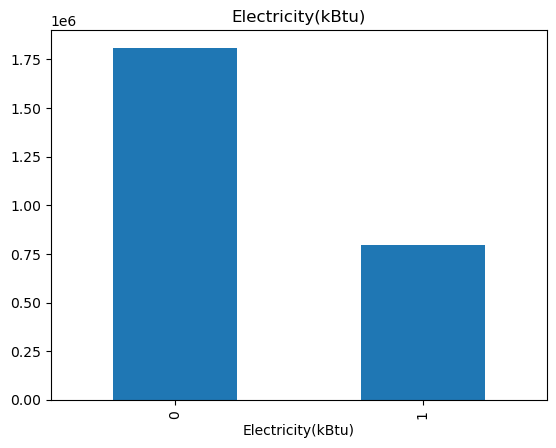

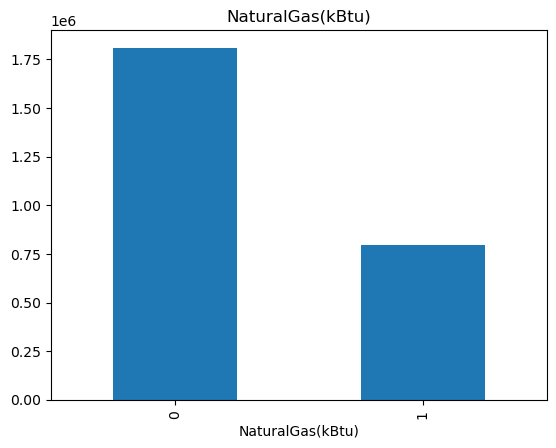

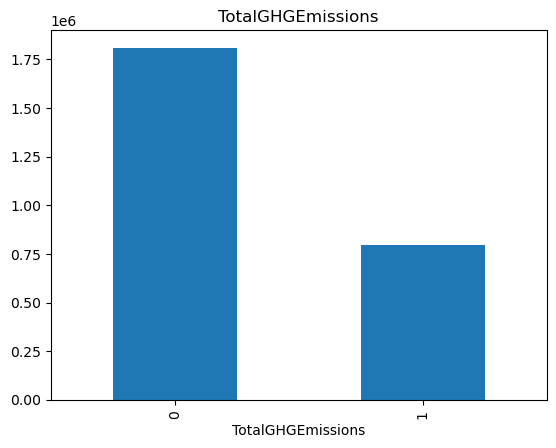

In [49]:
for feature in features_with_na:
    data = df.copy()
    
    # Créons une variable qui indique 1 si l'observation était manquante ou zéro sinon.
    data[feature] = np.where(data[feature].isnull(), 1, 0)
    
    # Calculons la median de TotalGHGEmissions là où l'information est manquante ou présente.
    data.groupby(feature)['SiteEnergyUse(kBtu)'].median().plot.bar()
    plt.title(feature)
    plt.show()

**Les propriétés où toutes les données énergétiques sont absentes sont supprimées.**

In [50]:
df.dropna(subset=[ 'TotalGHGEmissions', 'SiteEnergyUse(kBtu)'], how = 'all', axis = 0, inplace = True)

<AxesSubplot:>

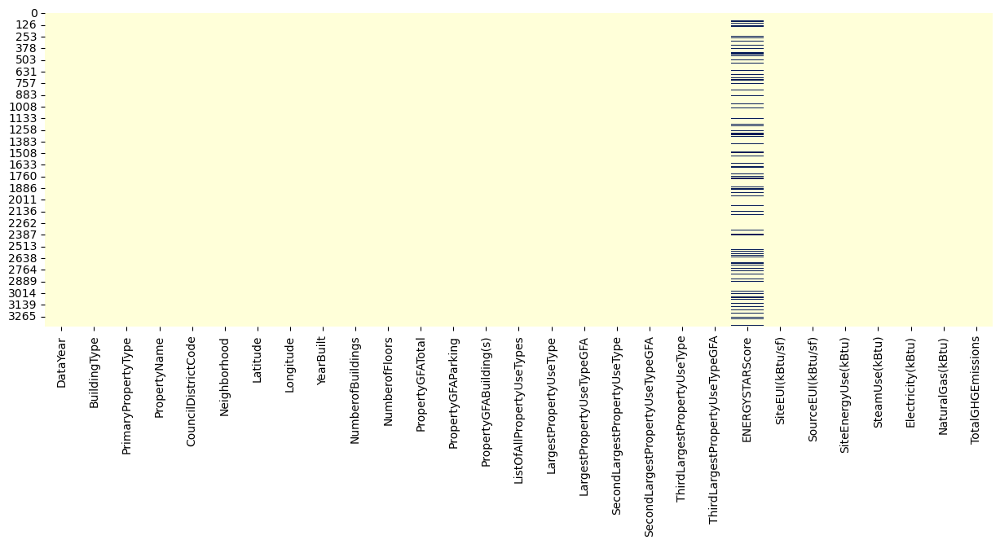

In [51]:
fig = plt.figure(figsize=(15,5))
sns.heatmap(df.isnull(), cbar=False, cmap='YlGnBu')

**Traitement de ENERGYSTARScore**

L'ENERGY STAR Score est une mesure normalisée de la consommation d'énergie d'un bâtiment, basée sur une échelle de 1 à 100, où un score de 50 représente la médiane nationale. Plus le score est élevé, plus le bâtiment est éco-énergétique.

In [52]:
df['ENERGYSTARScore'].isnull().sum()

835

In [53]:
df['ENERGYSTARScore'].value_counts()

100.0    109
98.0      72
96.0      64
93.0      57
89.0      56
        ... 
36.0       8
35.0       8
22.0       8
9.0        5
4.0        5
Name: ENERGYSTARScore, Length: 100, dtype: int64

In [54]:
df_score = df.sort_values(by='SiteEnergyUse(kBtu)')
df_score.head()

,DataYear,BuildingType,PrimaryPropertyType,PropertyName,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions
746,2016,NonResidential,Other,Welcome Home Society - PriceCo,5,NORTHWEST,47.72777,-122.34503,2002,1.0,1,29924,0,29924,Other - Education,Other - Education,29924.0,no use,0.0,no use,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
152,2016,SPS-District K-12,K-12 School,Olympic View Elementary,5,NORTH,47.69823,-122.32126,1989,1.0,2,52792,0,52792,K-12 School,K-12 School,55480.0,no use,0.0,no use,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
304,2016,NonResidential,Other,Washington State Convention Center,7,DOWNTOWN,47.61195,-122.33167,1990,1.0,6,1400000,0,1400000,"Convention Center, Parking",Convention Center,1072000.0,Parking,686750.0,no use,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0
760,2016,Multifamily LR (1-4),Other,APEX BELLTOWN COOP,7,DOWNTOWN,47.61294,-122.34638,1909,1.0,3,30700,0,30700,"Multifamily Housing, Other",Other,19034.0,Multifamily Housing,11666.0,no use,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1549,2016,Multifamily LR (1-4),Low-Rise Multifamily,Forte Condominium,5,NORTH,47.71965,-122.31877,1988,1.0,4,47647,0,47647,Multifamily Housing,Multifamily Housing,47647.0,no use,0.0,no use,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0


In [55]:
df_score[['SiteEnergyUse(kBtu)', 'ENERGYSTARScore']]

,SiteEnergyUse(kBtu),ENERGYSTARScore
746,0.000000e+00,NaN
152,0.000000e+00,NaN
304,0.000000e+00,NaN
760,0.000000e+00,NaN
1549,0.000000e+00,NaN
...,...,...
3274,8.739237e+08,NaN
1894,9.455367e+08,NaN
139,3.217877e+09,NaN
133,4.318917e+09,NaN


In [56]:
# Imputation avec KNNImputer
imputer = KNNImputer(n_neighbors=2)
df_score[['SiteEnergyUse(kBtu)', 'ENERGYSTARScore']] = imputer.fit_transform(df_score[['SiteEnergyUse(kBtu)', 'ENERGYSTARScore']])


In [57]:
df_score[['SiteEnergyUse(kBtu)', 'ENERGYSTARScore']]

,SiteEnergyUse(kBtu),ENERGYSTARScore
746,0.000000e+00,100.0
152,0.000000e+00,100.0
304,0.000000e+00,100.0
760,0.000000e+00,100.0
1549,0.000000e+00,100.0
...,...,...
3274,8.739237e+08,18.5
1894,9.455367e+08,18.5
139,3.217877e+09,18.5
133,4.318917e+09,18.5


In [58]:
df[['SiteEnergyUse(kBtu)', 'ENERGYSTARScore']]

,SiteEnergyUse(kBtu),ENERGYSTARScore
0,7.226362e+06,60.0
1,8.387933e+06,61.0
2,7.258702e+07,43.0
3,6.794584e+06,56.0
4,1.417261e+07,75.0
...,...,...
3371,8.497457e+05,46.0
3372,9.502762e+05,NaN
3373,5.765898e+06,NaN
3374,7.194712e+05,NaN


In [59]:
#Remplir les valeur manquant dans DataFrame principal
df[['SiteEnergyUse(kBtu)', 'ENERGYSTARScore']] = df_score[['SiteEnergyUse(kBtu)', 'ENERGYSTARScore']]

In [60]:
df[['SiteEnergyUse(kBtu)', 'ENERGYSTARScore']]

,SiteEnergyUse(kBtu),ENERGYSTARScore
0,7.226362e+06,60.0
1,8.387933e+06,61.0
2,7.258702e+07,43.0
3,6.794584e+06,56.0
4,1.417261e+07,75.0
...,...,...
3371,8.497457e+05,46.0
3372,9.502762e+05,43.0
3373,5.765898e+06,61.5
3374,7.194712e+05,67.5


In [61]:
#df_score.loc[3372:3375, :][['SiteEnergyUse(kBtu)', 'ENERGYSTARScore']]

<AxesSubplot:>

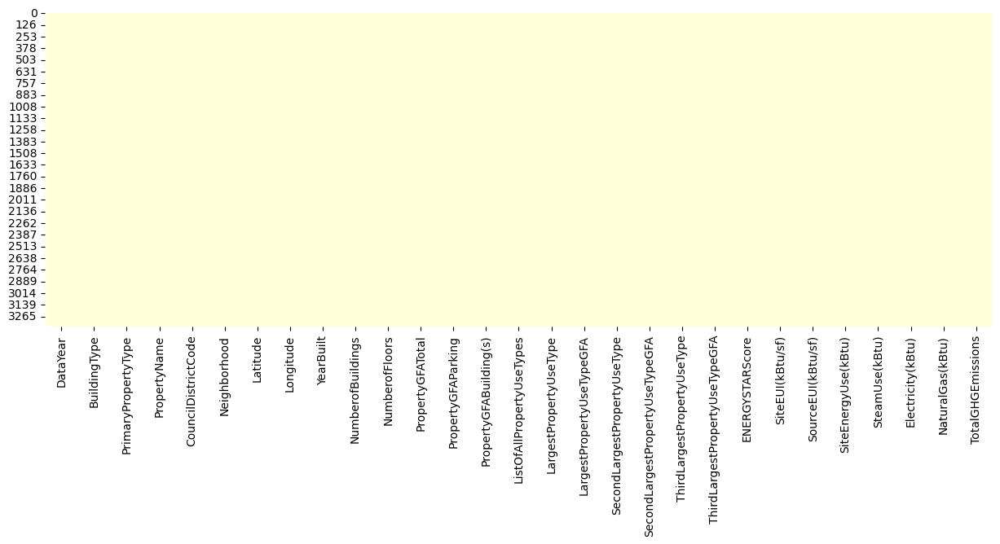

In [62]:
fig = plt.figure(figsize=(15,5))
sns.heatmap(df.isnull(), cbar=False, cmap='YlGnBu')

In [63]:
df.ENERGYSTARScore.value_counts()

100.0    124
98.0      75
96.0      69
89.0      68
93.0      66
        ... 
52.5       1
93.5       1
27.5       1
36.5       1
49.5       1
Name: ENERGYSTARScore, Length: 176, dtype: int64

**Filtre des habitations**

L'énoncé de l'exercice restreint l'analyse aux bâtiments non destinés à l’habitation. Nous allons donc filtrer les habitations. Commençons par analyser les types de batiments ainsi que leur usage principal.

In [64]:
building_types = sorted(df['BuildingType'].unique())
primary_property_types = sorted(df['PrimaryPropertyType'].unique())
display(building_types)
display(len(building_types))
display(primary_property_types)
display(len(primary_property_types))

['Campus',
 'Multifamily HR (10+)',
 'Multifamily LR (1-4)',
 'Multifamily MR (5-9)',
 'NonResidential',
 'Nonresidential COS',
 'Nonresidential WA',
 'SPS-District K-12']

8

['Distribution Center',
 'High-Rise Multifamily',
 'Hospital',
 'Hotel',
 'K-12 School',
 'Laboratory',
 'Large Office',
 'Low-Rise Multifamily',
 'Medical Office',
 'Mid-Rise Multifamily',
 'Mixed Use Property',
 'Office',
 'Other',
 'Refrigerated Warehouse',
 'Residence Hall',
 'Restaurant',
 'Retail Store',
 'Self-Storage Facility',
 'Senior Care Community',
 'Small- and Mid-Sized Office',
 'Supermarket / Grocery Store',
 'University',
 'Warehouse',
 'Worship Facility']

24

In [65]:
from IPython.display import HTML

building_types_and_usages = {}
for building_type in building_types:
    temp = df[df['BuildingType']==building_type]['PrimaryPropertyType'].unique()
    building_types_and_usages[building_type]=temp.tolist()

display(HTML('<br />'))

i=0
for group,subgroups in building_types_and_usages.items():
    text = "<strong>" + group + ": </strong>"
    for subgroup in subgroups:
        text += subgroup + ", "
        i = i +1
    display(HTML(text+'<br />'))
    
display(HTML('<br />'))

print('Il y a {} groupe/sous-catégories et {} catégories uniques'.format(i,len(primary_property_types))) 

Il y a 55 groupe/sous-catégories et 24 catégories uniques


Les types d'usages des bâtiments ne sont donc pas sous-catégories uniqes des types de bâtiments. De plus on retrouve un usage de type "Low-Rise Multifamily" dans le type "NonResidential", analysons en détail ce type d'anomalie.

In [66]:
data_anomalies = df[~df['BuildingType'].str.contains("Multifamily") & df['PrimaryPropertyType'].str.contains("Multifamily")]
display(data_anomalies)

,DataYear,BuildingType,PrimaryPropertyType,PropertyName,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions
644,2016,NonResidential,Low-Rise Multifamily,Pacific Pointe,4,LAKE UNION,47.64859,-122.33311,2000,1.0,3,93079,36093,56986,Multifamily Housing,Multifamily Housing,91064.0,no use,0.0,no use,0.0,32.0,21.900000,63.099998,1.997182e+06,0.0,1744199.0,252982.0,25.60
1300,2016,Campus,Low-Rise Multifamily,Sanitary Market,7,DOWNTOWN,47.60918,-122.34079,1942,1.0,4,45500,0,45500,"Bar/Nightclub, Food Sales, Multifamily Housing...",Multifamily Housing,22669.0,Retail Store,10455.0,Restaurant,3668.0,69.5,85.199997,267.500000,3.778355e+06,0.0,3778355.0,0.0,26.34
2450,2016,NonResidential,Low-Rise Multifamily,(ID25674) COMET TAVERN,3,EAST,47.61427,-122.31977,1910,1.0,3,32100,0,32100,"Bar/Nightclub, Multifamily Housing",Multifamily Housing,21400.0,Bar/Nightclub,10700.0,no use,0.0,100.0,3.400000,4.300000,1.082004e+05,0.0,11370.0,96830.0,5.22


Vu le nombre de lignes concernées il s'agit bien d'anomalies dont on ne tiendra pas compte. Pour supprimer les lignes concernant les usages résidentielles nous supprimerons donc les lignes contenant le terme "Multifamily" dans le type de bâtiment ou dans son type d'usage.

In [67]:
df = df[~df['BuildingType'].str.contains("Multifamily") & ~df['PrimaryPropertyType'].str.contains("Multifamily")]
display(df.shape)

(1653, 29)

Pour l'analyse liée à l'énergie star score et la consommation énergétique, **l'âge des batiments** me parait plus pertinente que l'année de construction ajoutons une colonne avec cette variable et supprimons l'anciennne.

In [68]:
df['BuildingAge'] = df['DataYear'] - df['YearBuilt']
print(df[['BuildingAge','DataYear','YearBuilt']])

      BuildingAge  DataYear  YearBuilt
0              89      2016       1927
1              20      2016       1996
2              47      2016       1969
3              90      2016       1926
4              36      2016       1980
...           ...       ...        ...
3371           26      2016       1990
3372           12      2016       2004
3373           42      2016       1974
3374           27      2016       1989
3375           78      2016       1938

[1653 rows x 3 columns]


In [69]:
df.drop(['YearBuilt', 'DataYear'], axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1653 entries, 0 to 3375
Data columns (total 28 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   BuildingType                     1653 non-null   object 
 1   PrimaryPropertyType              1653 non-null   object 
 2   PropertyName                     1653 non-null   object 
 3   CouncilDistrictCode              1653 non-null   int64  
 4   Neighborhood                     1653 non-null   object 
 5   Latitude                         1653 non-null   float64
 6   Longitude                        1653 non-null   float64
 7   NumberofBuildings                1653 non-null   float64
 8   NumberofFloors                   1653 non-null   int64  
 9   PropertyGFATotal                 1653 non-null   int64  
 10  PropertyGFAParking               1653 non-null   int64  
 11  PropertyGFABuilding(s)           1653 non-null   int64  
 12  ListOfAllPropertyUse

Le TaxParcelIdentificationNumber devrait être de type numérique, pas une chaîne de caractère

# 3. Analyses

#### Univariées, Bivariée

In [70]:
# list of numerical variables
numerical_features = [feature for feature in df.columns if df[feature].dtypes != 'O']

print('Nombre de variables numériques: ', len(numerical_features))

# visualise the numerical variables
df[numerical_features].head()

Nombre de variables numériques:  20


,CouncilDistrictCode,Latitude,Longitude,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,BuildingAge
0,7,47.61220,-122.33799,1.0,12,88434,0,88434,88434.0,0.0,0.0,60.0,81.699997,182.500000,7226362.5,2003882.00,3946027.0,1276453.0,249.98,89
1,7,47.61317,-122.33393,1.0,11,103566,15064,88502,83880.0,15064.0,4622.0,61.0,94.800003,176.100006,8387933.0,0.00,3242851.0,5145082.0,295.86,20
2,7,47.61393,-122.33810,1.0,41,956110,196718,759392,756493.0,0.0,0.0,43.0,96.000000,241.899994,72587024.0,21566554.00,49526664.0,1493800.0,2089.28,47
3,7,47.61412,-122.33664,1.0,10,61320,0,61320,61320.0,0.0,0.0,56.0,110.800003,216.199997,6794584.0,2214446.25,2768924.0,1811213.0,286.43,90
4,7,47.61375,-122.34047,1.0,18,175580,62000,113580,123445.0,68009.0,0.0,75.0,114.800003,211.399994,14172606.0,0.00,5368607.0,8803998.0,505.01,36


In [71]:
# list of categorical variables
info_supp_categ = ['ListOfAllPropertyUseTypes', 'PropertyName','Address', 'City', 'State', 'ComplianceStatus' ]

categorical_features = [feature for feature in df.columns if df[feature].dtypes == 'O' and feature not in info_supp_categ]

print('Nombre de variables catégorielles: ', len(categorical_features))

# visualise the categ variables
df[categorical_features].head()

Nombre de variables catégorielles:  6


,BuildingType,PrimaryPropertyType,Neighborhood,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType
0,NonResidential,Hotel,DOWNTOWN,Hotel,no use,no use
1,NonResidential,Hotel,DOWNTOWN,Hotel,Parking,Restaurant
2,NonResidential,Hotel,DOWNTOWN,Hotel,no use,no use
3,NonResidential,Hotel,DOWNTOWN,Hotel,no use,no use
4,NonResidential,Hotel,DOWNTOWN,Hotel,Parking,Swimming Pool


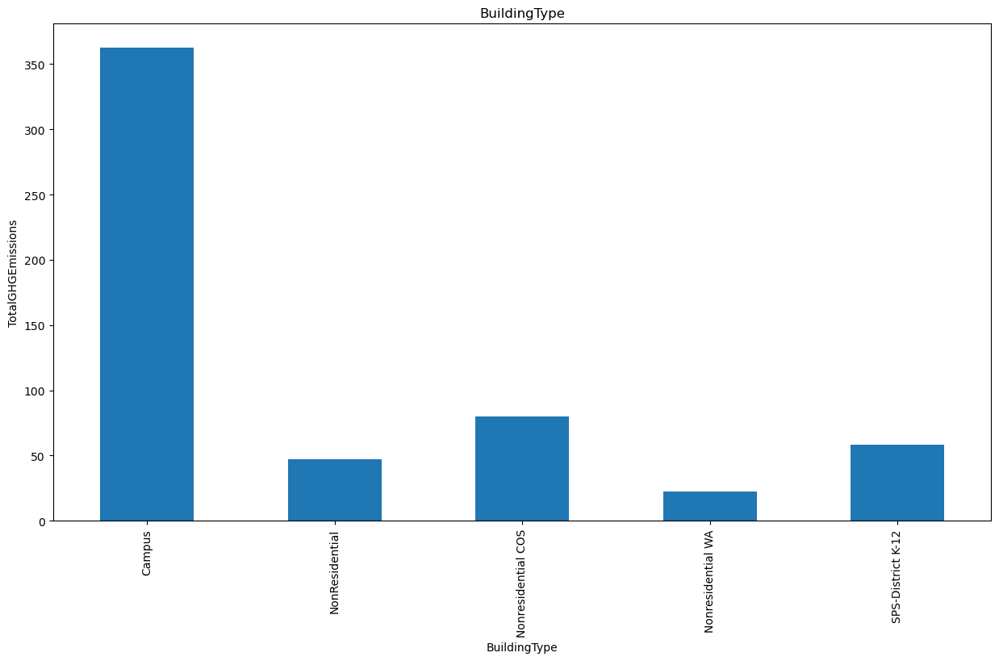

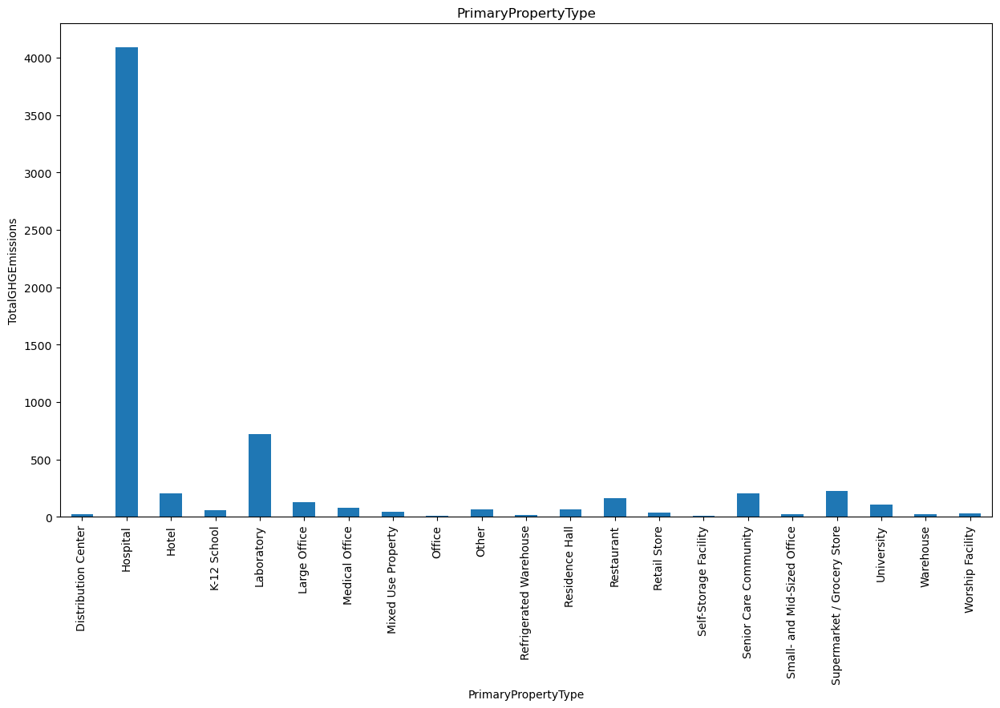

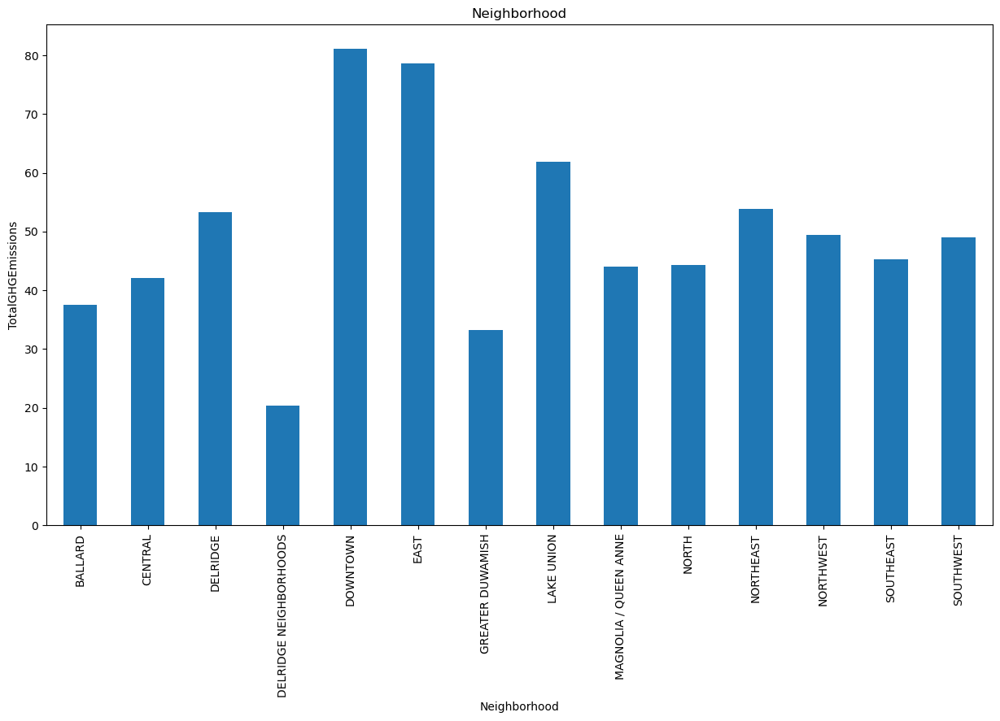

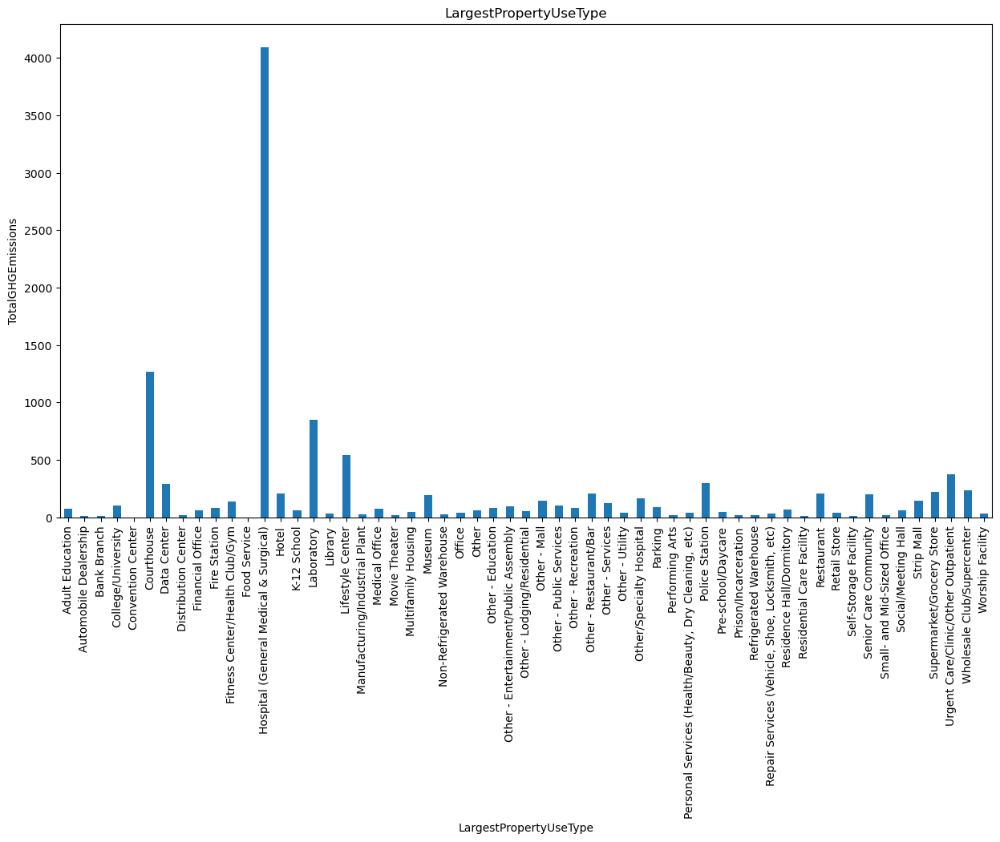

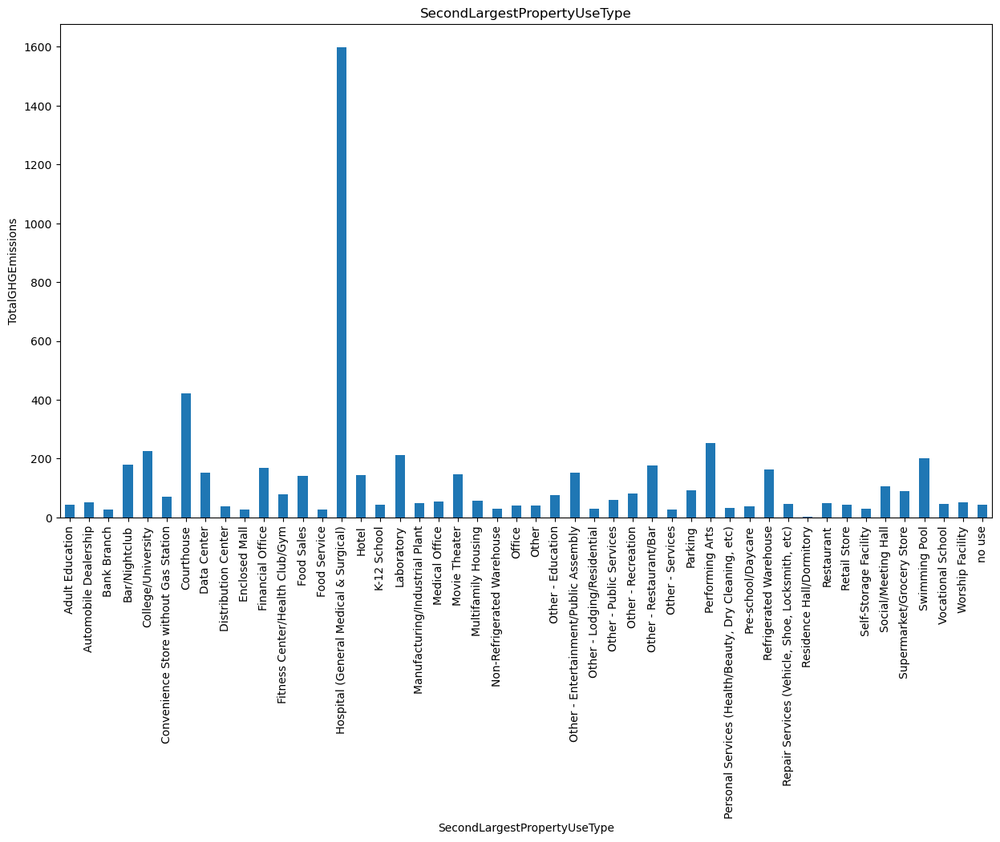

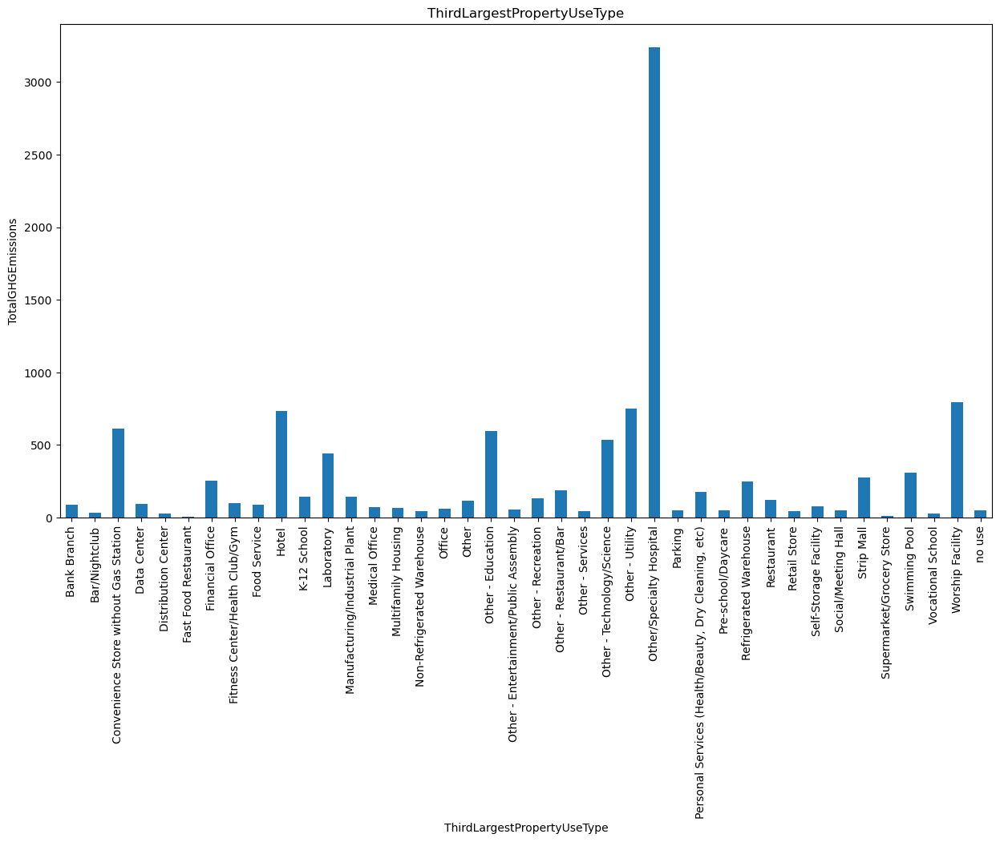

In [72]:
for feature in categorical_features:
    data=df.copy()
    plt.figure(figsize=(15,8))
    data.groupby(feature)['TotalGHGEmissions'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('TotalGHGEmissions')
    plt.title(feature)
    plt.show()

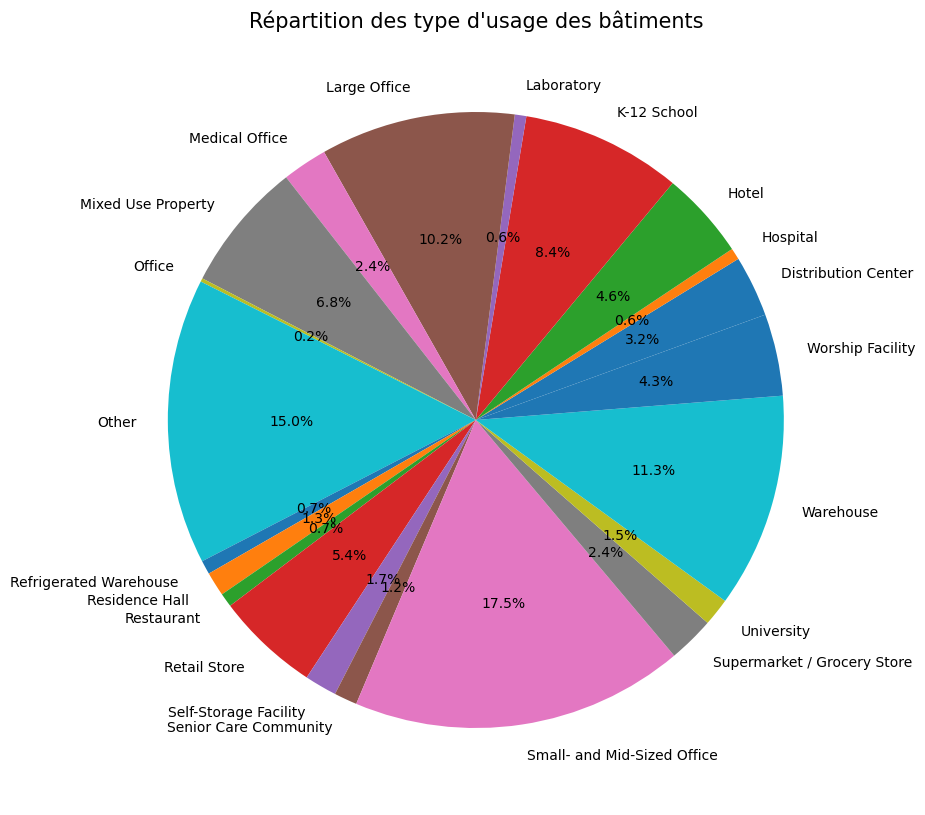

In [73]:
primaryType = df.groupby(by='PrimaryPropertyType')['PropertyName'].nunique()
plt.figure(figsize=(30,10))
plt.pie(primaryType.values, labels = primaryType.index,
        autopct='%1.1f%%', shadow=False, startangle=20)
plt.title("Répartition des type d'usage des bâtiments", fontsize=15)
plt.show()

**Variables numériques discrètes**

In [74]:
discrete_feature=[feature for feature in numerical_features if len(df[feature].unique())<30 and feature not in ['DefaultData'] ] 
print("Discrete Variables Count: {}".format(len(discrete_feature)))
discrete_feature


Discrete Variables Count: 2


['CouncilDistrictCode', 'NumberofBuildings']

In [75]:
df[discrete_feature].head()


,CouncilDistrictCode,NumberofBuildings
0,7,1.0
1,7,1.0
2,7,1.0
3,7,1.0
4,7,1.0


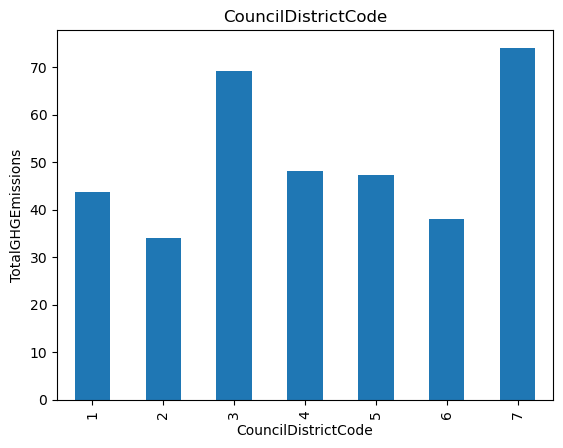

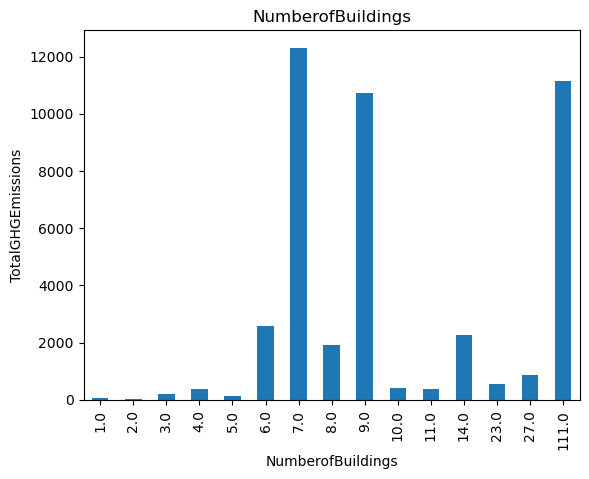

In [76]:

for feature in discrete_feature:
    data=df.copy()
    data.groupby(feature)['TotalGHGEmissions'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('TotalGHGEmissions')
    plt.title(feature)
    plt.show()

**Variables numériques continues**

In [77]:
info_supp_num = ['OSEBuildingID','SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseTypeGFA']

continuous_feature=[feature for feature in numerical_features if feature not in discrete_feature + info_supp_num]
print("Continuous feature Count {}".format(len(continuous_feature)))
continuous_feature

Continuous feature Count 16


['Latitude',
 'Longitude',
 'NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding(s)',
 'LargestPropertyUseTypeGFA',
 'ENERGYSTARScore',
 'SiteEUI(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SteamUse(kBtu)',
 'Electricity(kBtu)',
 'NaturalGas(kBtu)',
 'TotalGHGEmissions',
 'BuildingAge']

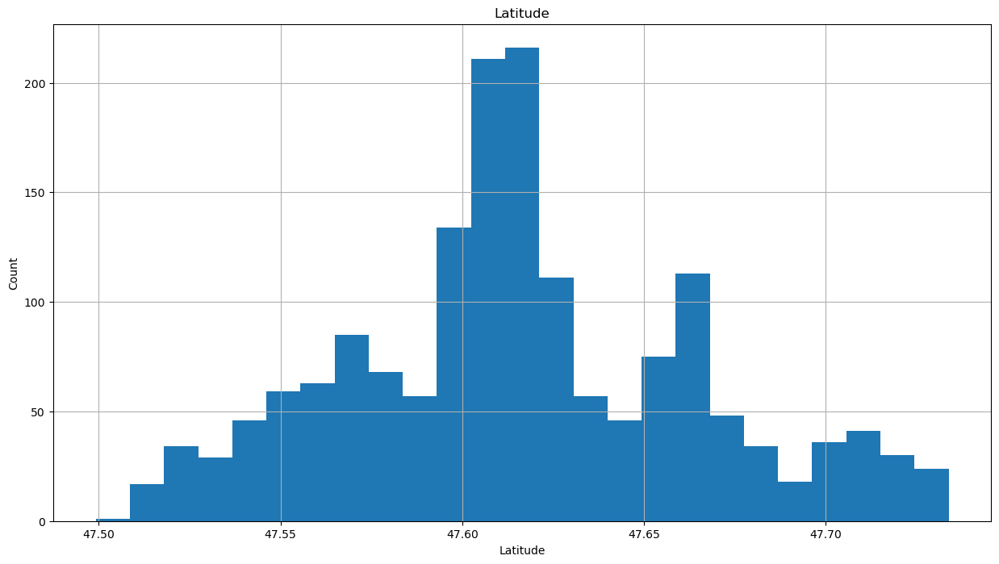

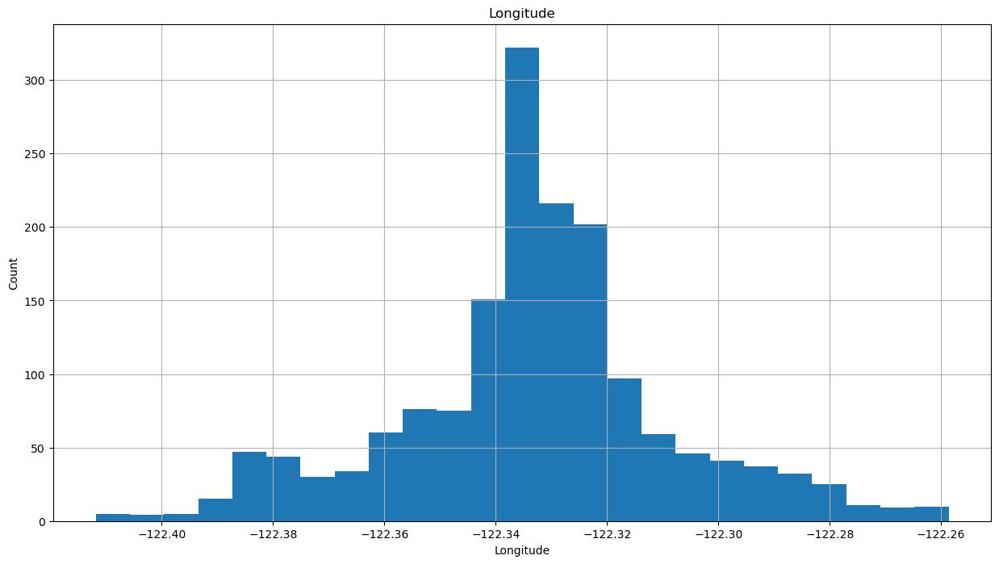

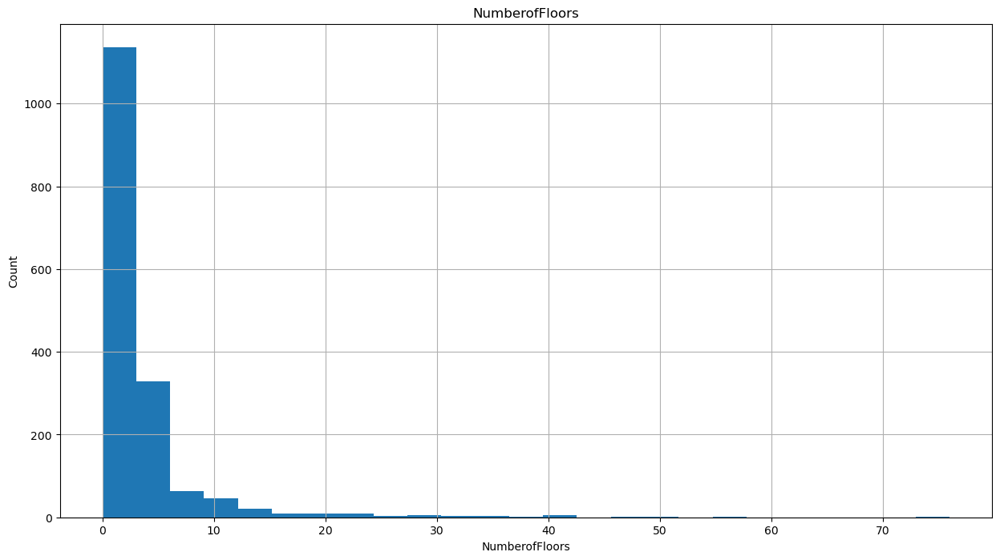

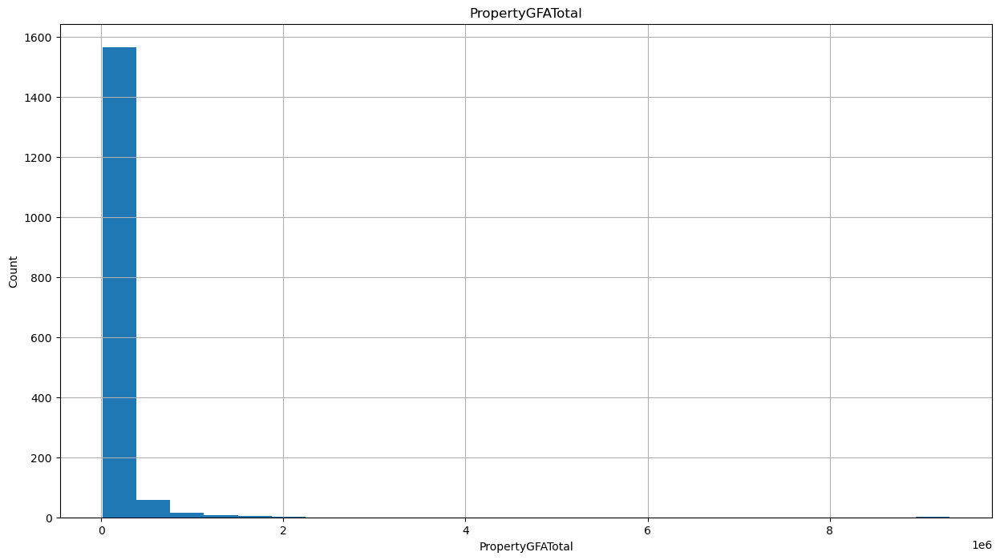

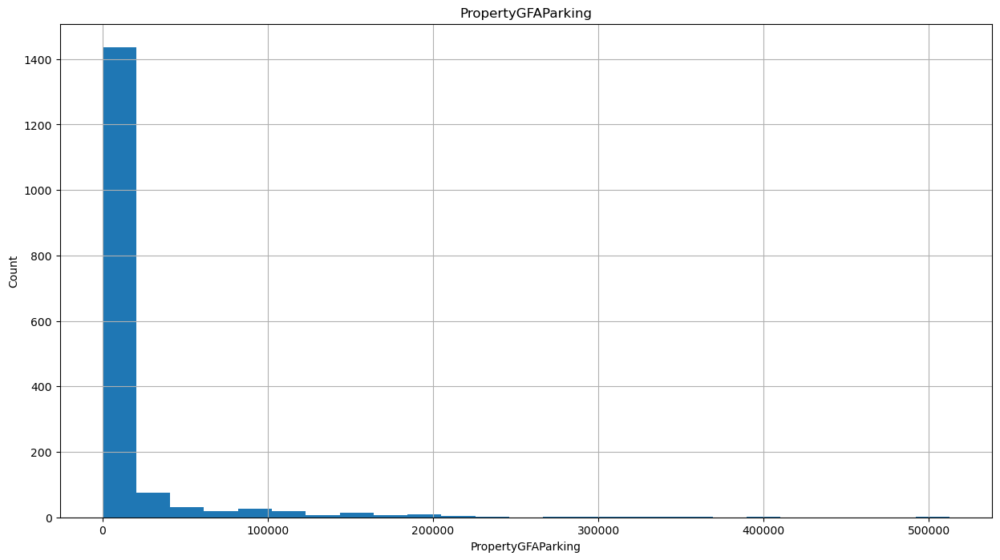

...

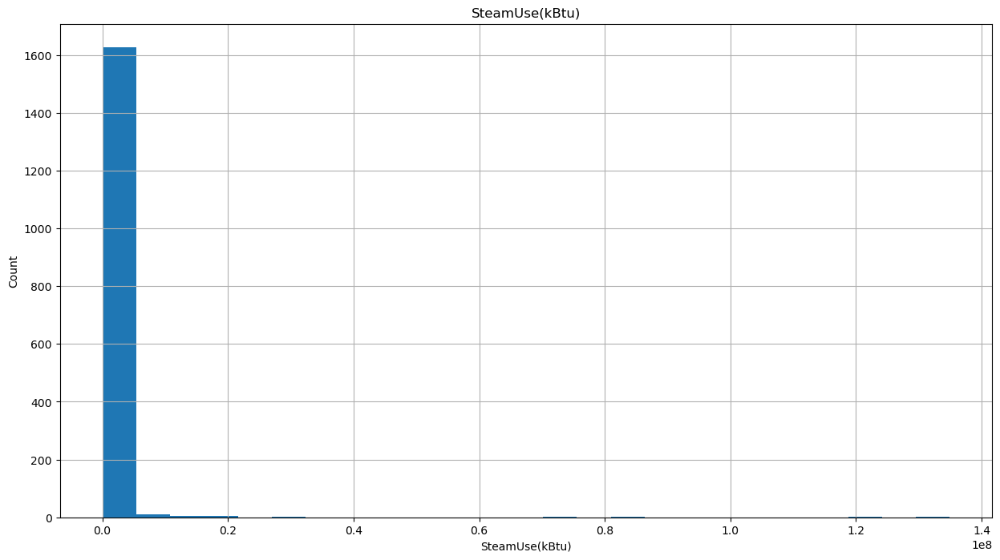

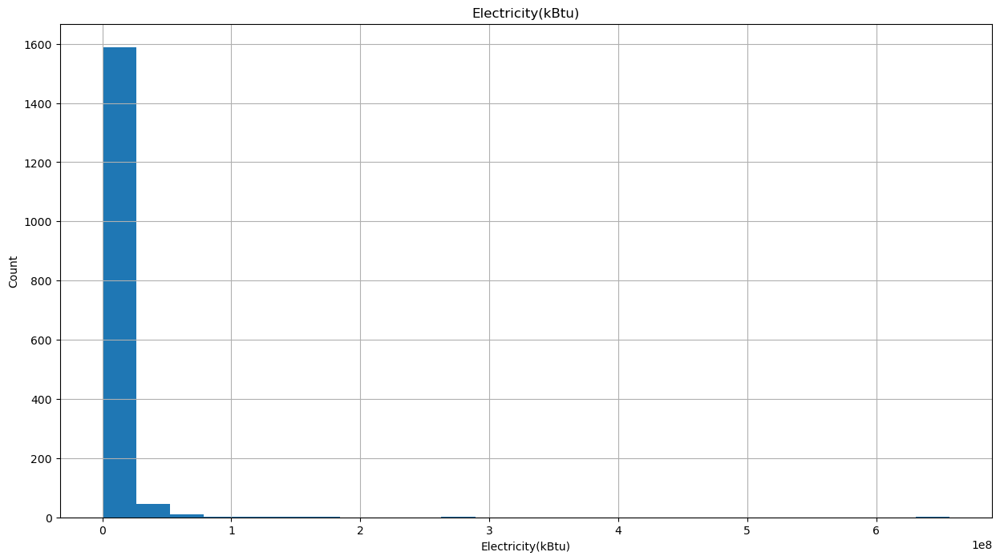

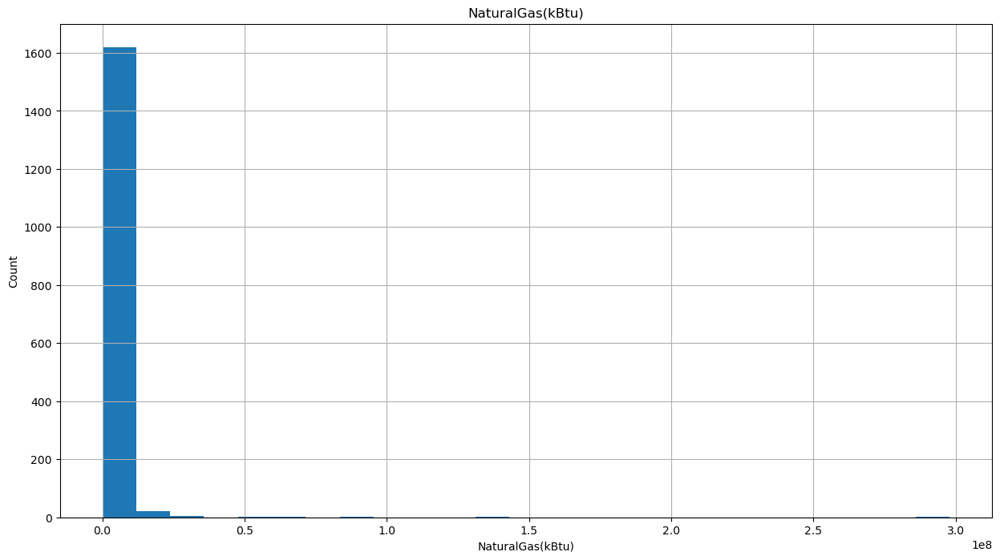

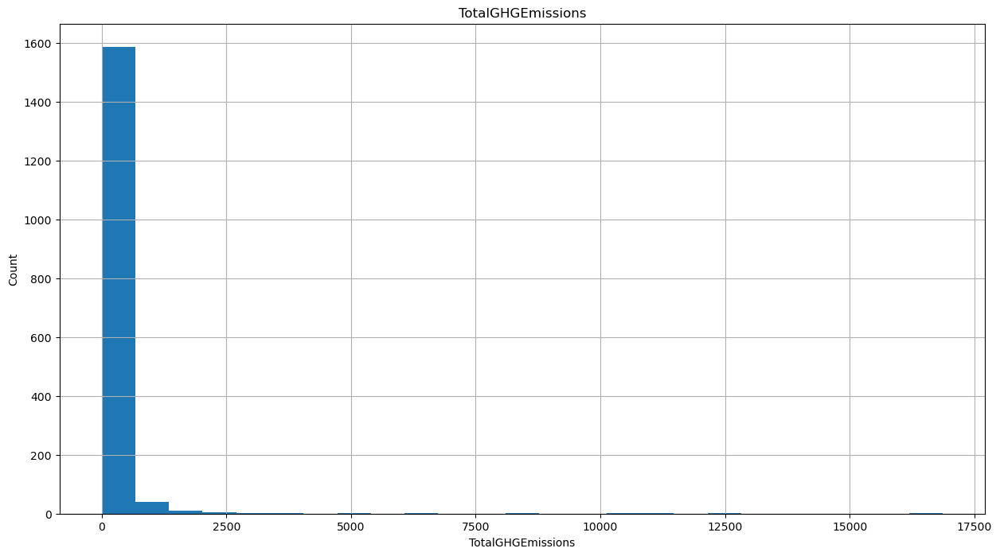

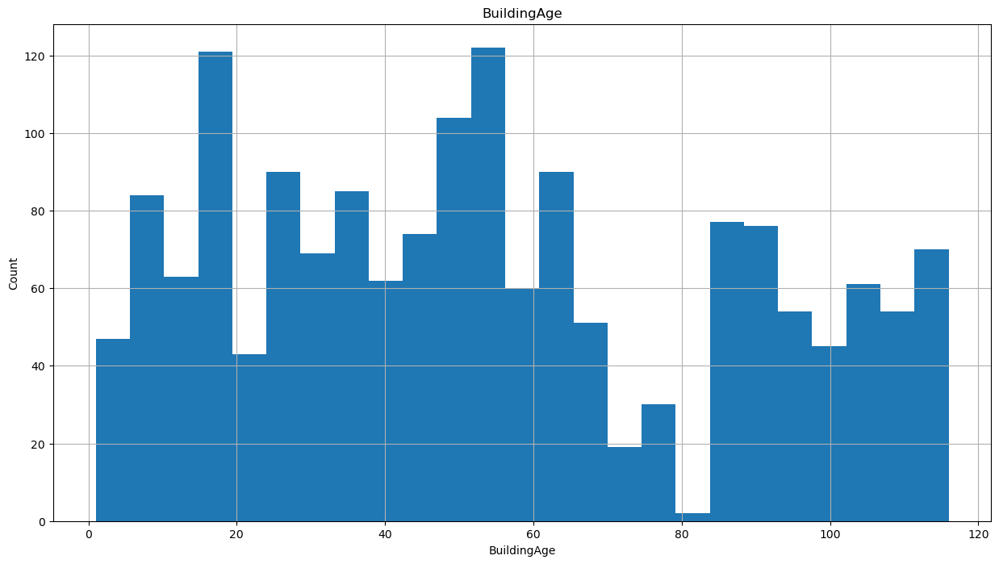

In [78]:
# Analysons les valeurs continues en créant des histogrammes pour comprendre la distribution.

for feature in continuous_feature:
    data_cont=df.copy()
    plt.figure(figsize=(15,8))
    data_cont[feature].hist(bins=25)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()

**Log**

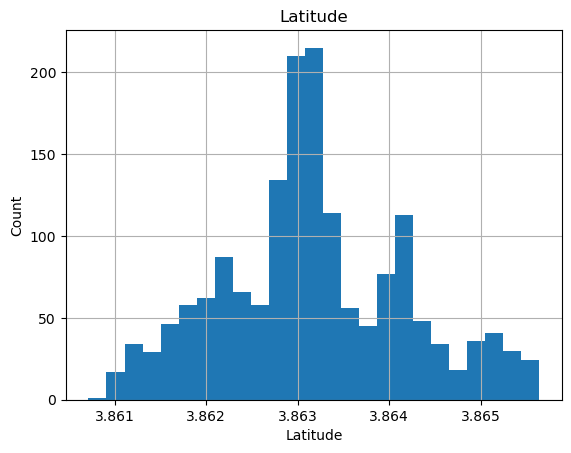

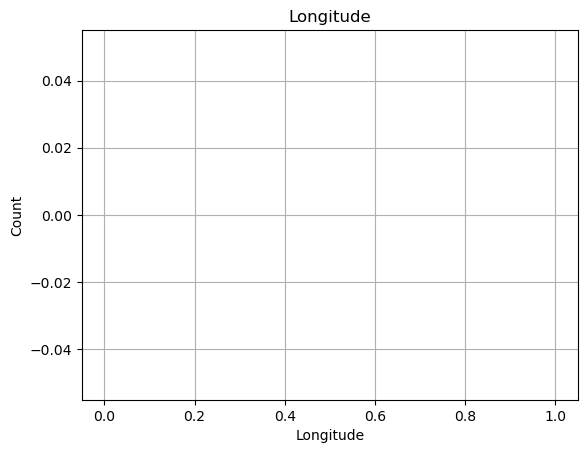

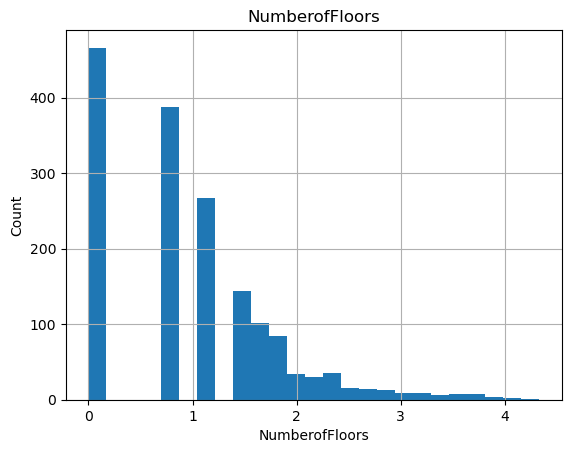

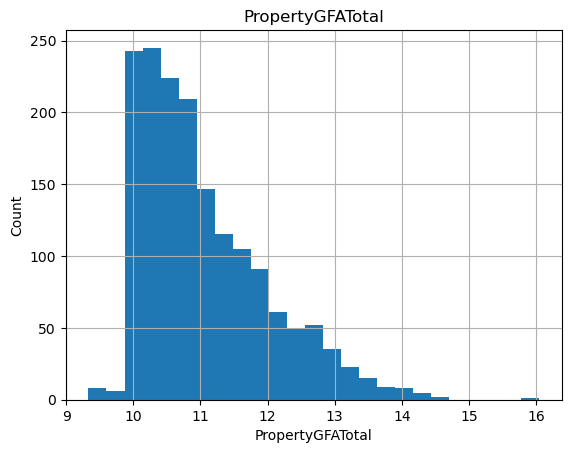

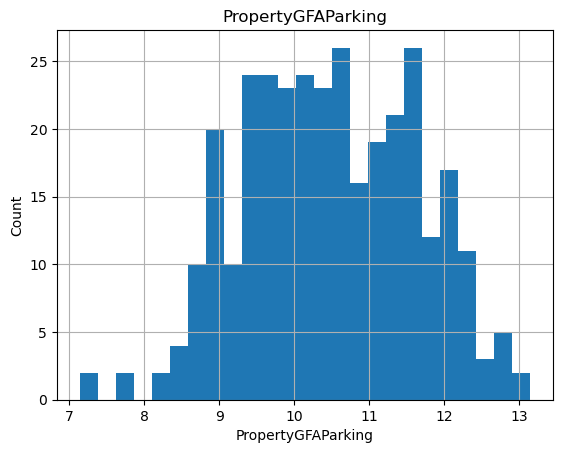

...

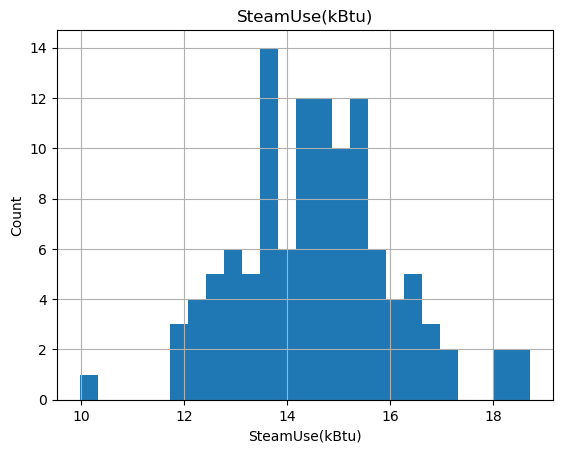

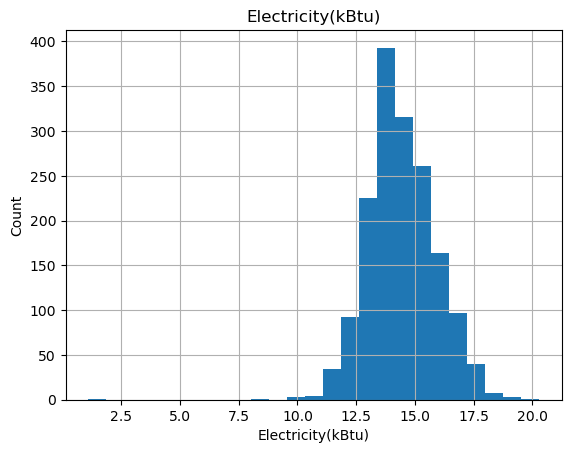

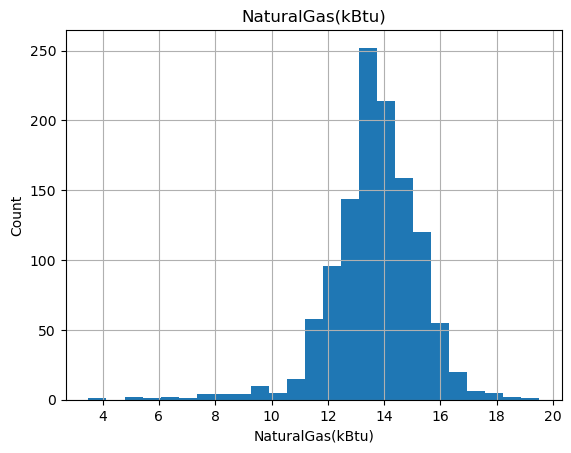

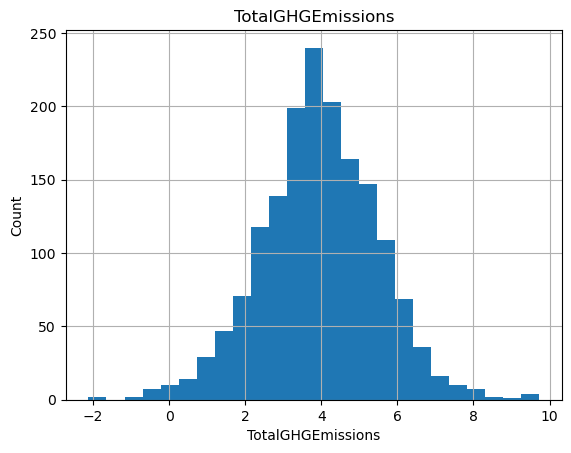

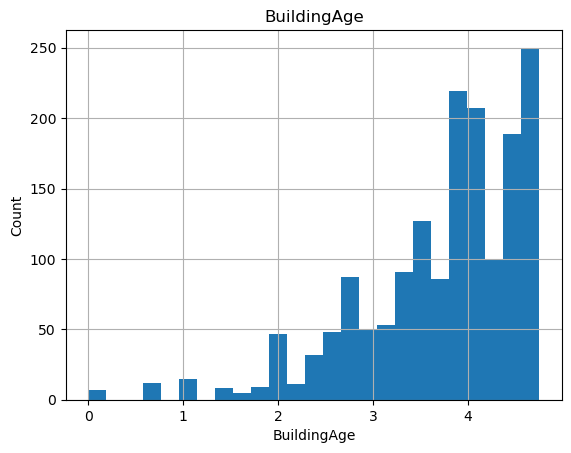

In [79]:
# En log
data_log = df.copy()
for feature in continuous_feature:
    feature_data = data_log[feature]
    feature_data = feature_data.where(feature_data > 0)  # Filtre les valeurs négatives ou nulles
    feature_data = np.log(feature_data)
    feature_data.hist(bins=25)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()


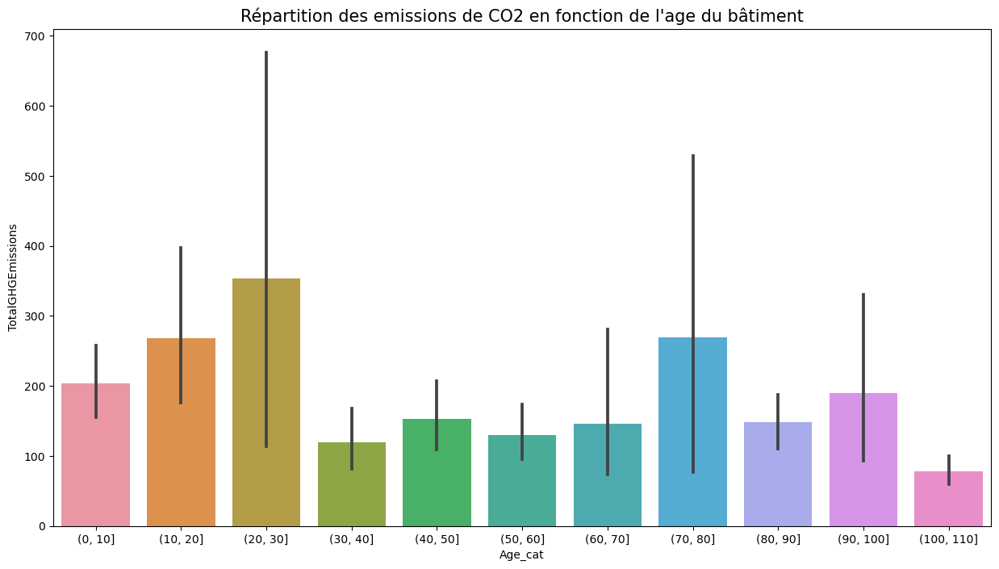

In [80]:
dfage = df.copy()
dfage['Age_cat'] = pd.cut(df['BuildingAge'], 
    bins=[x for x in range(0,120, 10)], 
    right=True)

plt.figure(figsize=(15,8))
sns.barplot(x = "Age_cat", y= "TotalGHGEmissions", data=dfage)
plt.title("Répartition des emissions de CO2 en fonction de l'age du bâtiment", fontsize=15)
plt.show()

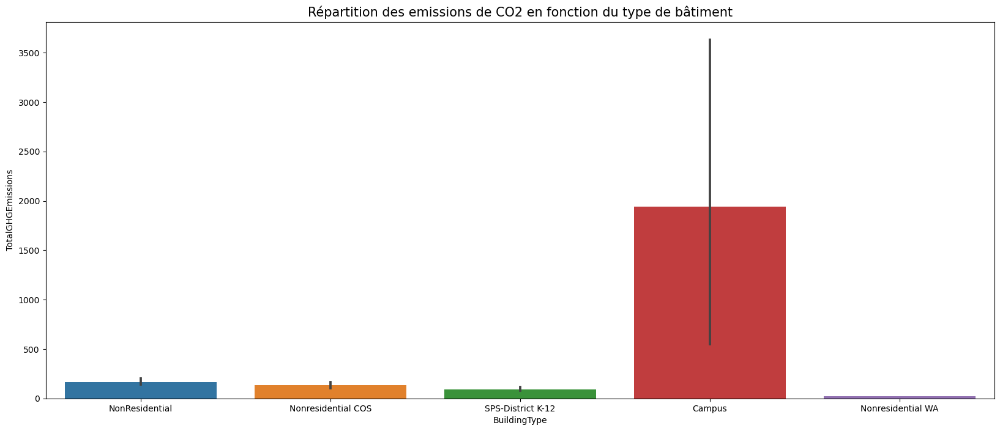

In [81]:
plt.figure(figsize=(20,8))
sns.barplot("BuildingType", y= "TotalGHGEmissions", data=df)
plt.title("Répartition des emissions de CO2 en fonction du type de bâtiment", fontsize=15)
plt.show()

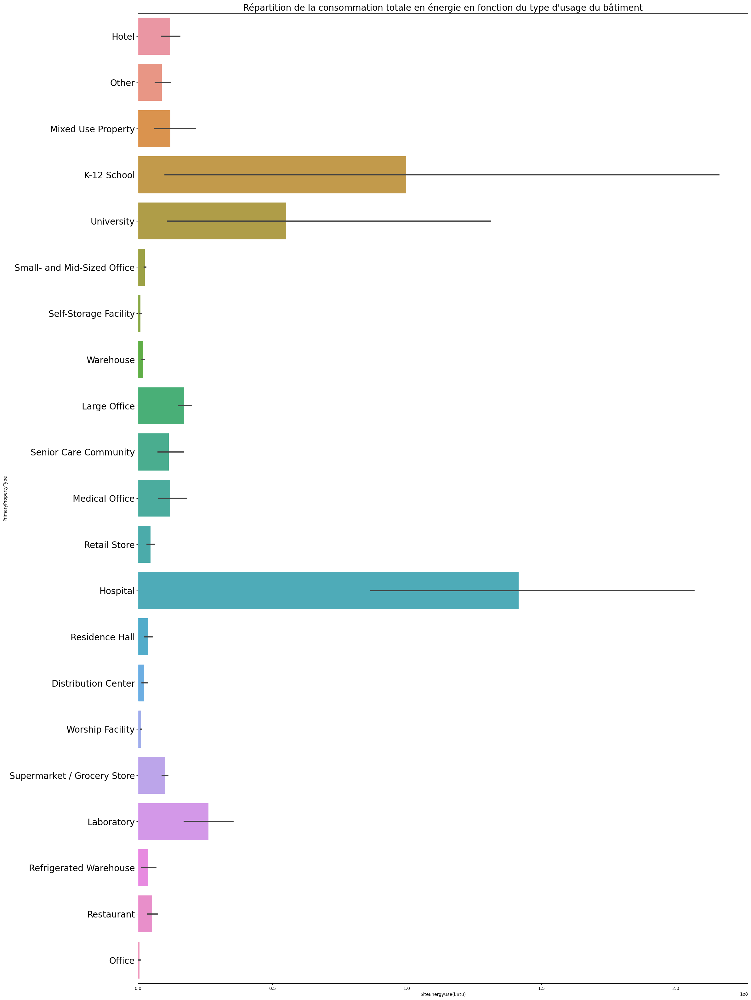

In [82]:
plt.figure(figsize=(25,40))
sns.barplot(y = "PrimaryPropertyType", x= "SiteEnergyUse(kBtu)", data=df)
plt.tick_params(axis='y', labelsize=20)
plt.title("Répartition de la consommation totale en énergie en fonction du type d'usage du bâtiment", fontsize=20)
plt.show()

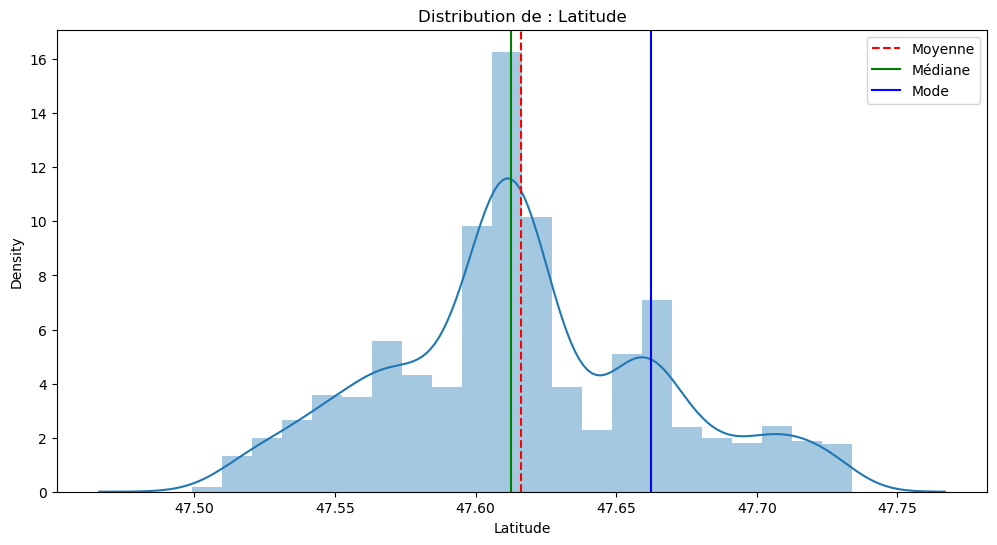

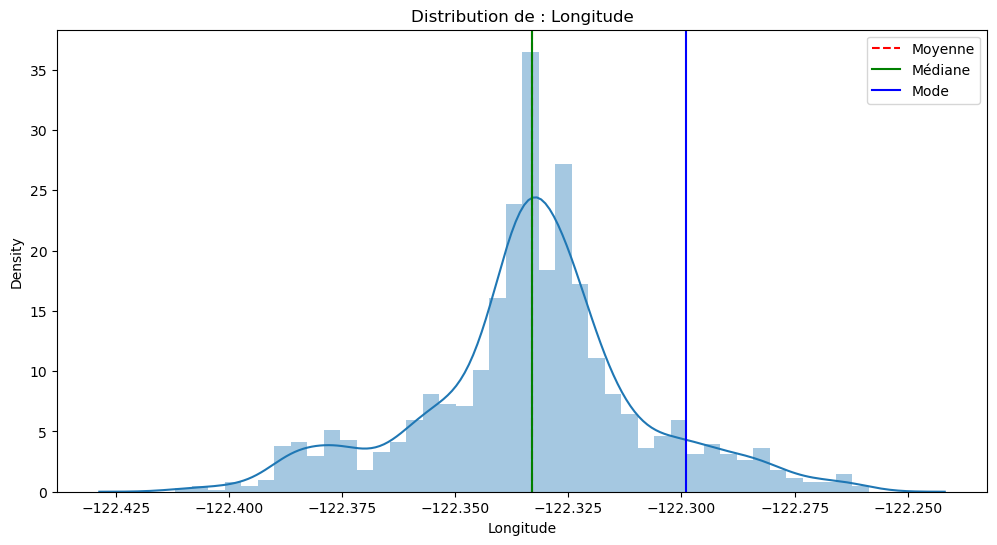

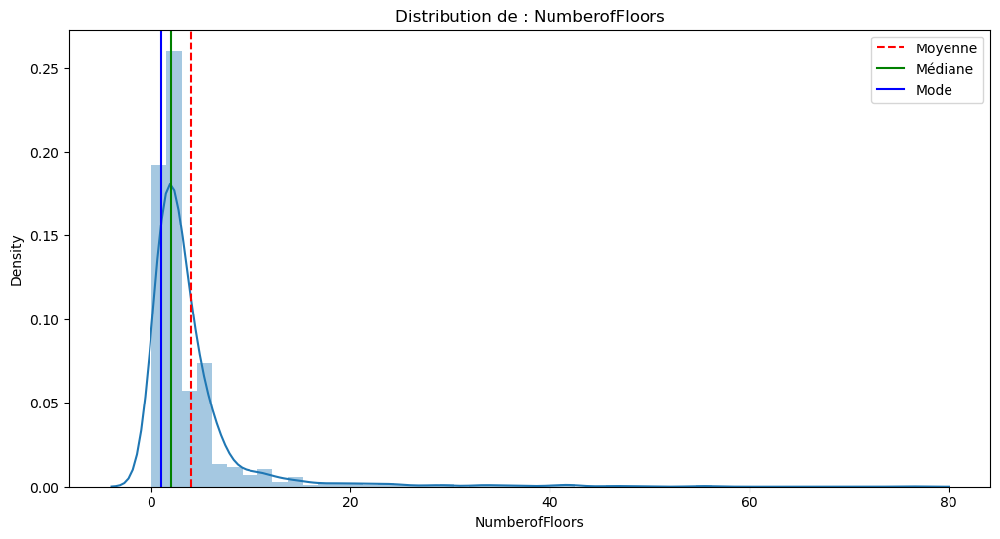

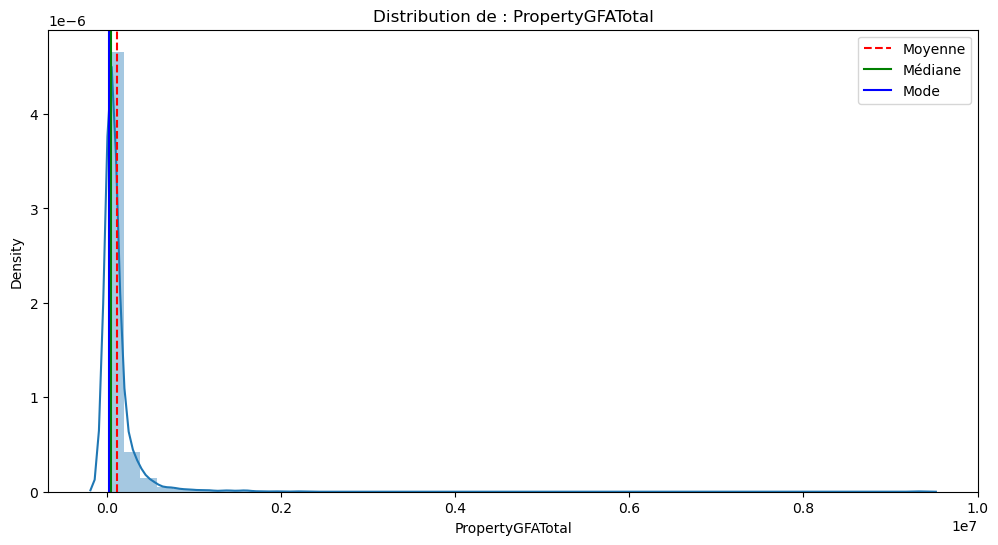

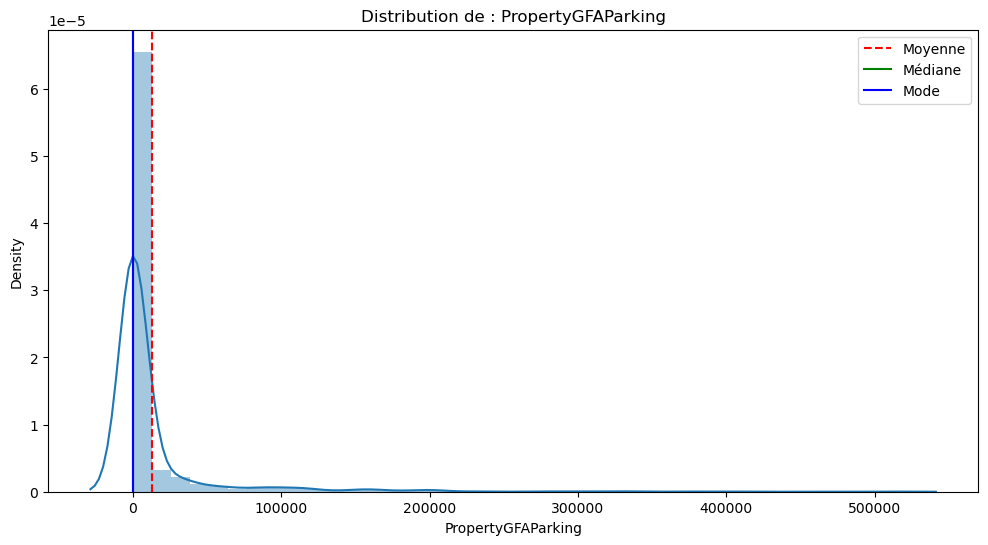

...

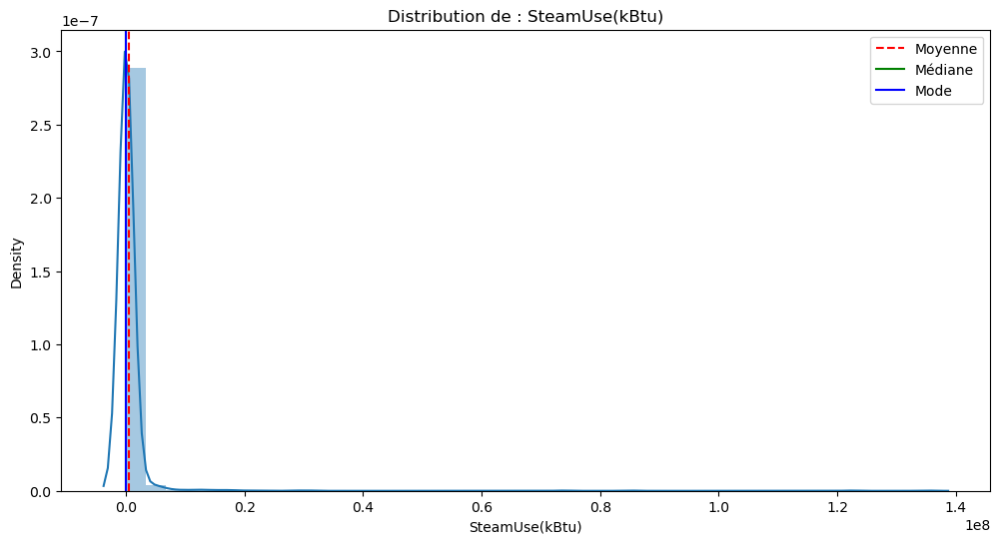

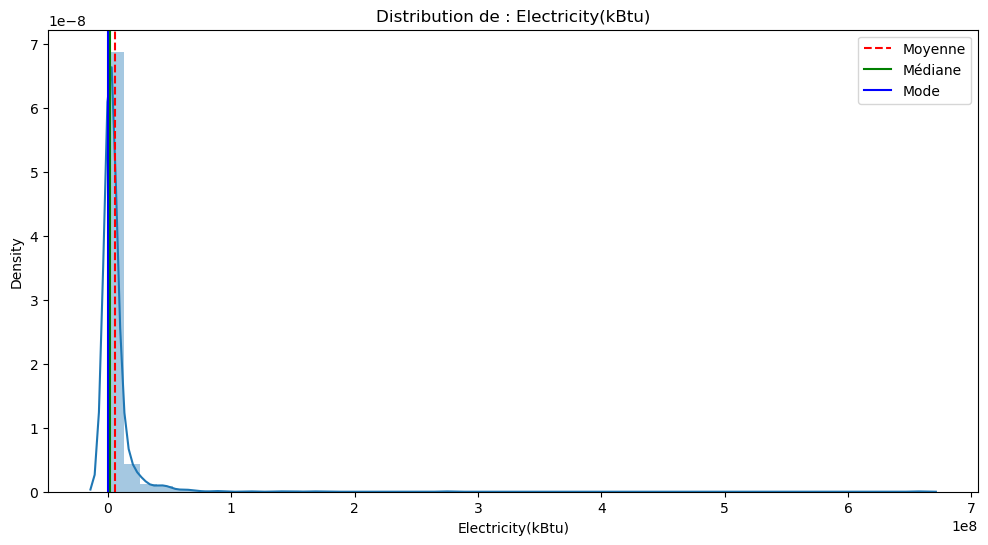

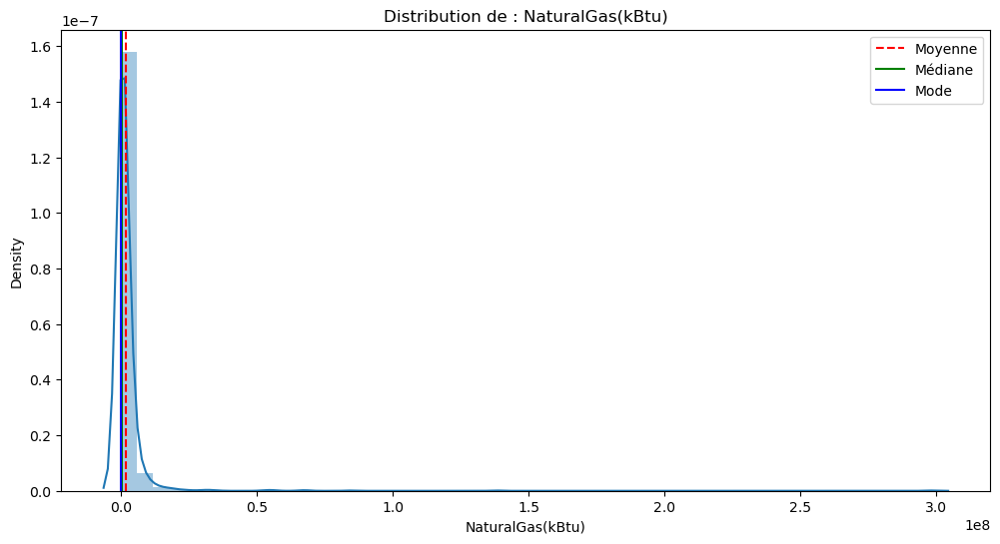

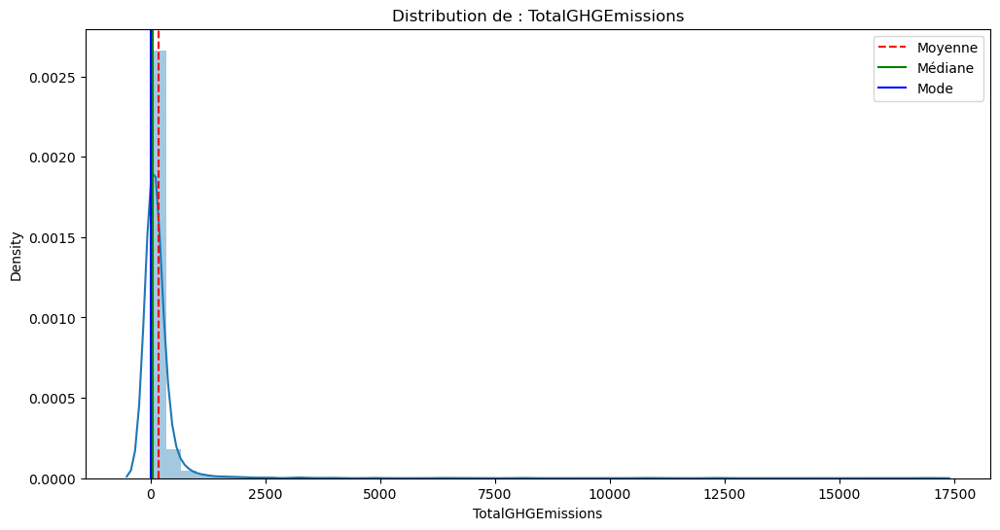

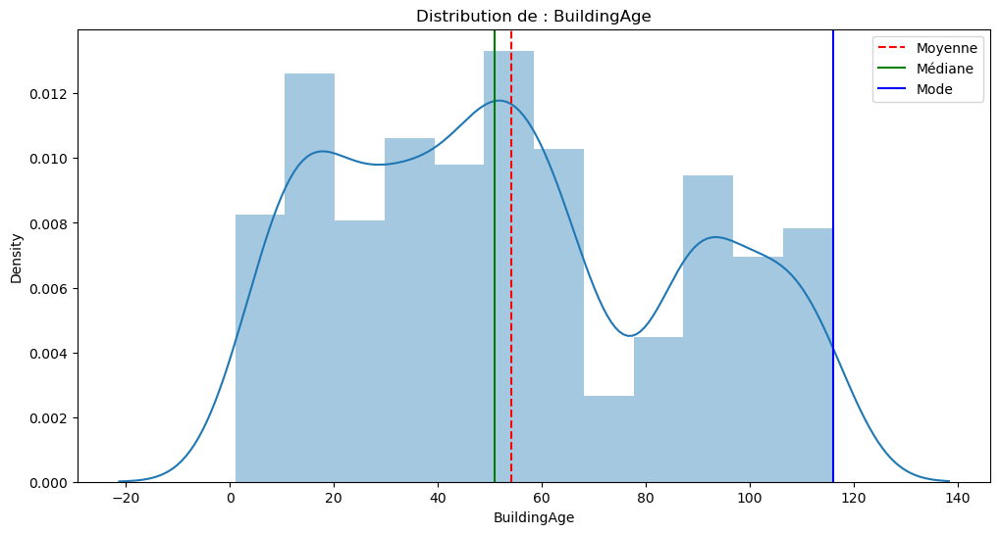

In [83]:
for col in continuous_feature:
    plt.figure(figsize = (12,6))
    sns.distplot(data[col])
    plt.axvline(data[col].mean(), color='r', linestyle='--', label="Moyenne")
    plt.axvline(data[col].median(), color='g', linestyle='-', label="Médiane")
    plt.axvline(data[col].mode().values[0], color='b', linestyle='-', label="Mode")
    chaine = 'Distribution de : ' + col
    plt.title(chaine)
    plt.legend()
    plt.show()

On peut constater plusieurs faits;

- les types de batiments sont inégalement représentés, on a surtout des batiments de types non résidentiels qui sont essentiellement des bureaux
- certains quartiers sont très peu représentés (probablement les quartiers résidentiels avec les données qu'on a supprimé de l'analyse) mais cette inégalité est peu visible au niveau des districts
- on a peu de construction bâtie entre 1930 et 1947 ce qui est expliqué par la crise de 29 et la 2nde guerre mondiale.
- on a peu de construction récentes (ce qui semble normal les terrains ne sont plus à batir)
- plus les constructions sont élevées, moins elles sont nombreuses

On peut constater plusieurs faits:

- il y a beaucoup de bâtiments avec une faible surface de plancher brut (comme le nombre d'étage) mais à eux tous il représente la plupart de la surface de plancher.
- beaucoup de batiment consomment peu d'énergie mais qu'à eux tous ce sont eux qui consomment le plus
- il y a peu de batiments qui consomment une très grande quantité d'énergie et à eux tous ils consomment finalement assez peu.
- ce constat est assez similaire avec l'émission de gazs à effet de serre.

Cela laisse à présager que:

- la consommation énergétique pourrait être corrélé à l'émission de gazs à effet de serre.
- la consommation énergétique et donc les émissions de gazs à effet de serre pourraient être corrélés au nombre d'étage des buildings.

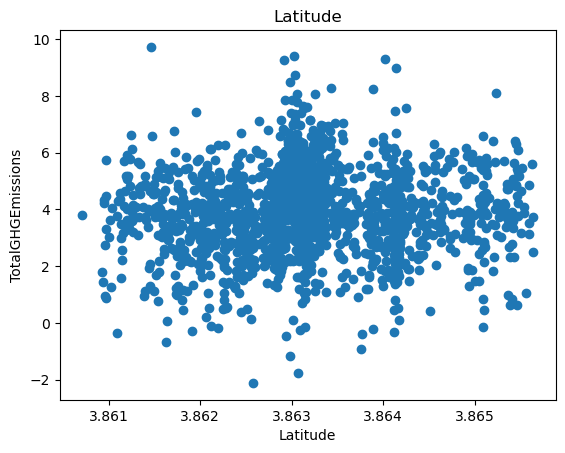

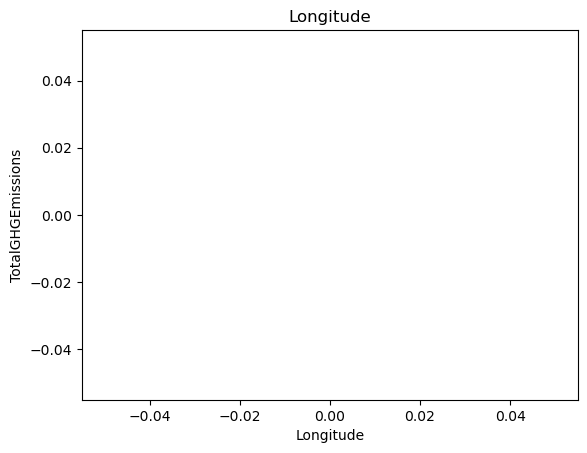

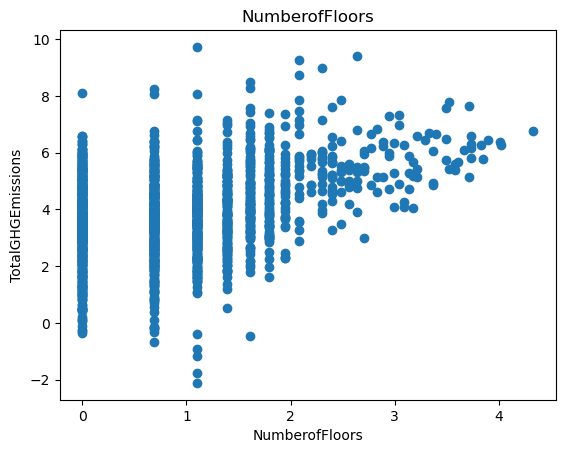

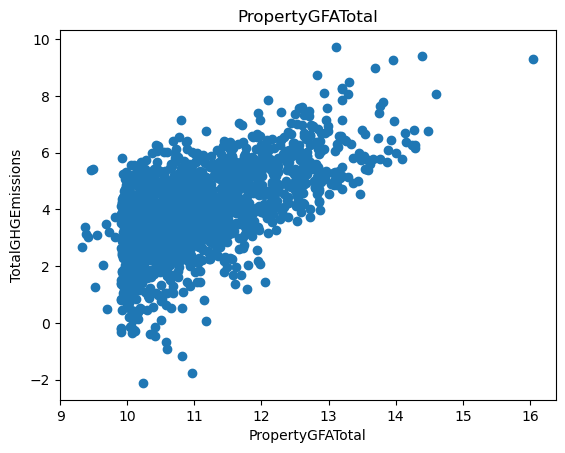

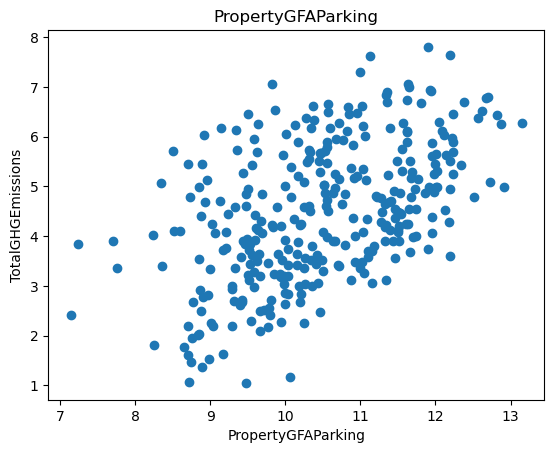

...

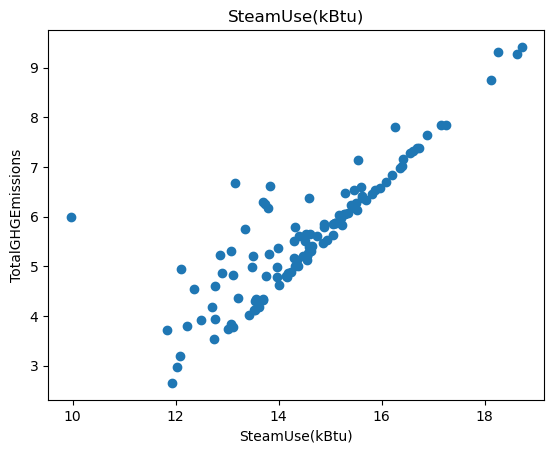

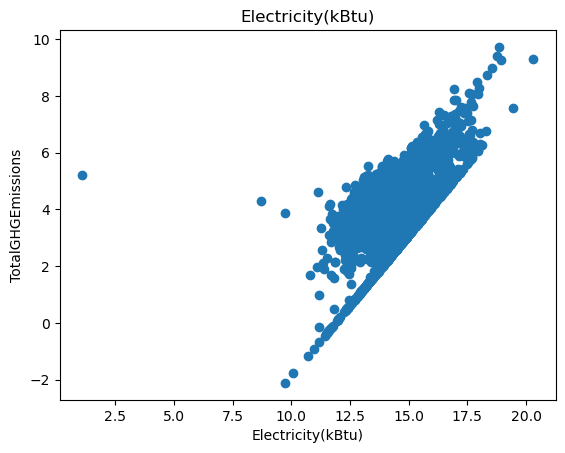

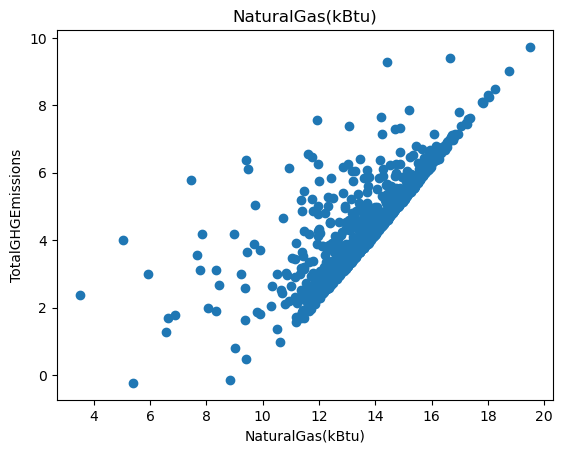

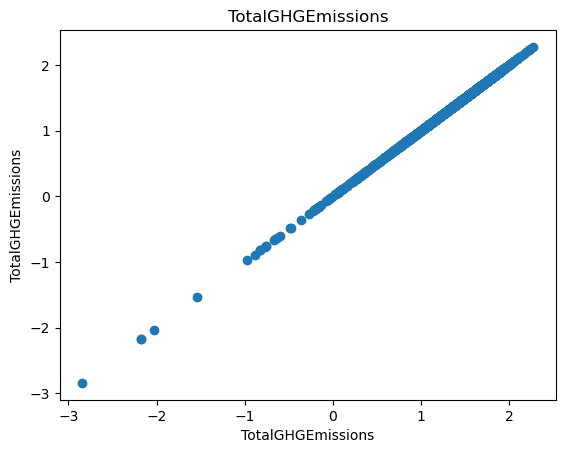

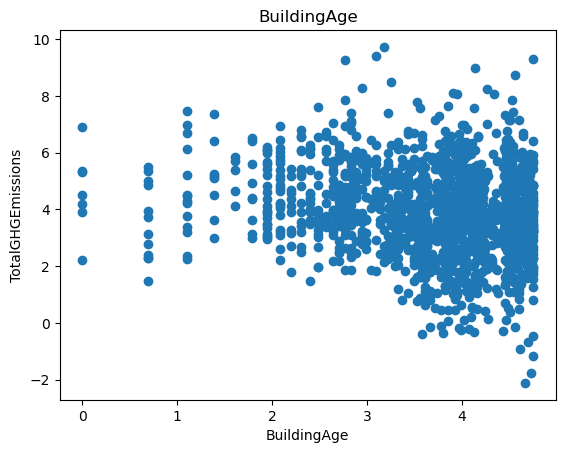

In [84]:
#Scatter des colonne vs TotalGHGEmissions
for feature in continuous_feature:
    data=df.copy()
    data[feature]=np.log(data[feature])
    data['TotalGHGEmissions']=np.log(data['TotalGHGEmissions'])
    plt.scatter(data[feature],data['TotalGHGEmissions'])
    plt.xlabel(feature)
    plt.ylabel('TotalGHGEmissions')
    plt.title(feature)
    plt.show();

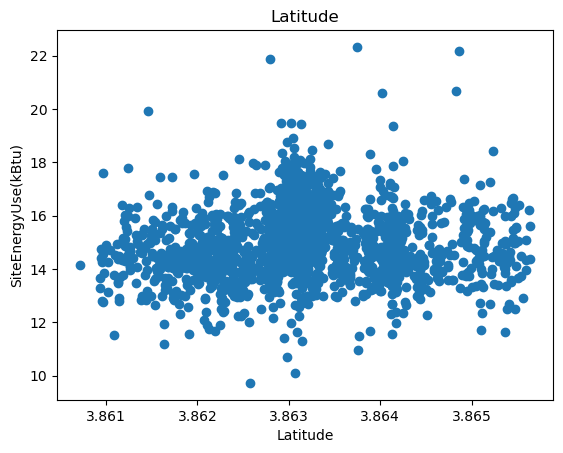

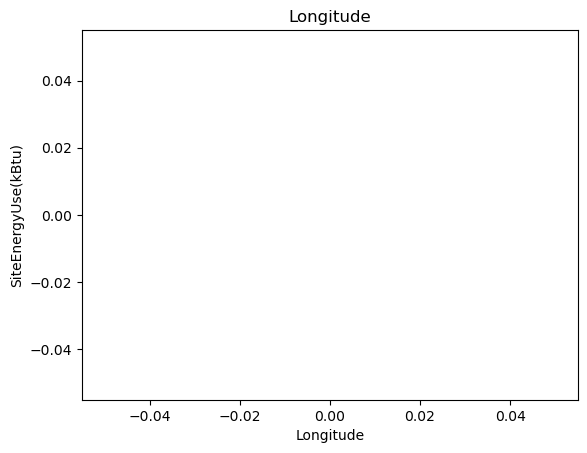

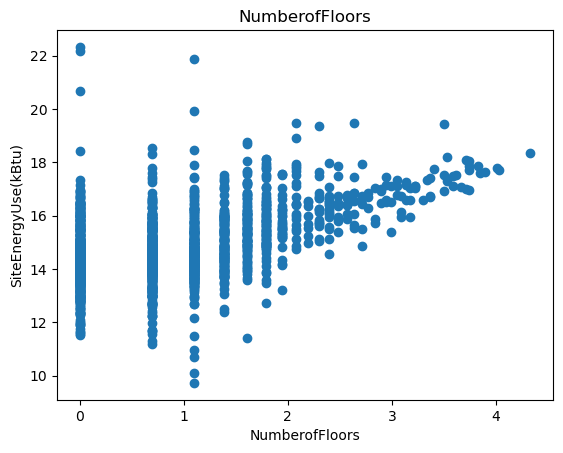

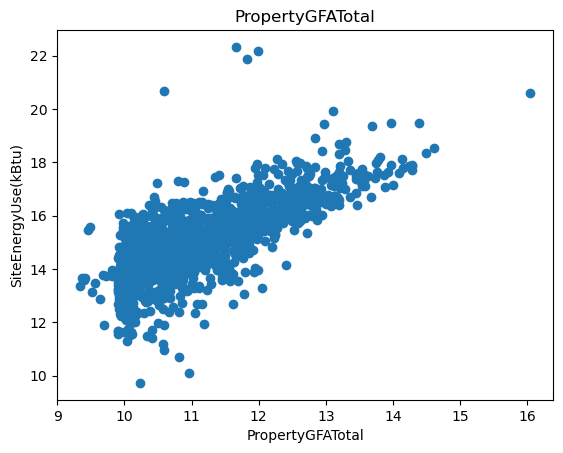

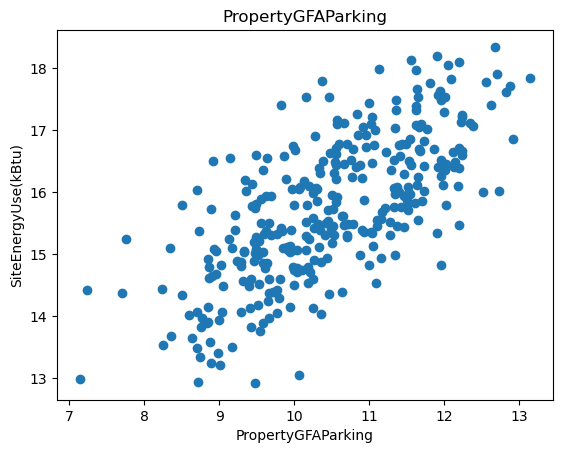

...

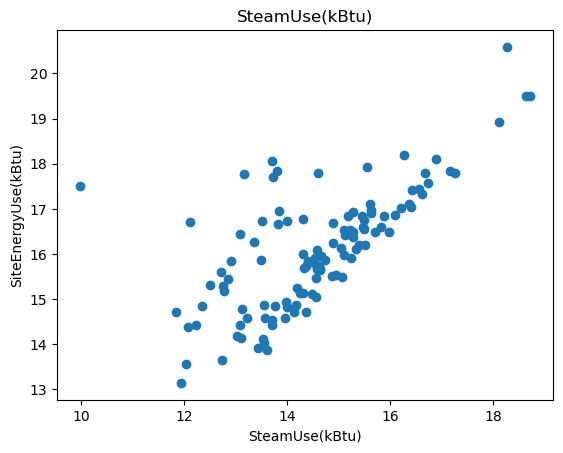

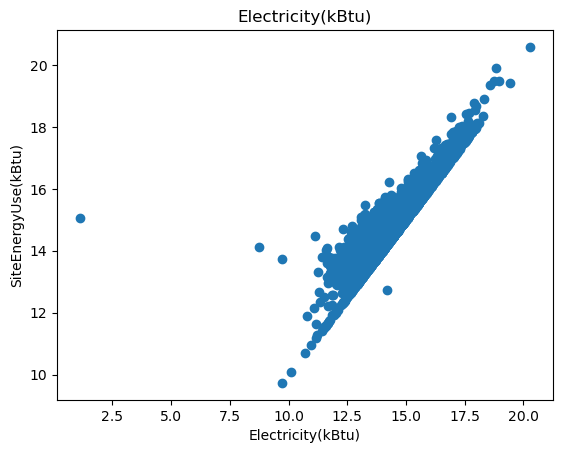

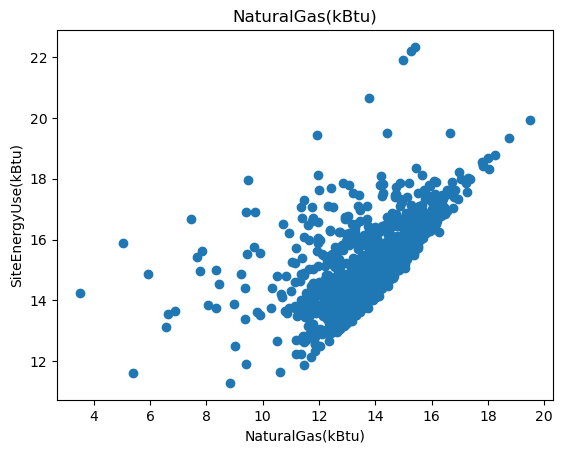

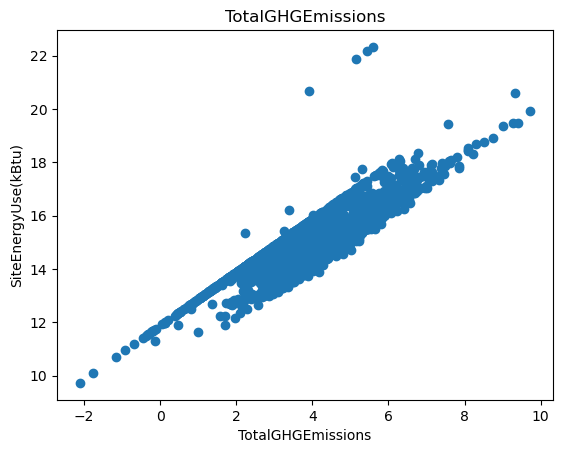

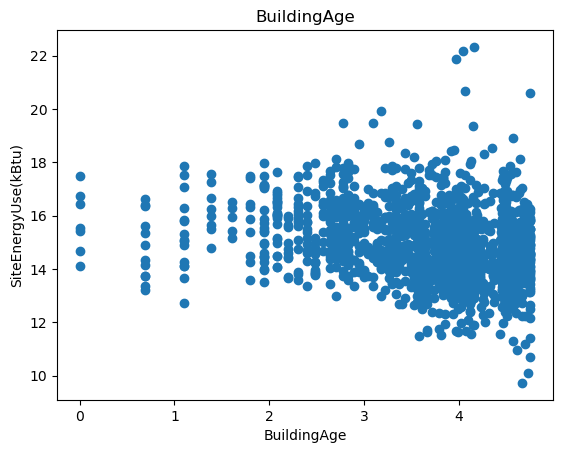

In [85]:
#Scatter des colonne vs SiteEnergyUse(kBtu)

for feature in continuous_feature:
    data=df.copy()
    data[feature]=np.log(data[feature])
    data['SiteEnergyUse(kBtu)']=np.log(data['SiteEnergyUse(kBtu)'])
    plt.scatter(data[feature],data['SiteEnergyUse(kBtu)'])
    plt.xlabel(feature)
    plt.ylabel('SiteEnergyUse(kBtu)')
    plt.title(feature)
    plt.show();

In [86]:
fig = px.scatter(df, x= "SiteEnergyUse(kBtu)", y = "TotalGHGEmissions",
                 color= "SiteEnergyUse(kBtu)", 
                title = "Consommation totale en fonction de la surface du plus grand type d'usage des bâtiments.")
fig.show()

In [87]:
# df_scatter['TotalGHGEmissionslog'] = np.log(df_scatter['TotalGHGEmissions'])
# df_scatter['SiteEnergyUse(kBtu)log'] = np.log(df_scatter['SiteEnergyUse(kBtu)'])


# fig = px.scatter(df_scatter, x= "SiteEnergyUse(kBtu)log", y = "TotalGHGEmissionslog",
#                  color= "SiteEnergyUse(kBtu)log", 
#                 title = "Consommation totale en fonction de la surface du plus grand type d'usage des bâtiments.")
# fig.show()

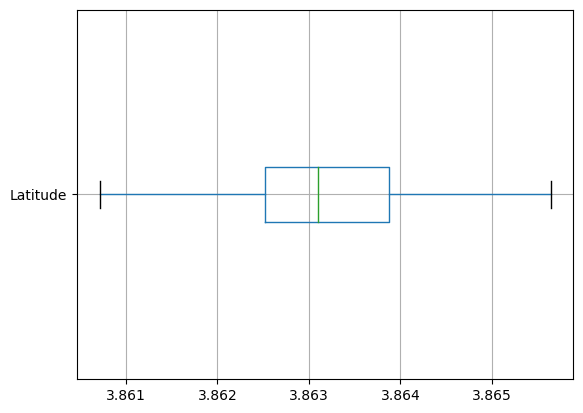

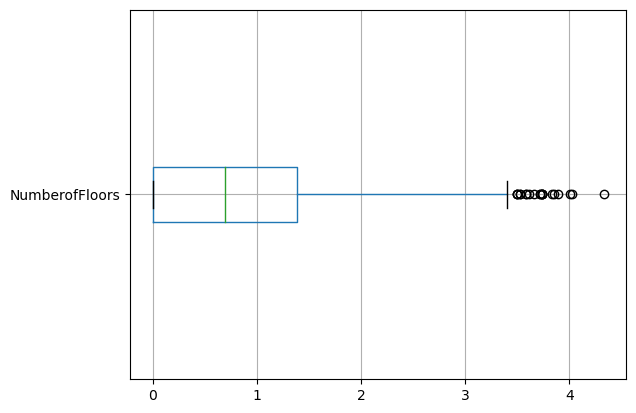

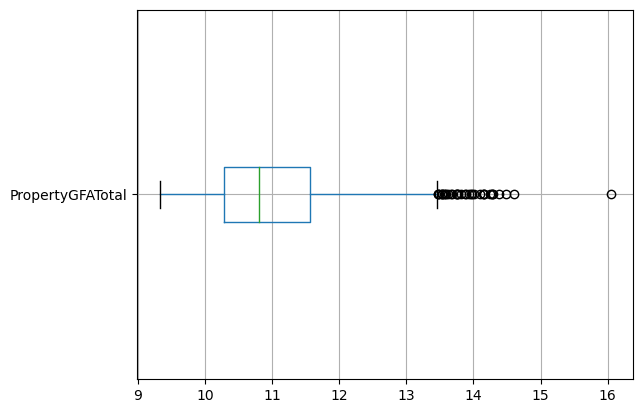

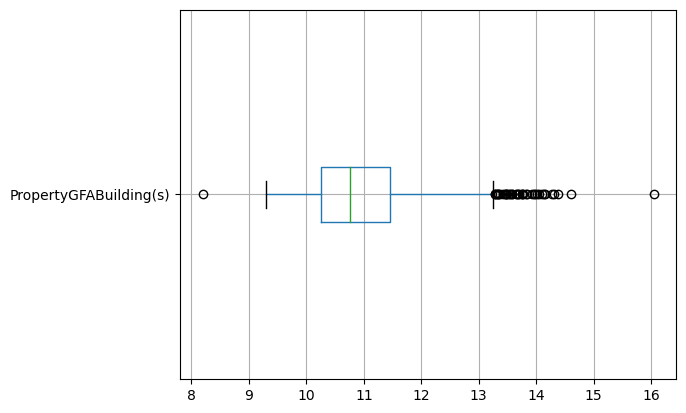

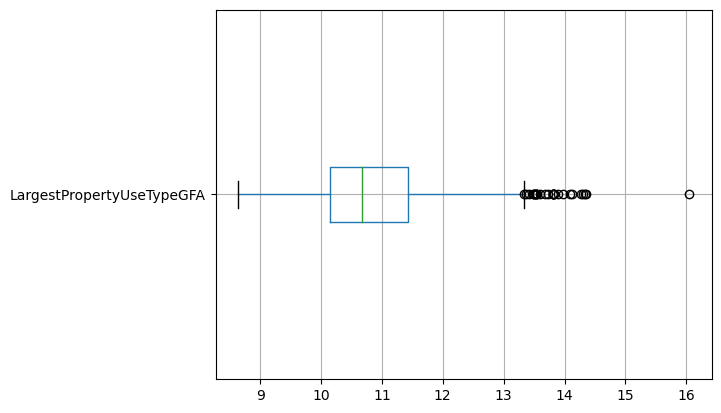

...

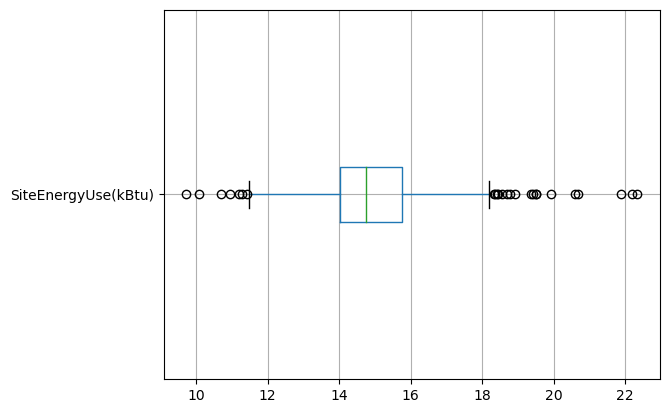

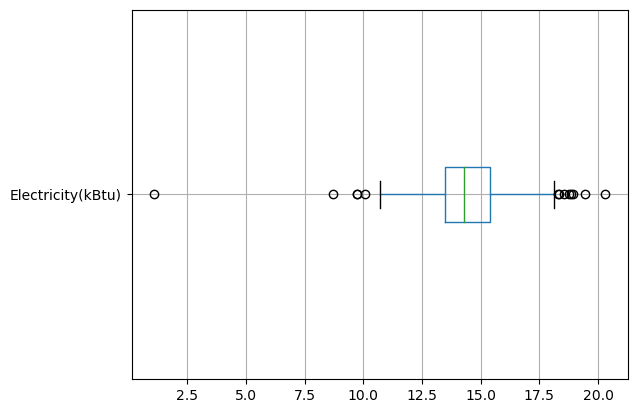

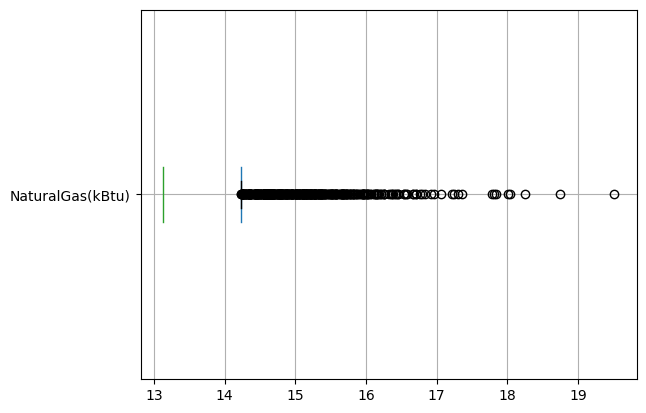

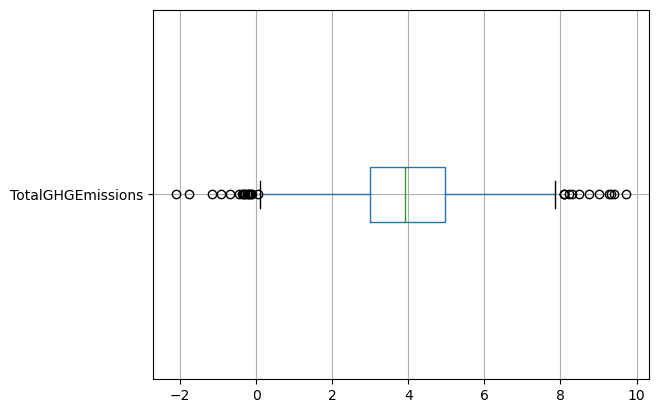

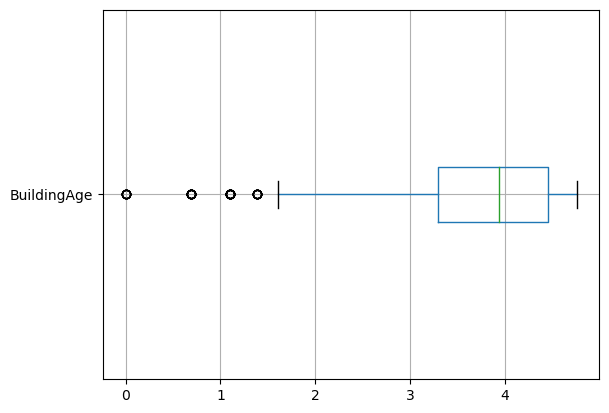

In [88]:
continuous_feature_boxplot = [feature for feature in continuous_feature if feature not in ['Longitude', 'PropertyGFAParking', 'SteamUse(kBtu)' ] ]

for feature in continuous_feature_boxplot:
    data_box=df.copy()
    data_box[feature]=np.log(data_box[feature])
    data_box.boxplot(column=feature, vert=False)  
#    plt.xlabel(feature)  
#    plt.title(feature)
    plt.show()


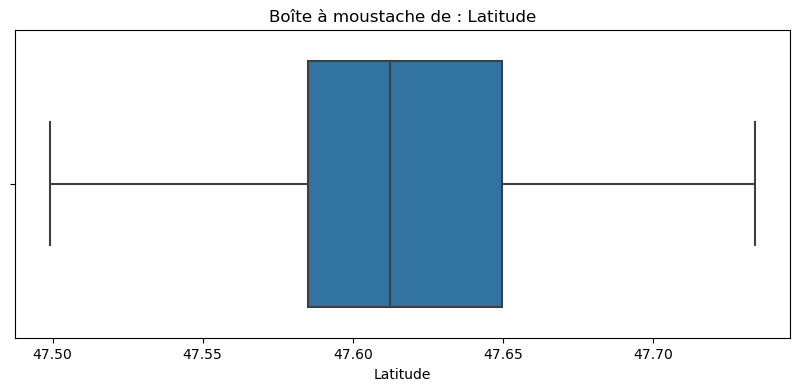

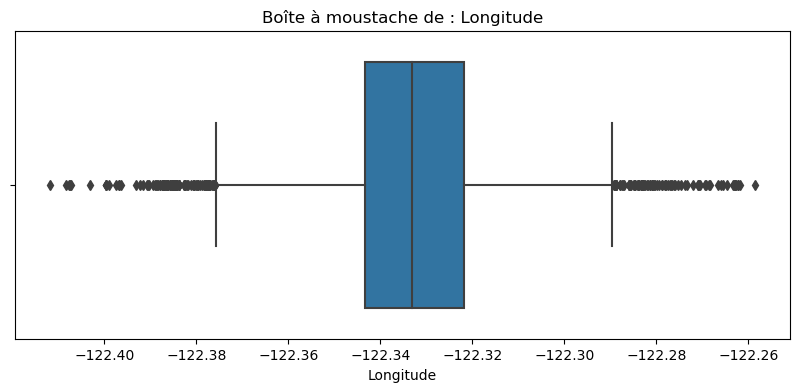

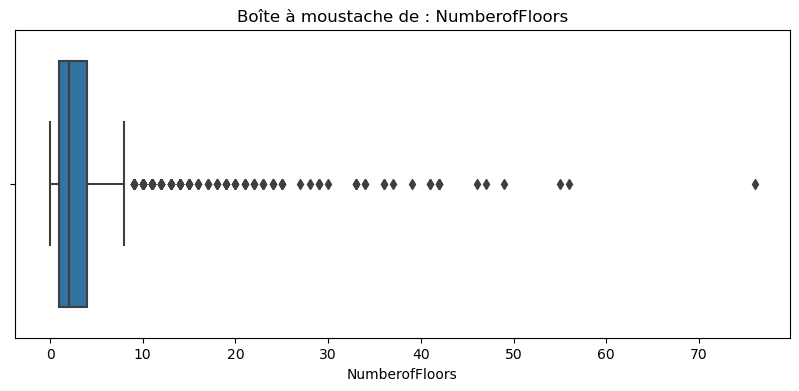

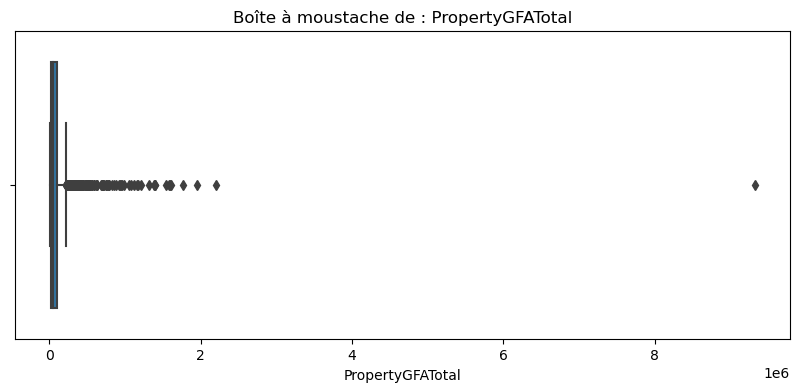

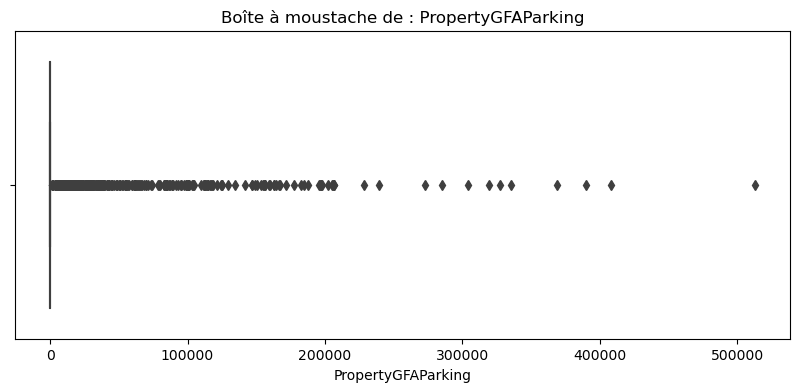

...

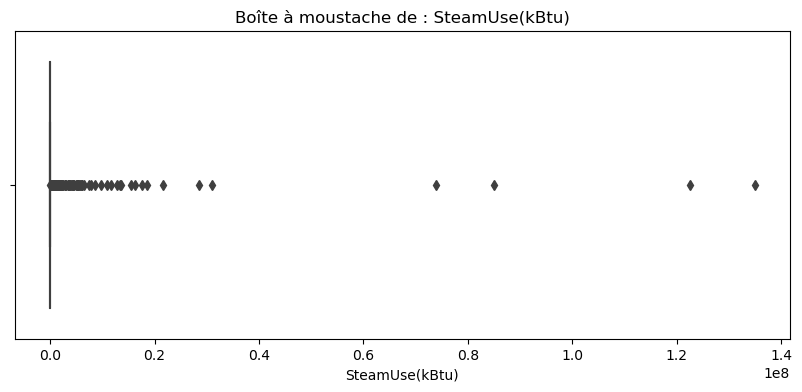

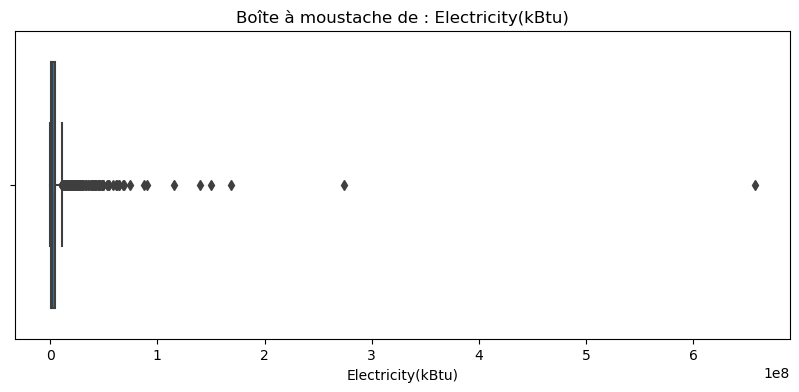

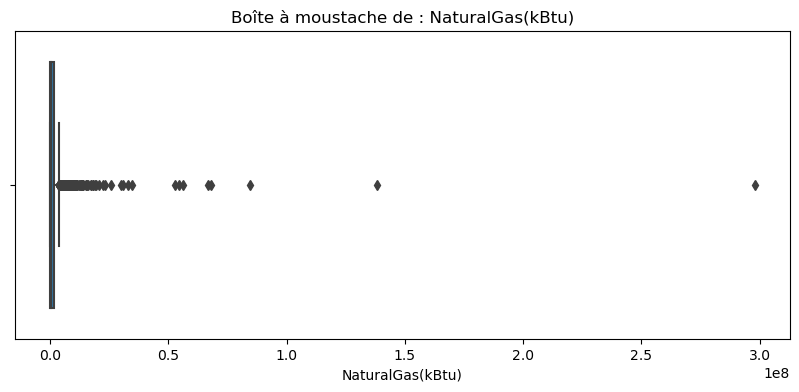

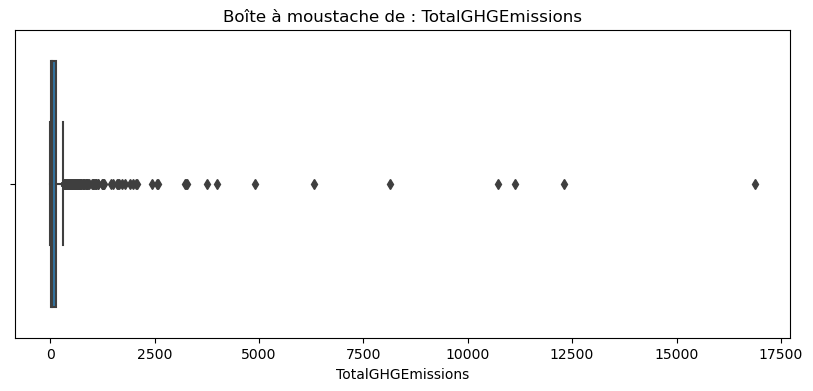

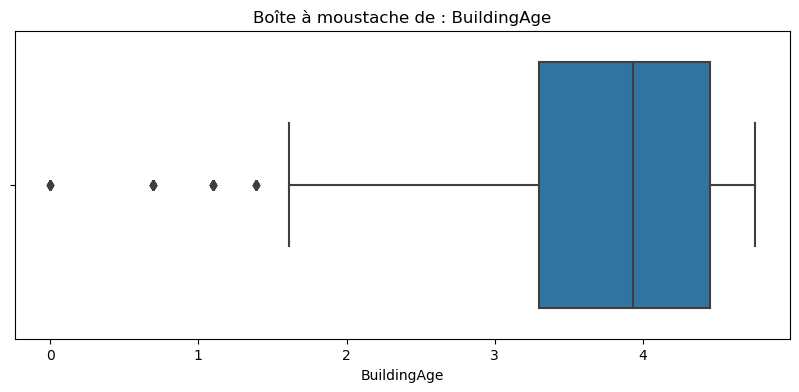

In [89]:
for col in continuous_feature:
    plt.figure(figsize = (10,4))
    sns.boxplot(data[col])
    chaine = 'Boîte à moustache de : ' + col
    plt.title(chaine)
    plt.show()

In [90]:
# # Excluding outliers to get a better scale
# plot_histograms(df=df, cols=numerique_columns_continue, file_name='2_1_histograms.png',
#                 figsize=(10,60), bins=50, layout=(14,1), skip_outliers=False,
#                 thresh=2, save_enabled=False)

In [91]:
# def plot_histograms(df, cols, file_name=None, bins=30, figsize=(12,7), skip_outliers=True, thresh=3, layout=(3,3), save_enabled=False):

#     fig = plt.figure(figsize=figsize)

#     for i, c in enumerate(cols,1):
#         ax = fig.add_subplot(*layout,i)
#         if skip_outliers:
#             ser = df[c][np.abs(st.zscore(df[c]))<thresh]
#         else:
#             ser = df[c]
#         ax.hist(ser,  bins=bins, color='grey')
#         ax.set_title(c)
#         ax.vlines(df[c].mean(), *ax.get_ylim(),  color='red', ls='-', lw=1.5)
#         ax.vlines(df[c].median(), *ax.get_ylim(), color='green', ls='-.', lw=1.5)
#         ax.vlines(df[c].mode()[0], *ax.get_ylim(), color='goldenrod', ls='--', lw=1.5)
#         ax.legend(['mean', 'median', 'mode'])
#         ax.title.set_fontweight('bold')
#         # xmin, xmax = ax.get_xlim()
#         # ax.set(xlim=(0, xmax/5))
        
#     plt.tight_layout(w_pad=0.5, h_pad=0.65)

#     if save_enabled: plt.savefig(os.getcwd()+'/FIG/'+file_name, dpi=400);
#     plt.show()

In [92]:
# sns.set(font_scale=2)
# for column in numerique_columns_continue:
#     plt.figure(figsize = (35,8))    
#     sns.boxplot(df[column])
#     chaine = 'Distribution de : ' + column
#     plt.title(chaine)
#     plt.xlabel(column)
#     plt.show();


#### Mulitvariées

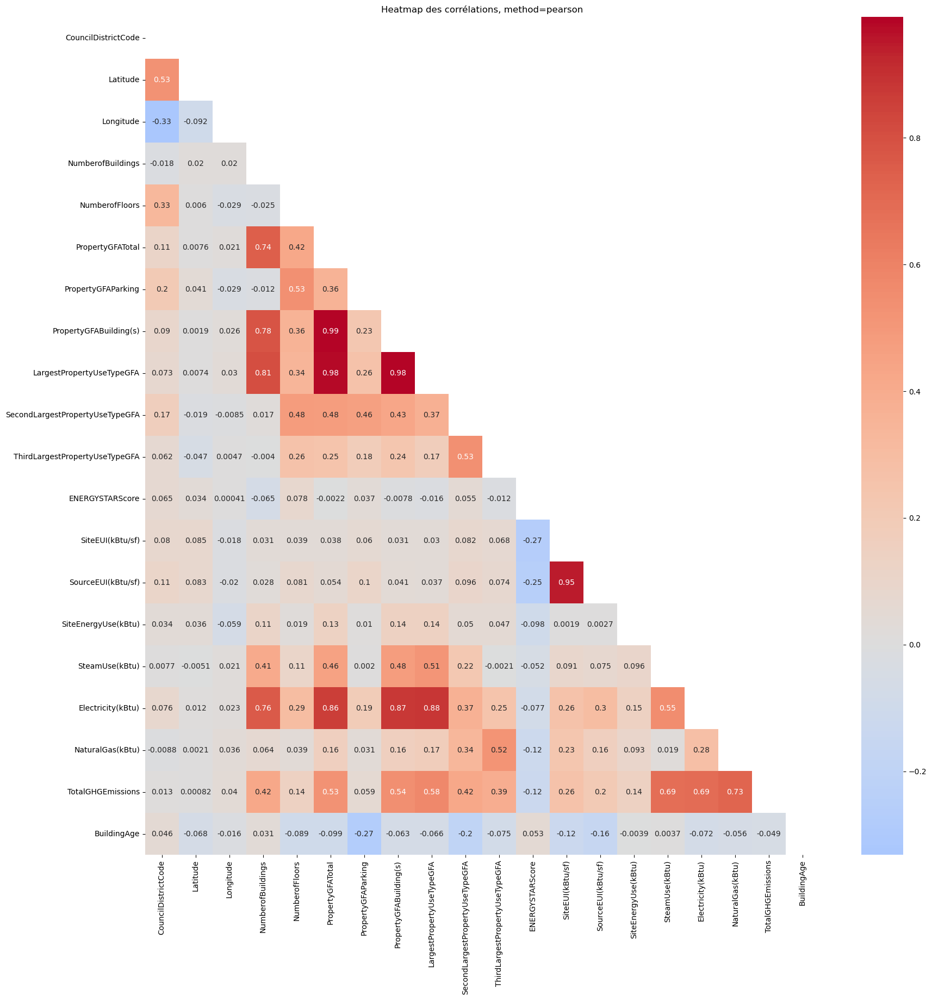

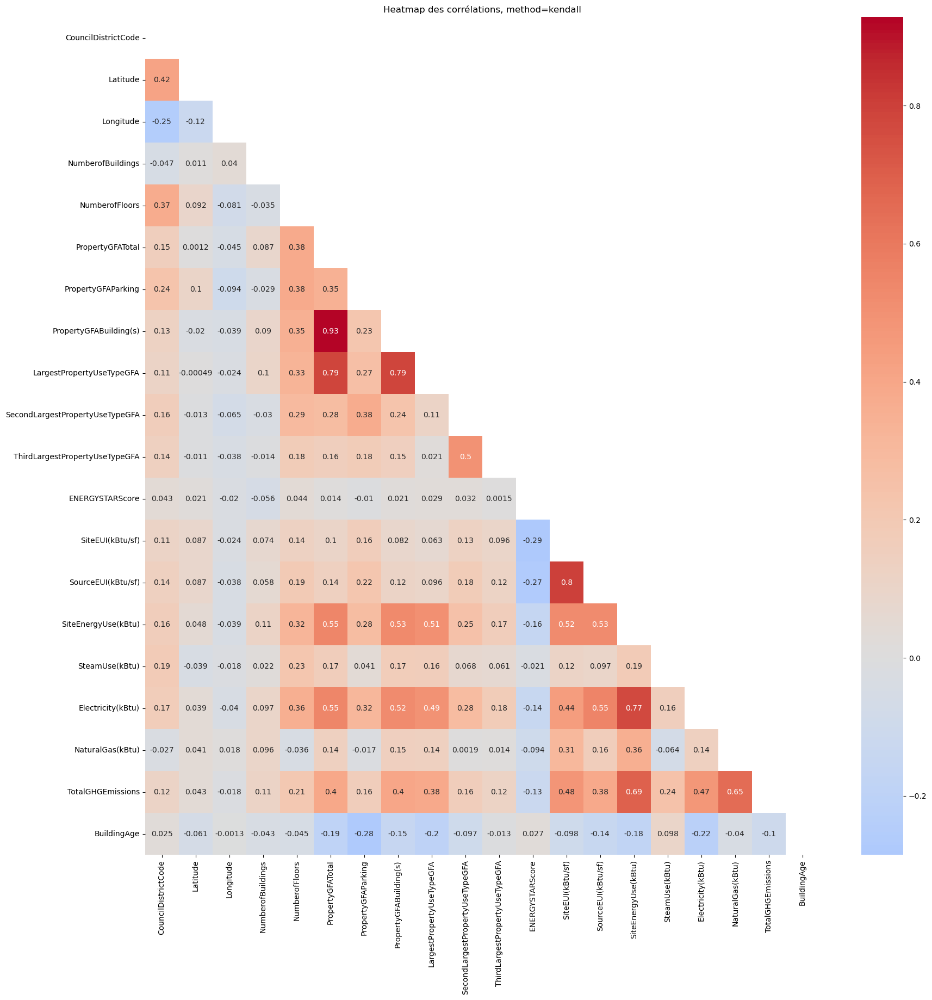

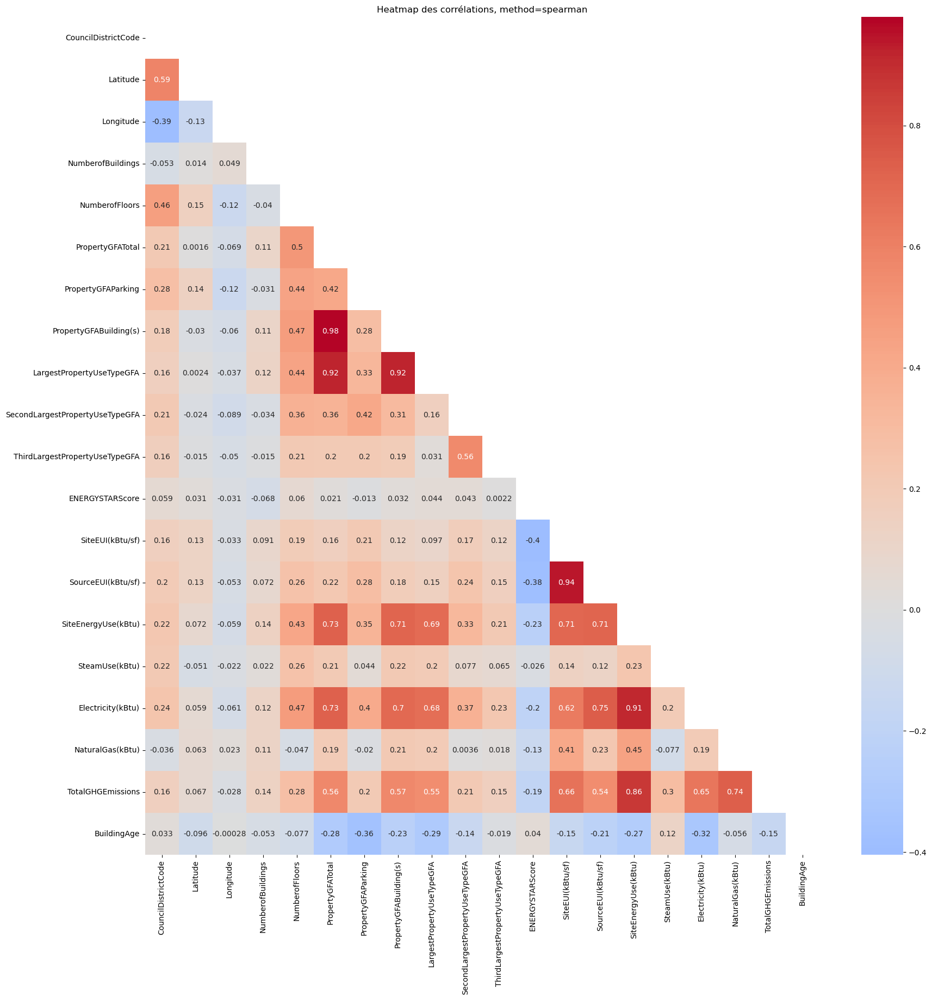

In [93]:
corr_methods=  ['pearson','kendall', 'spearman']

'''
pearson : standard correlation coefficient
kendall : Kendall Tau correlation coefficient
spearman :  Spearman rank correlation
'''

for corr_method in corr_methods:
    corr = df.corr(method=corr_method)
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True
    fig, ax = plt.subplots(figsize=(20,20))
    ax = sns.heatmap(corr, annot=True, mask=mask, center=0, cmap="coolwarm")
    plt.title('Heatmap des corrélations, method={}'.format(corr_method))
    plt.show()

In [94]:
corr = df.corr()
corr_columns = corr.columns[((corr < 1) & (corr > 0.8)).any(axis=0)]
display(corr_columns)

Index(['NumberofBuildings', 'PropertyGFATotal', 'PropertyGFABuilding(s)',
       'LargestPropertyUseTypeGFA', 'SiteEUI(kBtu/sf)', 'SourceEUI(kBtu/sf)',
       'Electricity(kBtu)'],
      dtype='object')

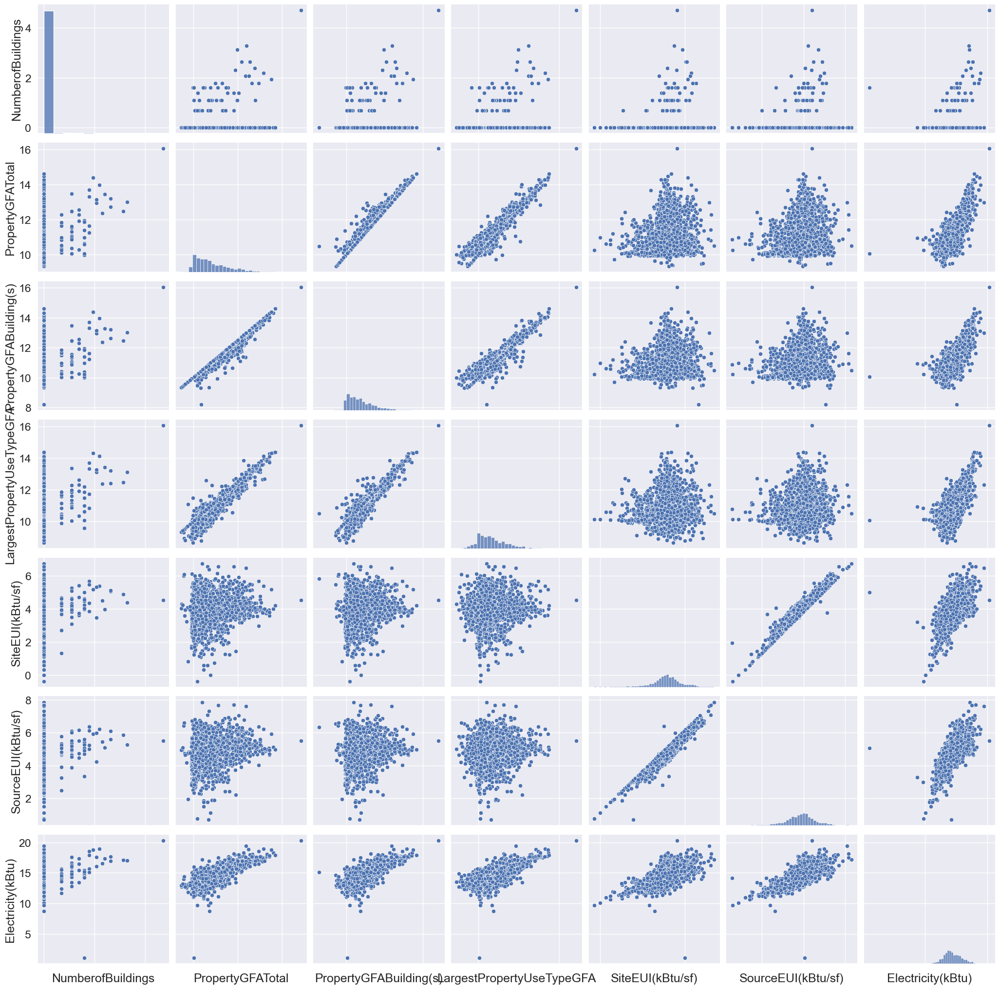

In [95]:
sns.set(font_scale=1.5)
g = sns.pairplot(np.log(df[corr_columns]), height=3)

# Pivoter les noms de colonnes de 90 degrés
for ax in g.axes[0]:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.show()

**Feature selection**

In [96]:
data = df.drop(['SecondLargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
                'ThirdLargestPropertyUseType'], axis = 1)
print(df.shape)
print(data.shape)
data = data.dropna()
print(data.shape)

(1653, 28)
(1653, 24)
(1652, 24)


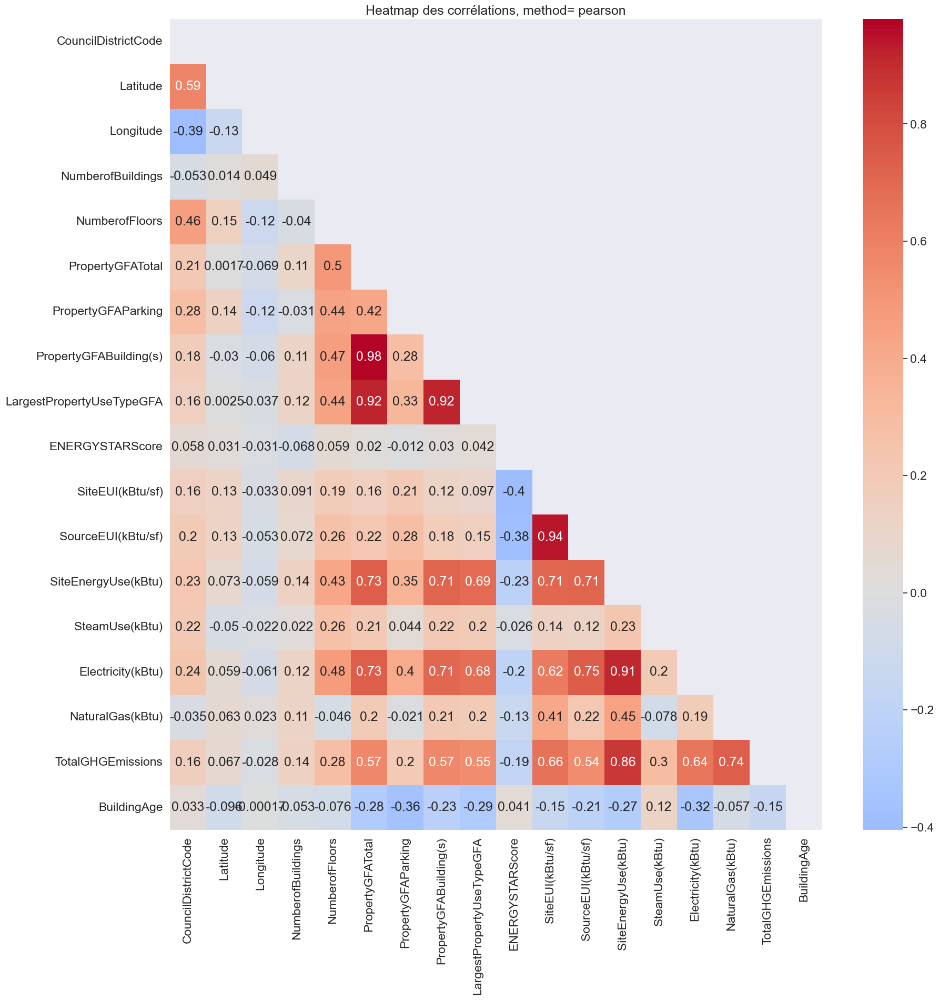

In [97]:
corr = data.corr(method=corr_method)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(20,20))
ax = sns.heatmap(corr, annot=True, mask=mask, center=0, cmap="coolwarm")
plt.title('Heatmap des corrélations, method= pearson')
plt.show()

Index(['PropertyGFATotal', 'PropertyGFABuilding(s)',
       'LargestPropertyUseTypeGFA', 'SiteEUI(kBtu/sf)', 'SourceEUI(kBtu/sf)'],
      dtype='object')

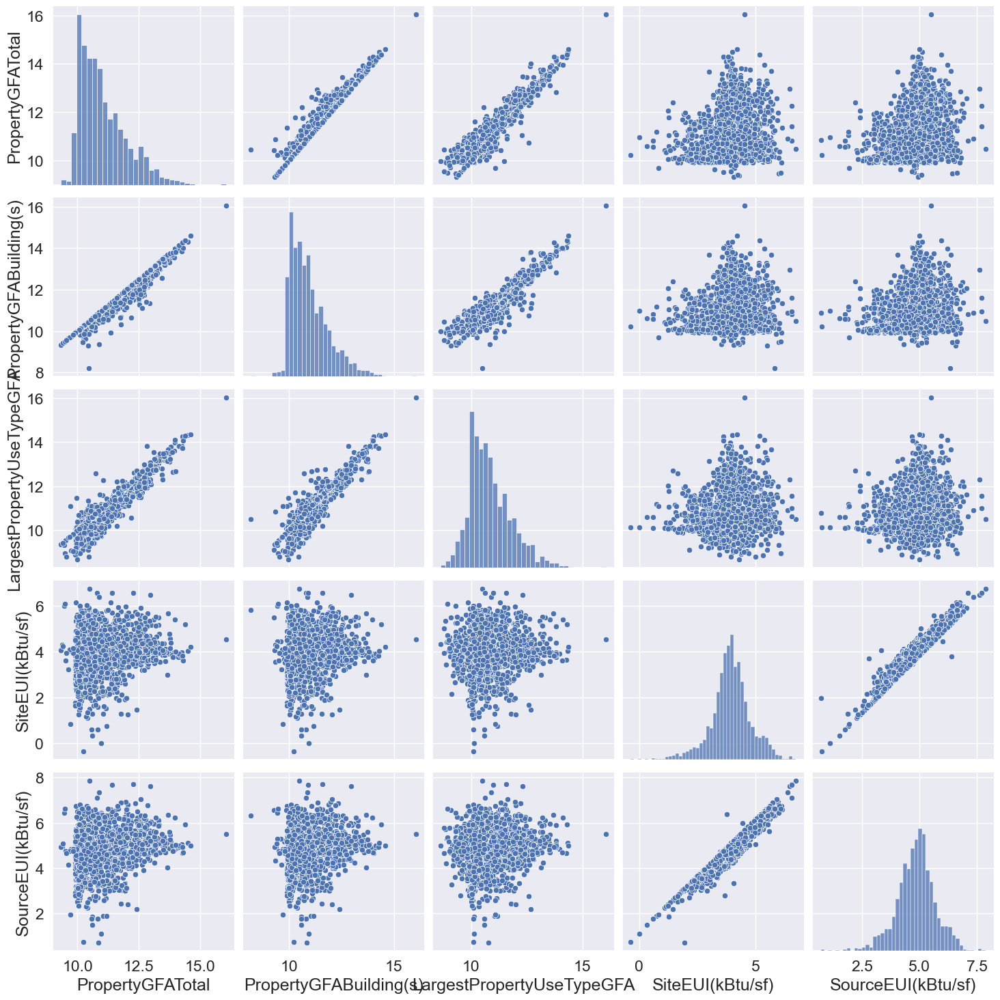

In [98]:
corr = data.corr()
corr_columns = corr.columns[((corr < 1) & (corr > 0.9)).any(axis=0)]
display(corr_columns)
sns.pairplot(np.log(data[corr_columns]), height = 3)

Afin de faire de pouvoir évaluer la puissance des modèles que nous testerons, je souhaite conserver deux jeu de données. Un jeu de données très raffinées (suppression des colonnes corrélées, des données secondaires et des manquants sur le energy score) et un jeu de données au raffinage limité.

In [99]:
corr_columns

Index(['PropertyGFATotal', 'PropertyGFABuilding(s)',
       'LargestPropertyUseTypeGFA', 'SiteEUI(kBtu/sf)', 'SourceEUI(kBtu/sf)'],
      dtype='object')

**SiteEUI(kBtu/sf)** : Site Energy Use Intensity (EUI) is a property's Site Energy Use divided by its gross floor area. 
> C'est une variable surfacique. On peut donc la supprimer car on dispose de **SiteEnergyUse**  

**SourceEUI(kBtu/sf)** : Source Energy Use Intensity (EUI) is a property's Source Energy Use divided by its gross floor area.
> C'est une variable surfacique. On peut la supprimer. 


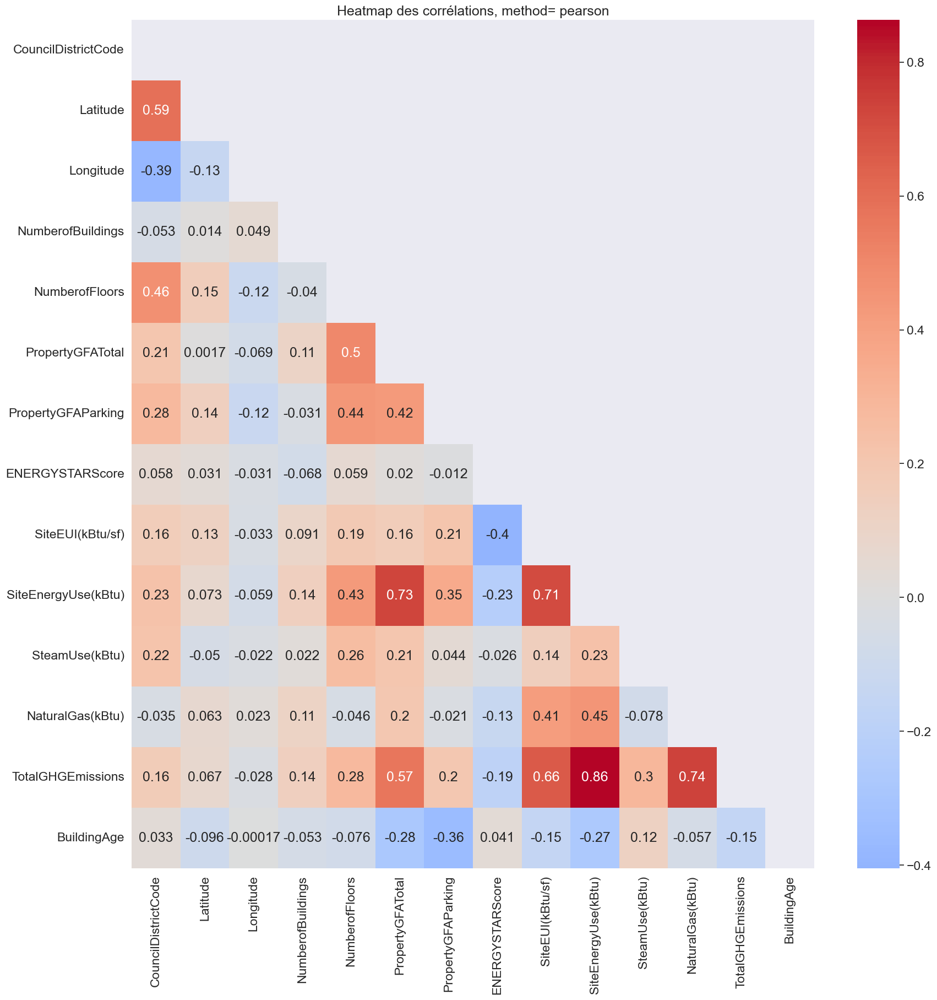

In [100]:
data_hard_refined =  data.drop(['PropertyName', 'Electricity(kBtu)','PropertyGFABuilding(s)',
                                'LargestPropertyUseType', 'LargestPropertyUseTypeGFA', 
                                'SourceEUI(kBtu/sf)','SourceEUI(kBtu/sf)', 'ListOfAllPropertyUseTypes'], axis = 1)

corr = data_hard_refined.corr(method=corr_method)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(20,20))
ax = sns.heatmap(corr, annot=True, mask=mask, center=0, cmap="coolwarm")
plt.title('Heatmap des corrélations, method= pearson')
plt.show()

Nous n'avons plus de données fortement corrélées, exceptées celles que nous voulons prédire. Nous pouvons maintenant exporter nos données.

**Analyse des Target**

In [101]:
data_hard_refined[["TotalGHGEmissions","SiteEnergyUse(kBtu)"]].describe()

,TotalGHGEmissions,SiteEnergyUse(kBtu)
count,1652.000000,1.652000e+03
mean,184.460890,1.654802e+07
std,754.104162,1.842019e+08
min,-0.800000,0.000000e+00
25%,20.042500,1.251083e+06
50%,49.580000,2.563995e+06
75%,141.387500,6.928335e+06
max,16870.980000,4.993620e+09


A l'aide de l'analyse exploratoire on peut faire l'hypothèse que les target ne suivent pas de loi normale. Confirmons la avec un test de normalité.

In [102]:
from scipy.stats import normaltest

for x in ["TotalGHGEmissions","SiteEnergyUse(kBtu)"]:
    k2,p = normaltest(data_hard_refined[x])
    print(f"test de normalité de {x}, p = {p}")
    print("-"*70)
    alpha = 1e-3
    if p < alpha:  #  hypothèse nulle: x est une distribution normale
        print(f"L'hypothèse nulle sur {x} peut être rejetée")
        print("-"*70)
    else:
        print(f"L'hypothèse nulle sur {x} peut être rejetée")

test de normalité de TotalGHGEmissions, p = 0.0
----------------------------------------------------------------------
L'hypothèse nulle sur TotalGHGEmissions peut être rejetée
----------------------------------------------------------------------
test de normalité de SiteEnergyUse(kBtu), p = 0.0
----------------------------------------------------------------------
L'hypothèse nulle sur SiteEnergyUse(kBtu) peut être rejetée
----------------------------------------------------------------------


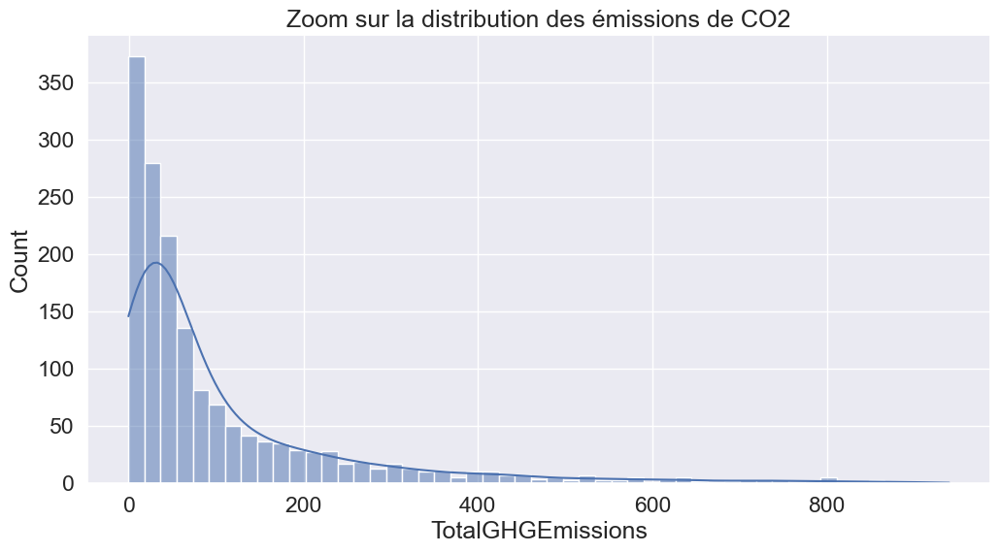

In [103]:
plt.figure(figsize = (12,6))
sns.histplot(data=data_hard_refined[(data_hard_refined['TotalGHGEmissions']< 1000)], x="TotalGHGEmissions", kde=True)
plt.title("Zoom sur la distribution des émissions de CO2")
plt.show()

On observe une forte asymétrie à droite on dois donc la transformer pour se rapprocher d'une distribution normale.

In [104]:
test1 = np.log1p(data_hard_refined['TotalGHGEmissions'])
test2 = np.log2(1+data_hard_refined['TotalGHGEmissions'])
test10 = np.log10(1+data_hard_refined['TotalGHGEmissions'])

#test_log = pd.DataFrame( {'test1': test1, 'test2': test2, 'test10': test10})
print("Variance avec log1p : ",test1.var())
print("Variance avec log2p :", test2.var())
print("Variance avec log10p :", test10.var())

Variance avec log1p :  2.151122252904724
Variance avec log2p : 4.477279131546786
Variance avec log10p : 0.405726818599806


In [105]:
# import plotly.express as px

# hist_data = [test1, test2, test10]
# group_labels = ['log1p', 'log2p', 'log10p']
# fig = px.histogram(hist_data, nbins=50, color_discrete_sequence=['#EF553B', '#00CC96', '#636EFA'],
#                    barmode='overlay', opacity=0.7, histnorm='probability density',labels=dict(value="CO2 Emissions (metric tons)"))

# fig.update_layout(title_text='Impact des différentes transformations logarithmiques sur la distribution des émissions de CO2 ',
#                   width=800,height=900)
# fig.show()


On choisi la transformation qui donne la plus faible variance donc log10 + 1

In [106]:
data_hard_refined["TotalGHGEmissionsLog"]= np.log10(1+data_hard_refined["TotalGHGEmissions"])

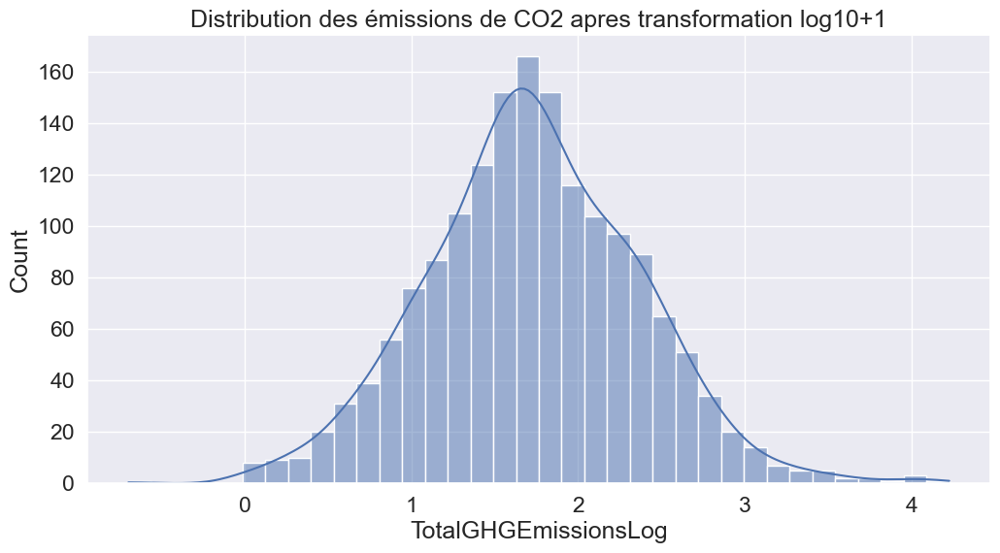

In [107]:
plt.figure(figsize = (12,6))
sns.histplot(data=data_hard_refined, x="TotalGHGEmissionsLog", kde=True)
plt.title("Distribution des émissions de CO2 apres transformation log10+1")
plt.show()

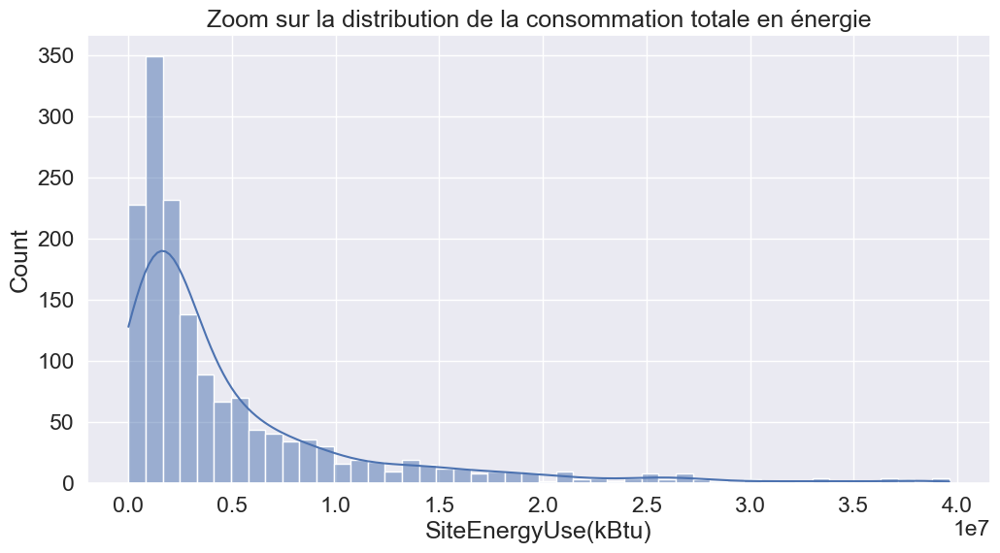

In [108]:
plt.figure(figsize = (12,6))
sns.histplot(data= data_hard_refined[data_hard_refined["SiteEnergyUse(kBtu)"]<0.4*10**8 ], x = "SiteEnergyUse(kBtu)", kde=True )
plt.title("Zoom sur la distribution de la consommation totale en énergie")
plt.show()

In [109]:
SEUtest1 = np.log1p(data_hard_refined['SiteEnergyUse(kBtu)'])
SEUtest2 = np.log2(1 + data_hard_refined['SiteEnergyUse(kBtu)'])
SEUtest10 = np.log10(1 + data_hard_refined['SiteEnergyUse(kBtu)'])

print("Variance avec log1p : ",SEUtest1.var())
print("Variance avec log2p :", SEUtest2.var())
print("Variance avec log10p :", SEUtest10.var())

Variance avec log1p :  2.3771947411703156
Variance avec log2p : 4.947819396081545
Variance avec log10p : 0.4483667342592171


On choisi la transformation qui donne la plus faible variance donc log10 + 1.

In [110]:
data_hard_refined["SiteEnergyUse(kBtu)Log"]= np.log10(1+data_hard_refined["SiteEnergyUse(kBtu)"])

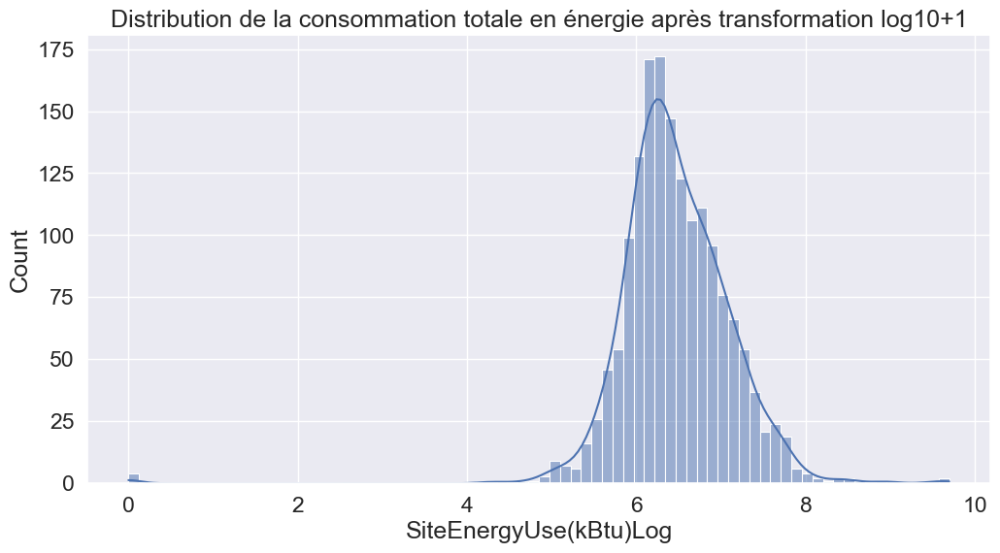

In [111]:
plt.figure(figsize = (12,6))
sns.histplot(data=data_hard_refined, x="SiteEnergyUse(kBtu)Log", kde=True)
plt.title("Distribution de la consommation totale en énergie après transformation log10+1")
plt.show()

In [112]:
fig = px.scatter(data_hard_refined,
                 x="TotalGHGEmissionsLog",
                 y="SiteEnergyUse(kBtu)Log",
                 title = "Répartition des émissions de CO2 en fonction de la consommation totale en énergie",
                 color = "SiteEnergyUse(kBtu)Log",
                color_continuous_scale=px.colors.sequential.Cividis_r)
fig.show()

In [113]:
fig = px.scatter(data_hard_refined,
                 y="TotalGHGEmissionsLog",
                 x="SiteEnergyUse(kBtu)Log",
                 title = "Répartition de la consommation totale en énergie en fonction des émissions de CO2",
                 color = "SiteEnergyUse(kBtu)Log",
                color_continuous_scale=px.colors.sequential.Viridis)
fig.show()

In [114]:
print(data_hard_refined.shape)
data_hard_refined.head()

(1652, 19)


,BuildingType,PrimaryPropertyType,CouncilDistrictCode,Neighborhood,Latitude,Longitude,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(kBtu),TotalGHGEmissions,BuildingAge,TotalGHGEmissionsLog,SiteEnergyUse(kBtu)Log
0,NonResidential,Hotel,7,DOWNTOWN,47.61220,-122.33799,1.0,12,88434,0,60.0,81.699997,7226362.5,2003882.00,1276453.0,249.98,89,2.399639,6.858920
1,NonResidential,Hotel,7,DOWNTOWN,47.61317,-122.33393,1.0,11,103566,15064,61.0,94.800003,8387933.0,0.00,5145082.0,295.86,20,2.472552,6.923655
2,NonResidential,Hotel,7,DOWNTOWN,47.61393,-122.33810,1.0,41,956110,196718,43.0,96.000000,72587024.0,21566554.00,1493800.0,2089.28,47,3.320204,7.860859
3,NonResidential,Hotel,7,DOWNTOWN,47.61412,-122.33664,1.0,10,61320,0,56.0,110.800003,6794584.0,2214446.25,1811213.0,286.43,90,2.458532,6.832163
4,NonResidential,Hotel,7,DOWNTOWN,47.61375,-122.34047,1.0,18,175580,62000,75.0,114.800003,14172606.0,0.00,8803998.0,505.01,36,2.704159,7.151450


<AxesSubplot:>

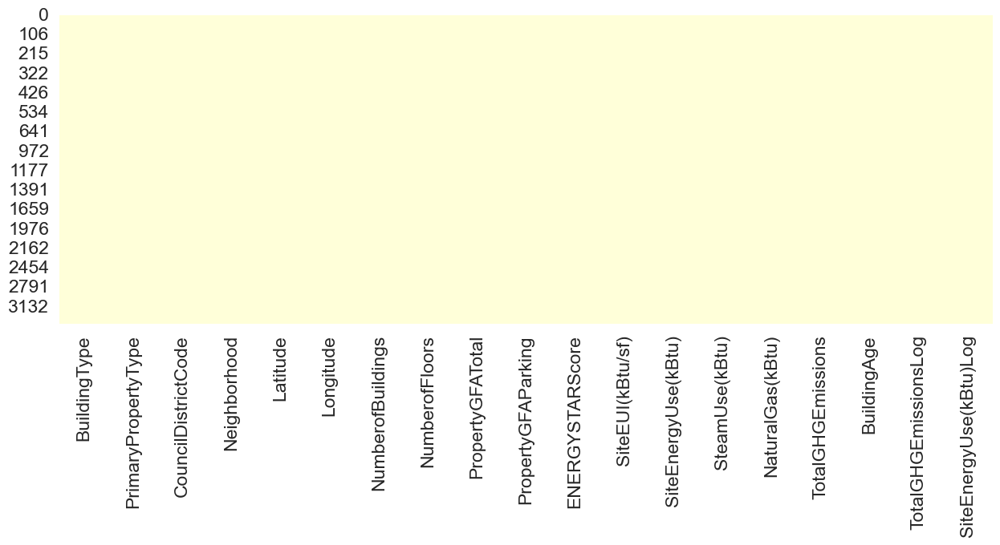

In [115]:
fig = plt.figure(figsize=(15,5))
sns.heatmap(data_hard_refined.isnull(), cbar=False, cmap='YlGnBu')

**Enregistrez les jeux de données**

In [116]:
data_hard_refined.to_csv('data_final.csv', index=False)
print('Data shape = ', data_hard_refined.shape)


Data shape =  (1652, 19)
